# Week 48

### **1. AUC (Area Under the Curve)**

* **What it measures:**
  How well the model can distinguish between positive and negative cases overall.
* **Range:** 0.5 (random guessing) → 1.0 (perfect separation).
* **Interpretation:**

  * The higher the AUC, the better the model is at ranking positive samples higher than negatives.
  * For example, in link prediction, a high AUC means the model gives higher probabilities to true links than to false ones.

---

### **2. Precision**

* **What it measures:**
  Out of all the predictions the model said were positive, how many were actually positive?
* **Formula:**
  `Precision = True Positives / (True Positives + False Positives)`
* **Interpretation:**

  * High Precision means *few false alarms* (the model doesn’t label too many wrong links as existing).
  * Think of it as **“accuracy among positives.”**

---

### **3. Recall**

* **What it measures:**
  Out of all the actual positive cases, how many did the model correctly identify?
* **Formula:**
  `Recall = True Positives / (True Positives + False Negatives)`
* **Interpretation:**

  * High Recall means *few misses* (the model finds most of the true links).
  * Think of it as **“coverage of the positives.”**

---

### **4. F1 Score**

* **What it measures:**
  The **balance** between Precision and Recall.
* **Formula:**
  `F1 = 2 × (Precision × Recall) / (Precision + Recall)`
* **Interpretation:**

  * A high F1 means the model performs well both in detecting true positives and in avoiding false positives.
  * It’s especially useful when the dataset is **imbalanced** (e.g., far more negative links than positive ones).

---

### **In my food web link-prediction context:**

* **AUC** tells us the *overall ranking quality* of predicted links.
* **Precision** tells us *how reliable* our predicted links are.
* **Recall** tells us *how complete* our predictions are.
* **F1 Score** gives us a *single balanced measure* of both reliability and completeness.

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results BEFORE filter: 290
[INFO] Foodwebs in results AFTER filter: 157


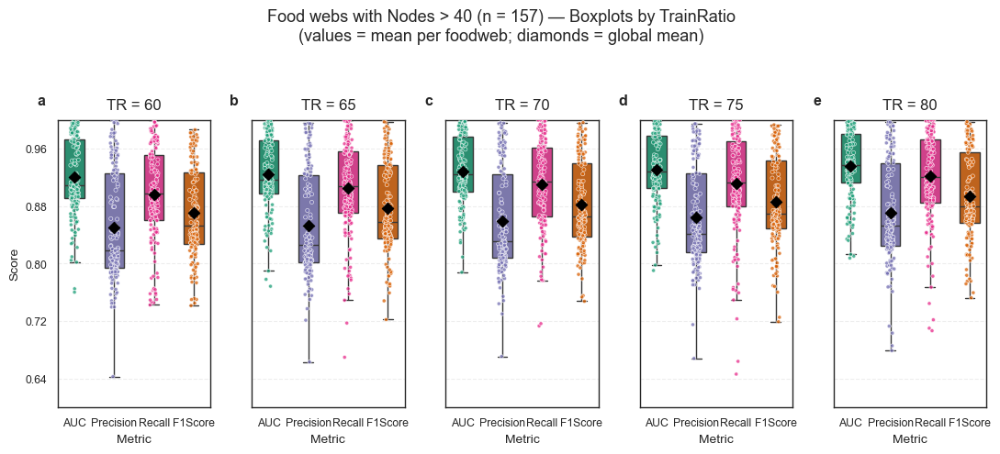

In [1]:
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_context("paper")
sns.set_style("white")

# === Configuration ===
RESULTS_DIR = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs/"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
SINGLE_FILE = None  # disable when using directory
METRICS = ["AUC", "Precision", "Recall", "F1Score"]
MAX_PLOTS = None   # ⬅️ still limits how many CSVs are read; set to None for all 290
NODES_THRESHOLD = 40

# === Utility functions ===
def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Make foodweb labels comparable between results CSV and FOODWEB_CSV.
    - strip spaces
    - drop extension (.mat, .csv, etc.)
    - remove common suffixes: _tax_mass, _tax, _mass, _results, _random
    - collapse multiple underscores
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # remove .mat, .csv, etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def load_results(results_dir=None, single_file=None) -> pd.DataFrame:
    paths = []
    if results_dir and os.path.isdir(results_dir):
        paths = sorted(glob.glob(os.path.join(results_dir, "*.csv")))
        if MAX_PLOTS is not None:
            paths = paths[:MAX_PLOTS]
            print(f"[INFO] Limiting to first {len(paths)} CSV files for plotting.")
    if single_file and os.path.isfile(single_file):
        paths.append(single_file)
    if not paths:
        raise FileNotFoundError("No CSV files found. Check RESULTS_DIR or SINGLE_FILE.")

    frames = []
    for p in paths:
        try:
            df = pd.read_csv(p)
        except Exception as e:
            print(f"Skipping {p}: {e}")
            continue

        df.columns = [c.strip() for c in df.columns]
        # Normalize to upper for metrics, keep original for TrainRatio detection
        upper_map = {c: c.upper() for c in df.columns}
        df = df.rename(columns=upper_map)
        if "FOODWEB" not in df.columns:
            df["FOODWEB"] = derive_foodweb_from_filename(p)
        frames.append(df)

    if not frames:
        raise ValueError("No valid results loaded.")
    return pd.concat(frames, ignore_index=True)

# === Load (ALL train ratios kept) and preprocess ===
df = load_results(results_dir=RESULTS_DIR, single_file=SINGLE_FILE)

# === Load foodweb metadata and filter Nodes > NODES_THRESHOLD ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

# Normalized keys on BOTH sides
meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
df["FW_KEY"] = df["FOODWEB"].apply(normalize_fw_label)

# Foodwebs with Nodes > NODES_THRESHOLD in metadata
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")
print(f"[INFO] Foodwebs in results BEFORE filter: {df['FW_KEY'].nunique()}")

# Filter results
df = df[df["FW_KEY"].isin(allowed_fw_keys)].copy()
df.drop(columns=["FW_KEY"], inplace=True)

print(f"[INFO] Foodwebs in results AFTER filter: {df['FOODWEB'].nunique()}")

if df.empty:
    raise ValueError(f"No foodwebs left after filtering Nodes > {NODES_THRESHOLD}.")

# === Normalize TrainRatio into a single 'TRAINRATIO' column (as percentages) ===
tr_candidates = [c for c in df.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
if not tr_candidates:
    raise ValueError("No TrainRatio column found.")
tr_col = tr_candidates[0]
df["TRAINRATIO"] = pd.to_numeric(df[tr_col], errors="coerce")
if df["TRAINRATIO"].between(0, 1).all():
    df["TRAINRATIO"] = (df["TRAINRATIO"] * 100).round().astype(int)
else:
    df["TRAINRATIO"] = df["TRAINRATIO"].astype(int)

# === Auto-detect & sort TrainRatios present in the data ===
TRAIN_RATIOS_DETECTED = sorted(df["TRAINRATIO"].dropna().unique().astype(int).tolist())
if not TRAIN_RATIOS_DETECTED:
    raise ValueError("No valid TrainRatio values were detected.")

# === Prepare long form with TRAINRATIO kept ===
present = [m for m in METRICS if m.upper() in df.columns]
if not present:
    raise ValueError("None of the requested METRICS were found.")
long_frames = []
for m in present:
    mu = m.upper()
    tmp = df[["FOODWEB", "TRAINRATIO", mu]].rename(columns={mu: "Value"})
    tmp["Metric"] = m
    long_frames.append(tmp)
df_long = pd.concat(long_frames, ignore_index=True)

# === Aggregate: mean per FOODWEB, then global mean across foodwebs ===
df_web_means = (
    df_long
    .groupby(["FOODWEB", "TRAINRATIO", "Metric"], as_index=False)["Value"]
    .mean()
)

df_mean_overall = (
    df_web_means
    .groupby(["TRAINRATIO", "Metric"], as_index=False)["Value"]
    .mean()
    .rename(columns={"Value": "MeanValue"})
)

n_foodwebs = df_long["FOODWEB"].nunique()

# Custom palette (per metric, consistent across subplots)
metric_colors = {
    "AUC": "#1b9e77", "Precision": "#d95f02",
    "Recall": "#7570b3", "F1Score": "#e7298a",
}
palette = {k: metric_colors.get(k, "#5aa9e6") for k in df_long["Metric"].unique()}
order = list(present)
pal_list = [palette[m] for m in order]

# === Plot: single figure, columns = all detected TrainRatios ===
n_cols = max(1, len(TRAIN_RATIOS_DETECTED))
fig_w = max(7, 2.2 * n_cols)
fig, axes = plt.subplots(1, n_cols, figsize=(fig_w, 5), sharey=True)

if n_cols == 1:
    axes = [axes]

letters_all = [chr(ord('a') + i) for i in range(len(TRAIN_RATIOS_DETECTED))]

for j, tr in enumerate(TRAIN_RATIOS_DETECTED):
    ax = axes[j]
    sub_web = df_web_means[df_web_means["TRAINRATIO"] == tr]
    sub_mean = df_mean_overall[df_mean_overall["TRAINRATIO"] == tr]

    if sub_web.empty:
        ax.set_axis_off()
        ax.text(0.5, 0.5, f"No data\nTR={tr}", ha="center", va="center", fontsize=10)
        continue

    sns.boxplot(
        data=sub_web, x="Metric", y="Value",
        order=order, palette=pal_list,
        hue="Metric",
        width=0.5, showfliers=False,
        ax=ax
    )
    sns.stripplot(
        data=sub_web, x="Metric", y="Value",
        order=order, palette=pal_list,
        hue="Metric",
        dodge=False, jitter=0.10,
        size=3.0, alpha=0.75,
        edgecolor="white", linewidth=0.5,
        ax=ax
    )

    if ax.get_legend() is not None:
        ax.get_legend().remove()

    for x_idx, metric in enumerate(order):
        row = sub_mean[sub_mean["Metric"] == metric]
        if not row.empty:
            ax.scatter(
                x_idx,
                row["MeanValue"].iloc[0],
                s=40,
                color="black",
                marker="D",
                zorder=5,
            )

    if j < len(letters_all):
        ax.annotate(
            letters_all[j],
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )

    ax.set_title(f"TR = {tr}", fontsize=12, pad=8)
    ax.set_xlabel("Metric", fontsize=10)
    if j == 0:
        ax.set_ylabel("Score", fontsize=10)
    else:
        ax.set_ylabel("")

    ax.set_ylim(0.6, 1.0)
    ax.yaxis.set_major_locator(plt.MaxNLocator(6))
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)

fig.suptitle(
    f"Food webs with Nodes > 40 (n = {n_foodwebs}) — Boxplots by TrainRatio\n"
    f"(values = mean per foodweb; diamonds = global mean)",
    y=0.98, fontsize=13
)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

[INFO] Loading all 290 CSV files from directory.
[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results BEFORE filter: 290
[INFO] Foodwebs in results AFTER filter: 157


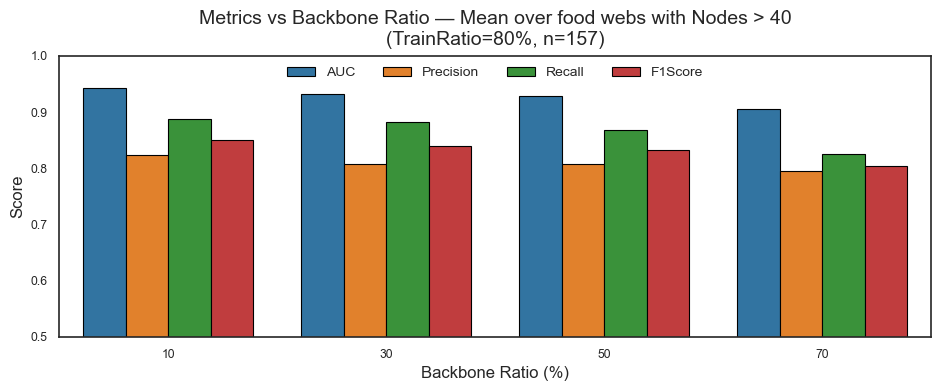

In [2]:
# %% Imports & setup
import os, glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Estilo general ===
sns.set_context("paper")
sns.set_style("white")

# === Config ===
RESULTS_DIR = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs/"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
SINGLE_FILE = None
TARGET_TRAINRATIO = 80   # <-- filtra solo este TrainRatio
METRICS = ["AUC", "Precision", "Recall", "F1Score"]
LIMIT_FILES = None  # ⬅️ limita número de archivos cargados (ajusta a None o 999 si quieres todos)
NODES_THRESHOLD = 40

# === Helpers ===
def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre resultados y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # quita .mat, .csv, etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def load_results(results_dir=None, single_file=None, limit_files=5, target_trainratio=None) -> pd.DataFrame:
    """Carga uno o varios CSVs, filtra TrainRatio si está definido, y limita a los primeros `limit_files`."""
    paths = []
    if results_dir and os.path.isdir(results_dir):
        all_paths = sorted(glob.glob(os.path.join(results_dir, "*.csv")))
        if not all_paths:
            raise FileNotFoundError(f"No CSV files found in {results_dir}.")
        if limit_files is not None:
            paths = all_paths[:limit_files]
            print(f"[INFO] Loading up to {limit_files} CSV files from directory ({len(paths)} found).")
        else:
            paths = all_paths
            print(f"[INFO] Loading all {len(paths)} CSV files from directory.")
    elif single_file and os.path.isfile(single_file):
        paths = [single_file]
        print("[INFO] Loading single CSV file.")
    else:
        raise FileNotFoundError("No CSV files found. Check RESULTS_DIR or SINGLE_FILE.")

    frames = []
    for p in paths:
        try:
            df = pd.read_csv(p)
        except Exception as e:
            print(f"Skipping {p}: {e}")
            continue

        # Normaliza nombres
        df.columns = [c.strip() for c in df.columns]
        up = {c: c.upper() for c in df.columns}
        df = df.rename(columns=up)

        # FOODWEB
        if "FOODWEB" not in df.columns:
            df["FOODWEB"] = derive_foodweb_from_filename(p)

        # --- Filtrado por TrainRatio (si está disponible) ---
        train_col = next((c for c in ["TRAINRATIO", "TRAIN_RATIO"] if c in df.columns), None)
        if train_col is not None and target_trainratio is not None:
            df["TRAINRATIO_PCT"] = (
                (df[train_col] * 100).round().astype(int)
                if df[train_col].between(0, 1).all()
                else df[train_col].round().astype(int)
            )
            before_rows = len(df)
            df = df[df["TRAINRATIO_PCT"] == target_trainratio].copy()
            if df.empty:
                continue

        # BackboneRatio robusto
        bb_candidates = [
            "BACKBONERATIO", "BACKBONE_RATIO", "BACKBONE",
            "BKRATIO", "BACKBONEPCT", "BACKBONE_PERCENT", "BACKBONE_PERCENTAGE"
        ]
        bb_col = next((c for c in bb_candidates if c in df.columns), None)
        if bb_col is None:
            for m in ["BackboneRatio", "Backbone", "Backbone_Pct", "Backbone_Percent"]:
                if m in (c for c in df.columns):
                    df = df.rename(columns={m: "BACKBONERATIO"})
                    bb_col = "BACKBONERATIO"
                    break
        else:
            if bb_col != "BACKBONERATIO":
                df = df.rename(columns={bb_col: "BACKBONERATIO"})
                bb_col = "BACKBONERATIO"
        if bb_col is None:
            print(f"Skipping {p}: missing 'BackboneRatio' column.")
            continue

        # Métricas presentes
        present_metrics = [m for m in METRICS if (m.upper() in df.columns or m in df.columns)]
        rename_map = {m.upper(): m for m in present_metrics if m.upper() in df.columns}
        df = df.rename(columns=rename_map)

        cols_to_keep = ["FOODWEB", "BACKBONERATIO"] + [m for m in METRICS if m in df.columns]
        df = df[cols_to_keep].copy()

        # Normaliza BackboneRatio a porcentaje entero
        if df["BACKBONERATIO"].dropna().between(0, 1).all():
            df["BACKBONE_PCT"] = (df["BACKBONERATIO"] * 100).round().astype(int)
        else:
            df["BACKBONE_PCT"] = df["BACKBONERATIO"].round().astype(int)

        frames.append(df)

    if not frames:
        raise ValueError("No valid results loaded after filtering.")
    return pd.concat(frames, ignore_index=True)

# %% Load results (solo TrainRatio=80)
df = load_results(
    results_dir=RESULTS_DIR,
    single_file=SINGLE_FILE,
    limit_files=LIMIT_FILES,
    target_trainratio=TARGET_TRAINRATIO
)

# === Load foodweb metadata and filter Nodes > NODES_THRESHOLD ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
df["FW_KEY"] = df["FOODWEB"].apply(normalize_fw_label)

allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")
print(f"[INFO] Foodwebs in results BEFORE filter: {df['FW_KEY'].nunique()}")

df = df[df["FW_KEY"].isin(allowed_fw_keys)].copy()
df.drop(columns=["FW_KEY"], inplace=True)

n_foodwebs = df["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

if df.empty:
    raise ValueError(f"No foodwebs left after filtering Nodes > {NODES_THRESHOLD}.")

# === Global mean summarization across all filtered foodwebs ===

# Detecta automáticamente backbone ratios disponibles
uniq = sorted(df["BACKBONE_PCT"].dropna().unique().astype(int).tolist())
ten_to_ninety = [r for r in range(10, 100, 10)]
order = [r for r in ten_to_ninety if r in uniq] or uniq

# Formato largo con TODAS las foodwebs
present_metrics = [m for m in METRICS if m in df.columns]
df_long = df.melt(
    id_vars=["FOODWEB", "BACKBONE_PCT"],
    value_vars=present_metrics,
    var_name="Metric", value_name="Score"
).dropna(subset=["Score"])

df_long["Backbone"] = pd.Categorical(
    df_long["BACKBONE_PCT"].astype(int).astype(str),
    categories=[str(o) for o in order],
    ordered=True
)

# 1) media por FOODWEB y Backbone (cada foodweb pesa lo mismo)
df_fw_means = (
    df_long.groupby(["FOODWEB", "Backbone", "Metric"], as_index=False, observed=True)["Score"]
    .mean()
)

# 2) media global a través de foodwebs
plot_df = (
    df_fw_means.groupby(["Backbone", "Metric"], as_index=False, observed=True)["Score"]
    .mean()
)

# Límites Y
vals = plot_df["Score"].astype(float)
if not vals.empty and vals.between(0, 1).all():
    y_min, y_max = 0.5, 1.0
else:
    y_min, y_max = 0.0, float(vals.max() * 1.1) if not vals.empty else 1.0

# === Plot único: promedio global ===
plt.figure(figsize=(9.5, 4))

tab10_subset = sns.color_palette("tab10", n_colors=len(present_metrics))
metric_palette = {m: tab10_subset[i] for i, m in enumerate(present_metrics)}

ax = sns.barplot(
    data=plot_df,
    x="Backbone", y="Score",
    hue="Metric",
    order=[str(o) for o in order],
    hue_order=present_metrics,
    estimator=np.mean, errorbar=None,
    palette=metric_palette,
    width=0.78,
    edgecolor="black",
    linewidth=0.8
)

for p in ax.patches:
    p.set_edgecolor("black")
    p.set_linewidth(0.8)

ax.grid(False)
for side in ["top", "right", "left", "bottom"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1.2)

ax.set_title(
    f"Metrics vs Backbone Ratio — Mean over food webs with Nodes > {NODES_THRESHOLD}\n"
    f"(TrainRatio={TARGET_TRAINRATIO}%, n={n_foodwebs})",
    pad=8, fontsize=14
)
ax.set_xlabel("Backbone Ratio (%)", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_ylim(y_min, y_max)
ax.tick_params(axis="both", which="both", length=5, width=1.0)

ax.legend(
    title=None,
    frameon=False,
    ncol=len(present_metrics),
    loc="upper center",
    bbox_to_anchor=(0.5, 1.08),
    borderaxespad=2,
    fontsize=10
)

plt.tight_layout()
plt.show()

[INFO] Loading all 290 CSV files from directory.
[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results BEFORE filter: 290
[INFO] Foodwebs in results AFTER filter: 157


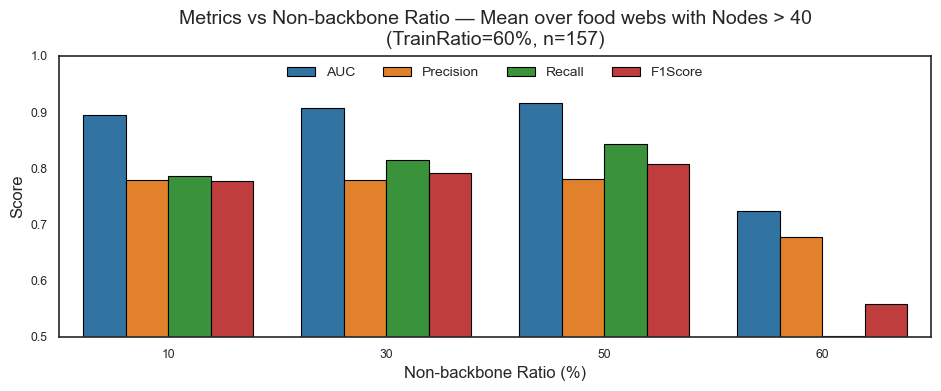

In [1]:
# %% Imports & setup
import os, glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Estilo general ===
sns.set_context("paper")
sns.set_style("white")

# === Config ===
RESULTS_DIR = "../../src/matlab/data/result_sweep_trainRatio_60-80_non-backboneRatio_10-70/prediction_scores_logs/"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
SINGLE_FILE = None
TARGET_TRAINRATIO = 60   # <-- filtra solo este TrainRatio
METRICS = ["AUC", "Precision", "Recall", "F1Score"]
LIMIT_FILES = None  # ⬅️ limita número de archivos cargados (ajusta a None o 999 si quieres todos)
NODES_THRESHOLD = 40

# === Helpers ===
def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre resultados y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # quita .mat, .csv, etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def load_results(results_dir=None, single_file=None, limit_files=5, target_trainratio=None) -> pd.DataFrame:
    """Carga uno o varios CSVs, filtra TrainRatio si está definido, y limita a los primeros `limit_files`."""
    paths = []
    if results_dir and os.path.isdir(results_dir):
        all_paths = sorted(glob.glob(os.path.join(results_dir, "*.csv")))
        if not all_paths:
            raise FileNotFoundError(f"No CSV files found in {results_dir}.")
        if limit_files is not None:
            paths = all_paths[:limit_files]
            print(f"[INFO] Loading up to {limit_files} CSV files from directory ({len(paths)} found).")
        else:
            paths = all_paths
            print(f"[INFO] Loading all {len(paths)} CSV files from directory.")
    elif single_file and os.path.isfile(single_file):
        paths = [single_file]
        print("[INFO] Loading single CSV file.")
    else:
        raise FileNotFoundError("No CSV files found. Check RESULTS_DIR or SINGLE_FILE.")

    frames = []
    for p in paths:
        try:
            df = pd.read_csv(p)
        except Exception as e:
            print(f"Skipping {p}: {e}")
            continue

        # Normaliza nombres
        df.columns = [c.strip() for c in df.columns]
        up = {c: c.upper() for c in df.columns}
        df = df.rename(columns=up)

        # FOODWEB
        if "FOODWEB" not in df.columns:
            df["FOODWEB"] = derive_foodweb_from_filename(p)

        # --- Filtrado por TrainRatio (si está disponible) ---
        train_col = next((c for c in ["TRAINRATIO", "TRAIN_RATIO"] if c in df.columns), None)
        if train_col is not None and target_trainratio is not None:
            df["TRAINRATIO_PCT"] = (
                (df[train_col] * 100).round().astype(int)
                if df[train_col].between(0, 1).all()
                else df[train_col].round().astype(int)
            )
            before_rows = len(df)
            df = df[df["TRAINRATIO_PCT"] == target_trainratio].copy()
            if df.empty:
                continue

        # Non-backbone ratio robusto (puede venir con distintos nombres)
        bb_candidates = [
            "NONBACKBONERATIO", "BACKBONE_RATIO"
        ]
        bb_col = next((c for c in bb_candidates if c in df.columns), None)
        if bb_col is None:
            for m in ["BackboneRatio", "Backbone", "Backbone_Pct", "Backbone_Percent"]:
                if m in (c for c in df.columns):
                    df = df.rename(columns={m: "BACKBONERATIO"})
                    bb_col = "BACKBONERATIO"
                    break
        else:
            if bb_col != "BACKBONERATIO":
                df = df.rename(columns={bb_col: "BACKBONERATIO"})
                bb_col = "BACKBONERATIO"
        if bb_col is None:
            print(f"Skipping {p}: missing 'BackboneRatio/NonBackboneRatio' column.")
            continue

        # Métricas presentes
        present_metrics = [m for m in METRICS if (m.upper() in df.columns or m in df.columns)]
        rename_map = {m.upper(): m for m in present_metrics if m.upper() in df.columns}
        df = df.rename(columns=rename_map)

        cols_to_keep = ["FOODWEB", "BACKBONERATIO"] + [m for m in METRICS if m in df.columns]
        df = df[cols_to_keep].copy()

        # Normaliza Non-backbone ratio a porcentaje entero
        if df["BACKBONERATIO"].dropna().between(0, 1).all():
            df["NONBACKBONE_PCT"] = (df["BACKBONERATIO"] * 100).round().astype(int)
        else:
            df["NONBACKBONE_PCT"] = df["BACKBONERATIO"].round().astype(int)

        frames.append(df)

    if not frames:
        raise ValueError("No valid results loaded after filtering.")
    return pd.concat(frames, ignore_index=True)

# %% Load results (solo TrainRatio=80)
df = load_results(
    results_dir=RESULTS_DIR,
    single_file=SINGLE_FILE,
    limit_files=LIMIT_FILES,
    target_trainratio=TARGET_TRAINRATIO
)

# === Load foodweb metadata and filter Nodes > NODES_THRESHOLD ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
df["FW_KEY"] = df["FOODWEB"].apply(normalize_fw_label)

allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")
print(f"[INFO] Foodwebs in results BEFORE filter: {df['FW_KEY'].nunique()}")

df = df[df["FW_KEY"].isin(allowed_fw_keys)].copy()
df.drop(columns=["FW_KEY"], inplace=True)

n_foodwebs = df["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

if df.empty:
    raise ValueError(f"No foodwebs left after filtering Nodes > {NODES_THRESHOLD}.")

# === Global mean summarization across all filtered foodwebs ===

# Detecta automáticamente non-backbone ratios disponibles
uniq = sorted(df["NONBACKBONE_PCT"].dropna().unique().astype(int).tolist())
ten_to_ninety = [r for r in range(10, 100, 10)]
order = [r for r in ten_to_ninety if r in uniq] or uniq

# Formato largo con TODAS las foodwebs
present_metrics = [m for m in METRICS if m in df.columns]
df_long = df.melt(
    id_vars=["FOODWEB", "NONBACKBONE_PCT"],
    value_vars=present_metrics,
    var_name="Metric", value_name="Score"
).dropna(subset=["Score"])

df_long["NonBackbone"] = pd.Categorical(
    df_long["NONBACKBONE_PCT"].astype(int).astype(str),
    categories=[str(o) for o in order],
    ordered=True
)

# 1) media por FOODWEB y Non-backbone (cada foodweb pesa lo mismo)
df_fw_means = (
    df_long.groupby(["FOODWEB", "NonBackbone", "Metric"], as_index=False, observed=True)["Score"]
    .mean()
)

# 2) media global a través de foodwebs
plot_df = (
    df_fw_means.groupby(["NonBackbone", "Metric"], as_index=False, observed=True)["Score"]
    .mean()
)

# Límites Y
vals = plot_df["Score"].astype(float)
if not vals.empty and vals.between(0, 1).all():
    y_min, y_max = 0.5, 1.0
else:
    y_min, y_max = 0.0, float(vals.max() * 1.1) if not vals.empty else 1.0

# === Plot único: promedio global ===
plt.figure(figsize=(9.5, 4))

tab10_subset = sns.color_palette("tab10", n_colors=len(present_metrics))
metric_palette = {m: tab10_subset[i] for i, m in enumerate(present_metrics)}

ax = sns.barplot(
    data=plot_df,
    x="NonBackbone", y="Score",
    hue="Metric",
    order=[str(o) for o in order],
    hue_order=present_metrics,
    estimator=np.mean, errorbar=None,
    palette=metric_palette,
    width=0.78,
    edgecolor="black",
    linewidth=0.8
)

for p in ax.patches:
    p.set_edgecolor("black")
    p.set_linewidth(0.8)

ax.grid(False)
for side in ["top", "right", "left", "bottom"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1.2)

ax.set_title(
    f"Metrics vs Non-backbone Ratio — Mean over food webs with Nodes > {NODES_THRESHOLD}\n"
    f"(TrainRatio={TARGET_TRAINRATIO}%, n={n_foodwebs})",
    pad=8, fontsize=14
)
ax.set_xlabel("Non-backbone Ratio (%)", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_ylim(y_min, y_max)
ax.tick_params(axis="both", which="both", length=5, width=1.0)

ax.legend(
    title=None,
    frameon=False,
    ncol=len(present_metrics),
    loc="upper center",
    bbox_to_anchor=(0.5, 1.08),
    borderaxespad=2,
    fontsize=10
)

plt.tight_layout()
plt.show()

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


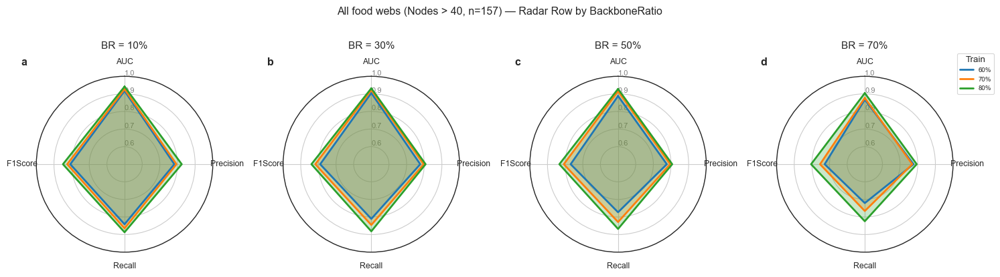

Done. Displayed 1 radar row summarising all filtered foodwebs.


In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
import seaborn as sns  # ← added

# ← added
sns.set_context("paper")
sns.set_style("white")

# ========= Config =========
INPUT_DIR = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = [
    "*_results_random.csv",
    "*_results_*.csv",
    "*_result_*.csv"
]
metrics = ["AUC", "Precision", "Recall", "F1Score"]
train_ratios = [60, 70, 80]
colors = {60: "C0", 70: "C1", 80: "C2"}
alpha_fill = 0.25
MAX_SHOW = None  # show at most N files (set None to use all)
NODES_THRESHOLD = 40

# NEW: Backbone ratios to show as 4 columns
backbone_targets = [10, 30, 50, 70]

# ========= Helpers =========
def normalize_train_ratio(x):
    """Return ratio as percentage in [0..100] (accept 0.8 or 80)."""
    try:
        x = float(x)
    except Exception:
        return np.nan
    return round(x if x > 1 else x * 100, 0)

def normalize_backbone_ratio(x):
    """Return backbone ratio as percentage in [0..100] (accept 0.9 or 90)."""
    try:
        x = float(x)
    except Exception:
        return np.nan
    return round(x if x > 1 else x * 100, 0)

def compute_angles(labels):
    """Angles for radar chart and closed loop."""
    N = len(labels)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    return angles

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # remove .mat/.csv/etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def plot_radar_row(df, title):
    """Draw a 1x4 row of radars, one per BackboneRatio in backbone_targets.
       Each radar shows series for the configured train_ratios.
       df is already filtered (Nodes > threshold) and may contain many foodwebs.
    """
    # --- Find columns (robust names) ---
    try:
        tr_col = pick_col(df.columns, ["TrainRatio","Train_Ratio","train_ratio"])
    except KeyError:
        print(f"[Warn] Missing TrainRatio column in '{title}', skipping.")
        return

    try:
        bb_col = pick_col(df.columns, ["BackboneRatio","Backbone_Ratio","Backbone","b_ratio"])
    except KeyError:
        print(f"[Warn] Missing BackboneRatio column in '{title}', skipping.")
        return

    # Normalize TR and BR to integer percentages
    df = df.copy()
    df["_TrainRatioPct"] = df[tr_col].apply(normalize_train_ratio)
    df["_BackbonePct"]   = df[bb_col].apply(normalize_backbone_ratio)

    angles = compute_angles(metrics)

    # Create a single row with 4 columns
    fig, axes = plt.subplots(1, 4, figsize=(15, 3.8), subplot_kw=dict(polar=True))
    letters = ["a", "b", "c", "d"]

    for j, (ax, br, letter) in enumerate(zip(axes, backbone_targets, letters)):
        dff = df[df["_BackbonePct"] == br]

        # Radar layout
        ax.set_theta_offset(pi / 2)
        ax.set_theta_direction(-1)
        ax.set_thetagrids([a * 180 / pi for a in angles[:-1]], metrics)
        ax.set_rlabel_position(0)

        # Zoom upper half
        ax.set_ylim(0.5, 1.0)
        ax.set_yticks([0.6, 0.7, 0.8, 0.9, 1.0])
        ax.set_yticklabels(["0.6", "0.7", "0.8", "0.9", "1.0"], color="gray", size=8)

        # Draw each TrainRatio series for this BackboneRatio
        for ratio in train_ratios:
            subset = dff[dff["_TrainRatioPct"] == ratio]
            if subset.empty and "TrainRatio" in dff.columns:
                subset = dff[dff["TrainRatio"] == ratio]  # fallback if not normalized
            if subset.empty:
                continue

            # Global mean summarisation over all filtered foodwebs
            summary = subset[metrics].astype(float).mean()
            values = summary.tolist()
            values += values[:1]

            ax.plot(
                angles, values,
                linewidth=2,
                color=colors.get(ratio, "C7"),
                label=f"{int(ratio)}%"
            )
            ax.fill(
                angles, values,
                color=colors.get(ratio, "C7"),
                alpha=alpha_fill
            )

        # Bold panel letter (top-left just inside)
        ax.annotate(
            letter, xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )

        ax.set_title(f"BR = {br}%", va="bottom", pad=8, fontsize=11)

        # Only one legend on the last subplot to keep things tidy
        if j == len(backbone_targets) - 1:
            ax.legend(
                loc="upper right",
                bbox_to_anchor=(1.25, 1.15),
                fontsize=7,
                title="Train"
            )

    fig.suptitle(f"{title} — Radar Row by BackboneRatio", y=1.05)
    plt.tight_layout()
    plt.show()

# ========= Collect files =========
files = []
for pat in GLOB_PATTERNS:
    files.extend(glob.glob(os.path.join(INPUT_DIR, pat)))
files = sorted(set(files))

if not files:
    raise FileNotFoundError(f"No CSV files found in: {INPUT_DIR}")

# ========= Load foodweb metadata and compute allowed FW keys =========
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# ========= Read and stack all allowed files =========
frames = []
used_files = 0

for csv_path in files:
    if MAX_SHOW is not None and used_files >= MAX_SHOW:
        print(f"[Info] Reached file limit ({MAX_SHOW}). Skipping remaining files.")
        break

    foodweb_name = os.path.splitext(os.path.basename(csv_path))[0]
    fw_key = normalize_fw_label(foodweb_name)

    # Skip foodwebs below threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        df = pd.read_csv(csv_path)
    except Exception as e:
        print(f"[Warn] Could not read '{csv_path}': {e}")
        continue

    df.columns = [c.strip() for c in df.columns]
    # Keep original foodweb name if you want to inspect later
    df["FOODWEB"] = fw_key

    frames.append(df)
    used_files += 1

if not frames:
    raise ValueError(f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}.")

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = df_all["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# ========= Single global radar row (mean over filtered foodwebs) =========
plot_title = f"All food webs (Nodes > {NODES_THRESHOLD}, n={n_foodwebs})"
plot_radar_row(df_all, plot_title)

print("Done. Displayed 1 radar row summarising all filtered foodwebs.")

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


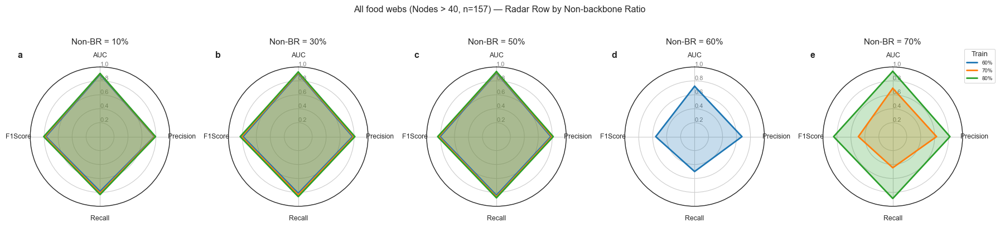

Done. Displayed 1 radar row summarising all filtered foodwebs (Non-backbone mode).


In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
import seaborn as sns  # ← added

# ← added
sns.set_context("paper")
sns.set_style("white")

# ========= Config =========
# NOTE: apuntamos ahora al experimento de NON-backbone
INPUT_DIR = "../../src/matlab/data/result_sweep_trainRatio_60-80_non-backboneRatio_10-70/prediction_scores_logs"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = [
    "*_results_random.csv",
    "*_results_*.csv",
    "*_result_*.csv"
]
metrics = ["AUC", "Precision", "Recall", "F1Score"]
train_ratios = [60, 70, 80]
colors = {60: "C0", 70: "C1", 80: "C2"}
alpha_fill = 0.25
MAX_SHOW = None  # show at most N files (set None to use all)
NODES_THRESHOLD = 40

# NEW: Non-backbone ratios to show as columns (includes 60 now)
nonbackbone_targets = [10, 30, 50, 60, 70]

# ========= Helpers =========
def normalize_train_ratio(x):
    """Return ratio as percentage in [0..100] (accept 0.8 or 80)."""
    try:
        x = float(x)
    except Exception:
        return np.nan
    return round(x if x > 1 else x * 100, 0)

def normalize_nonbackbone_ratio(x):
    """Return non-backbone ratio as percentage in [0..100] (accept 0.9 or 90)."""
    try:
        x = float(x)
    except Exception:
        return np.nan
    return round(x if x > 1 else x * 100, 0)

def compute_angles(labels):
    """Angles for radar chart and closed loop."""
    N = len(labels)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    return angles

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # remove .mat/.csv/etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def plot_radar_row(df, title):
    """Draw a row of radars, one per NonBackboneRatio in nonbackbone_targets.
       Each radar shows series for the configured train_ratios.
       df is already filtered (Nodes > threshold) and may contain many foodwebs.
    """
    # --- Find columns (robust names) ---
    try:
        tr_col = pick_col(df.columns, ["TrainRatio","Train_Ratio","train_ratio"])
    except KeyError:
        print(f"[Warn] Missing TrainRatio column in '{title}', skipping.")
        return

    # Intentar primero NonBackbone*, luego Backbone* por compatibilidad
    try:
        nb_col = pick_col(
            df.columns,
            ["NonBackboneRatio"]
        )
    except KeyError:
        print(f"[Warn] Missing NonBackboneRatio/BackboneRatio column in '{title}', skipping.")
        return

    # Normalize TR and Non-BR to integer percentages
    df = df.copy()
    df["_TrainRatioPct"]  = df[tr_col].apply(normalize_train_ratio)
    df["_NonBackbonePct"] = df[nb_col].apply(normalize_nonbackbone_ratio)

    angles = compute_angles(metrics)

    # Dynamic number of columns based on nonbackbone_targets
    n_targets = len(nonbackbone_targets)
    fig_width = 3.6 * n_targets  # ~3.6 per panel (similar to previous 15 for 4)
    fig, axes = plt.subplots(
        1, n_targets,
        figsize=(fig_width, 3.8),
        subplot_kw=dict(polar=True)
    )

    # Ensure axes is iterable even if n_targets==1
    if n_targets == 1:
        axes = [axes]

    # Panel letters: a, b, c, ...
    letters = [chr(ord("a") + k) for k in range(n_targets)]

    for j, (ax, nbr, letter) in enumerate(zip(axes, nonbackbone_targets, letters)):
        dff = df[df["_NonBackbonePct"] == nbr]

        # Radar layout
        ax.set_theta_offset(pi / 2)
        ax.set_theta_direction(-1)
        ax.set_thetagrids([a * 180 / pi for a in angles[:-1]], metrics)
        ax.set_rlabel_position(0)

        # Zoom upper half
        ax.set_ylim(0.0, 1.0)
        ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
        ax.set_yticklabels(["0.2", "0.4", "0.6", "0.8", "1.0"], color="gray", size=8)

        # Draw each TrainRatio series for this NonBackboneRatio
        for ratio in train_ratios:
            subset = dff[dff["_TrainRatioPct"] == ratio]
            if subset.empty and "TrainRatio" in dff.columns:
                subset = dff[dff["TrainRatio"] == ratio]  # fallback if not normalized
            if subset.empty:
                continue

            # Global mean summarisation over all filtered foodwebs
            summary = subset[metrics].astype(float).mean()
            values = summary.tolist()
            values += values[:1]

            ax.plot(
                angles, values,
                linewidth=2,
                color=colors.get(ratio, "C7"),
                label=f"{int(ratio)}%"
            )
            ax.fill(
                angles, values,
                color=colors.get(ratio, "C7"),
                alpha=alpha_fill
            )

        # Bold panel letter (top-left just inside)
        ax.annotate(
            letter, xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )

        ax.set_title(f"Non-BR = {nbr}%", va="bottom", pad=8, fontsize=11)

        # Only one legend on the last subplot to keep things tidy
        if j == n_targets - 1:
            from matplotlib.lines import Line2D

            # Proxy handles for all train ratios (60, 70, 80)
            handles = [
                Line2D([0], [0], color=colors.get(r, "C7"), lw=2)
                for r in train_ratios
            ]
            labels = [f"{int(r)}%" for r in train_ratios]

            ax.legend(
                handles, labels,
                loc="upper right",
                bbox_to_anchor=(1.25, 1.15),
                fontsize=7,
                title="Train"
            )

    fig.suptitle(f"{title} — Radar Row by Non-backbone Ratio", y=1.05)
    plt.tight_layout()
    plt.show()

# ========= Collect files =========
files = []
for pat in GLOB_PATTERNS:
    files.extend(glob.glob(os.path.join(INPUT_DIR, pat)))
files = sorted(set(files))

if not files:
    raise FileNotFoundError(f"No CSV files found in: {INPUT_DIR}")

# ========= Load foodweb metadata and compute allowed FW keys =========
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# ========= Read and stack all allowed files =========
frames = []
used_files = 0

for csv_path in files:
    if MAX_SHOW is not None and used_files >= MAX_SHOW:
        print(f"[Info] Reached file limit ({MAX_SHOW}). Skipping remaining files.")
        break

    foodweb_name = os.path.splitext(os.path.basename(csv_path))[0]
    fw_key = normalize_fw_label(foodweb_name)

    # Skip foodwebs below threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        df = pd.read_csv(csv_path)
    except Exception as e:
        print(f"[Warn] Could not read '{csv_path}': {e}")
        continue

    df.columns = [c.strip() for c in df.columns]
    # Keep original foodweb name if you want to inspect later
    df["FOODWEB"] = fw_key

    frames.append(df)
    used_files += 1

if not frames:
    raise ValueError(f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}.")

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = df_all["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# ========= Single global radar row (mean over filtered foodwebs) =========
plot_title = f"All food webs (Nodes > {NODES_THRESHOLD}, n={n_foodwebs})"
plot_radar_row(df_all, plot_title)

print("Done. Displayed 1 radar row summarising all filtered foodwebs (Non-backbone mode).")

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


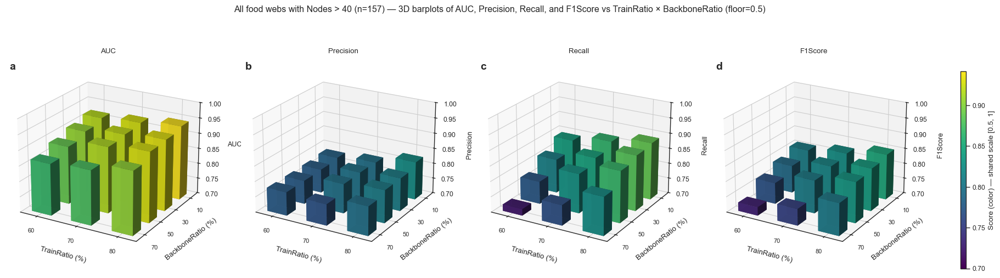

In [1]:
# %% 1x4 3D Barplots over multiple foodweb CSVs (global mean over foodwebs with Nodes > 40)
import os, glob
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm, colors
import seaborn as sns

# Font setup to avoid Unicode glyph issues
mpl.rcParams["font.family"] = "DejaVu Sans"
mpl.rcParams["font.sans-serif"] = ["DejaVu Sans"]
mpl.rcParams["mathtext.fontset"] = "dejavusans"
mpl.rcParams["axes.unicode_minus"] = False

# === Config ===
RESULTS_DIR = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
MAX_SHOW = None          # max number of foodweb files to include (None = all)
NODES_THRESHOLD = 40

DX = DY = 0.5        # bar thickness
FLOOR = 0.7          # common floor for all metrics
VIEW_KW = dict(elev=22, azim=-60)  # common 3D view

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    # limpia tokens comunes
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def pick_column(df: pd.DataFrame, *opts) -> str:
    norm_names = {c.lower().replace(" ", "").replace("_", ""): c for c in df.columns}
    for o in opts:
        k = o.lower().replace("_", "")
        if k in norm_names:
            return norm_names[k]
    raise KeyError(f"None of {opts} found in columns: {list(df.columns)}")

def to_num(s: pd.Series) -> pd.Series:
    return pd.to_numeric(s.astype(str).str.replace("%","",regex=False).str.strip(), errors="coerce")

def plot_global_3d(df: pd.DataFrame, title: str):
    """
    Same 1x4 3D barplot logic as before, but applied to a single combined DataFrame
    (all foodwebs with Nodes > threshold).
    """
    # === Load & helpers ===
    # Robustly pick TrainRatio and BackboneRatio columns
    train_col    = pick_column(df, "TrainRatio", "train_ratio", "trainratio", "train")
    backbone_col = pick_column(df, "BackboneRatio", "backbone_ratio", "backboneratio", "backbone", "bacjboneratio")

    df = df.copy()
    df[train_col]    = to_num(df[train_col])
    df[backbone_col] = to_num(df[backbone_col])

    # Ensure X/Y are in 0–100 (percent)
    for c in [train_col, backbone_col]:
        vals = df[c].dropna()
        if len(vals) and vals.max() <= 1.0:
            df[c] = df[c] * 100

    # Metric columns with flexible aliases
    metric_aliases = {
        "AUC":       ("AUC", "auc"),
        "Precision": ("Precision", "precision", "prec"),
        "Recall":    ("Recall", "recall", "tpr", "sensitivity"),
        "F1Score":   ("F1Score", "f1score", "f1_score", "f1"),
    }
    metric_cols = {m: pick_column(df, *aliases) for m, aliases in metric_aliases.items()}

    # Common X/Y indices; invert Y (BackboneRatio descending)
    xr = np.sort(df[train_col].dropna().unique())
    yr = np.sort(df[backbone_col].dropna().unique())[::-1]

    # Build metric grids (global mean over all included foodwebs)
    grids = {}
    for m, col in metric_cols.items():
        tmp = (
            df.groupby([train_col, backbone_col], as_index=False)[col]
              .mean()
              .rename(columns={col: "val"})
        )
        grid = (
            tmp.pivot(index=train_col, columns=backbone_col, values="val")
               .reindex(index=xr, columns=yr)
        )
        grids[m] = grid

    # Global normalization for shared colorbar
    vmax_global = max(float(np.nanmax(g.values)) for g in grids.values())
    cmap = cm.viridis
    norm = colors.Normalize(vmin=FLOOR, vmax=vmax_global)

    # === Plot 1x4 ===
    sns.set_theme(style="ticks", context="paper")
    fig = plt.figure(figsize=(20, 6))  # single figure for all foodwebs
    axes = [fig.add_subplot(1, 4, i+1, projection="3d") for i in range(4)]

    for ax, (metric_name, grid) in zip(axes, grids.items()):
        xs, ys, zs, dzh, cols = [], [], [], [], []
        for i, tr in enumerate(xr):
            for j, br in enumerate(yr):
                val = grid.iloc[i, j]
                if np.isnan(val):
                    continue
                height = val - FLOOR
                if height <= 0:
                    continue
                xs.append(i - DX/2)
                ys.append(j - DY/2)
                zs.append(FLOOR)           # start at floor
                dzh.append(height)         # height = value - floor
                cols.append(cmap(norm(val)))

        ax.bar3d(xs, ys, zs, DX, DY, dzh, shade=True, color=cols, edgecolor="none", alpha=0.95)

        # Axes and limits (unchanged logic)
        ax.set_title(metric_name)
        ax.set_xlabel("TrainRatio (%)", labelpad=6)
        ax.set_ylabel("BackboneRatio (%)", labelpad=6)
        ax.set_zlabel(f"{metric_name}", labelpad=8, fontsize=9)
        ax.set_xticks(range(len(xr)))
        ax.set_xticklabels(
            [f"{int(v):d}" if float(v).is_integer() else f"{v:g}" for v in xr],
            fontsize=8
        )
        ax.set_yticks(range(len(yr)))
        ax.set_yticklabels(
            [f"{int(v):d}" if float(v).is_integer() else f"{v:g}" for v in yr],
            fontsize=8
        )
        ax.set_zlim(FLOOR, 1.0)
        ax.view_init(**VIEW_KW)

    # Panel letters (bold)
    panel_labels = ["a", "b", "c", "d"]
    for ax, lab in zip(axes, panel_labels):
        ax.text2D(
            0.02, 0.98, lab,
            transform=ax.transAxes,
            ha="left", va="top",
            fontweight="bold", fontsize=14
        )

    # Shared colorbar (right side, thinner)
    mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array([])
    cbar_ax = fig.add_axes([0.92, 0.18, 0.005, 0.60])  # [left, bottom, width, height]
    cb = plt.colorbar(mappable, cax=cbar_ax, aspect=30)
    cb.set_label("Score (color) — shared scale [0.5, 1]")

    # Figure title with global label
    fig.suptitle(
        f"{title} — 3D barplots of AUC, Precision, Recall, and F1Score vs TrainRatio × BackboneRatio (floor=0.5)",
        y=0.98
    )

    # Spacing
    plt.subplots_adjust(left=0.05, right=0.88, bottom=0.12, top=0.90, wspace=0.15)
    plt.show()

# === Discover CSVs ===
all_files = []
for pat in GLOB_PATTERNS:
    all_files.extend(glob.glob(os.path.join(RESULTS_DIR, pat)))

all_files = sorted(set(all_files))
if not all_files:
    raise FileNotFoundError(f"No CSVs found in {RESULTS_DIR} with patterns {GLOB_PATTERNS}")

# === Load foodweb metadata & compute allowed keys (Nodes > threshold) ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# === Read & stack only allowed foodweb CSVs ===
frames = []
included_keys = set()

for fp in all_files:
    if MAX_SHOW is not None and len(included_keys) >= MAX_SHOW:
        print(f"[Info] Reached file limit ({MAX_SHOW}). Skipping remaining files.")
        break

    fw_name_raw = os.path.splitext(os.path.basename(fp))[0]
    fw_key = normalize_fw_label(fw_name_raw)

    # Skip foodwebs below node threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        df = pd.read_csv(fp)
    except Exception as e:
        print(f"[Skip] {fp}: {e}")
        continue

    df.columns = [c.strip() for c in df.columns]
    df["FOODWEB"] = fw_key  # optional, for inspection
    frames.append(df)
    included_keys.add(fw_key)

if not frames:
    raise ValueError(f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}.")

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = len(included_keys)
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# === Single global 3D plot (mean over all filtered foodwebs) ===
global_title = f"All food webs with Nodes > {NODES_THRESHOLD} (n={n_foodwebs})"
plot_global_3d(df_all, global_title)

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


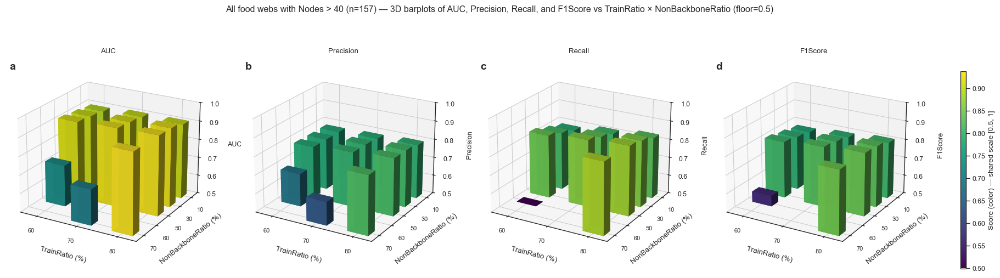

In [1]:
# %% 1x4 3D Barplots over multiple foodweb CSVs (global mean over foodwebs with Nodes > 40)
import os, glob
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm, colors
import seaborn as sns

# Font setup to avoid Unicode glyph issues
mpl.rcParams["font.family"] = "DejaVu Sans"
mpl.rcParams["font.sans-serif"] = ["DejaVu Sans"]
mpl.rcParams["mathtext.fontset"] = "dejavusans"
mpl.rcParams["axes.unicode_minus"] = False

# === Config ===
# NOTE: ahora apuntamos al experimento de NON-backbone
RESULTS_DIR = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_non-backboneRatio_10-70/"
    "prediction_scores_logs"
)
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
MAX_SHOW = None          # max number of foodweb files to include (None = all)
NODES_THRESHOLD = 40

DX = DY = 0.5        # bar thickness
FLOOR = 0.5          # common floor for all metrics
VIEW_KW = dict(elev=22, azim=-60)  # common 3D view


def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    # limpia tokens comunes
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name


def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)


def pick_column(df: pd.DataFrame, *opts) -> str:
    norm_names = {c.lower().replace(" ", "").replace("_", ""): c for c in df.columns}
    for o in opts:
        k = o.lower().replace("_", "")
        if k in norm_names:
            return norm_names[k]
    raise KeyError(f"None of {opts} found in columns: {list(df.columns)}")


def to_num(s: pd.Series) -> pd.Series:
    return pd.to_numeric(
        s.astype(str).str.replace("%", "", regex=False).str.strip(),
        errors="coerce"
    )


def plot_global_3d(df: pd.DataFrame, title: str):
    """
    Same 1x4 3D barplot logic as before, but applied to a single combined DataFrame
    (all foodwebs with Nodes > threshold), now using NonBackboneRatio.
    """
    # === Robustly pick TrainRatio and NonBackboneRatio columns ===
    train_col = pick_column(df, "TrainRatio", "train_ratio", "trainratio", "train")
    nonbb_col = pick_column(
        df,
        "NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO",
        "NonBackbone", "NonBR"
    )

    df = df.copy()
    df[train_col] = to_num(df[train_col])
    df[nonbb_col] = to_num(df[nonbb_col])

    # Ensure X/Y are in 0–100 (percent)
    for c in [train_col, nonbb_col]:
        vals = df[c].dropna()
        if len(vals) and vals.max() <= 1.0:
            df[c] = df[c] * 100

    # Metric columns with flexible aliases
    metric_aliases = {
        "AUC":       ("AUC", "auc"),
        "Precision": ("Precision", "precision", "prec"),
        "Recall":    ("Recall", "recall", "tpr", "sensitivity"),
        "F1Score":   ("F1Score", "f1score", "f1_score", "f1"),
    }
    metric_cols = {m: pick_column(df, *aliases) for m, aliases in metric_aliases.items()}

    # Common X/Y indices; invert Y (NonBackboneRatio descending)
    xr = np.sort(df[train_col].dropna().unique())
    yr = np.sort(df[nonbb_col].dropna().unique())[::-1]

    # Build metric grids (global mean over all included foodwebs)
    grids = {}
    for m, col in metric_cols.items():
        tmp = (
            df.groupby([train_col, nonbb_col], as_index=False)[col]
              .mean()
              .rename(columns={col: "val"})
        )
        grid = (
            tmp.pivot(index=train_col, columns=nonbb_col, values="val")
               .reindex(index=xr, columns=yr)
        )
        grids[m] = grid

    # Global normalization for shared colorbar
    vmax_global = max(float(np.nanmax(g.values)) for g in grids.values())
    cmap = cm.viridis
    norm = colors.Normalize(vmin=FLOOR, vmax=vmax_global)

    # === Plot 1x4 ===
    sns.set_theme(style="ticks", context="paper")
    fig = plt.figure(figsize=(20, 6))  # single figure for all foodwebs
    axes = [fig.add_subplot(1, 4, i + 1, projection="3d") for i in range(4)]

    for ax, (metric_name, grid) in zip(axes, grids.items()):
        xs, ys, zs, dzh, cols = [], [], [], [], []
        for i, tr in enumerate(xr):
            for j, nbr in enumerate(yr):
                val = grid.iloc[i, j]
                if np.isnan(val):
                    continue
                height = val - FLOOR
                if height <= 0:
                    continue
                xs.append(i - DX / 2)
                ys.append(j - DY / 2)
                zs.append(FLOOR)           # start at floor
                dzh.append(height)         # height = value - floor
                cols.append(cmap(norm(val)))

        ax.bar3d(xs, ys, zs, DX, DY, dzh, shade=True,
                 color=cols, edgecolor="none", alpha=0.95)

        # Axes and limits
        ax.set_title(metric_name)
        ax.set_xlabel("TrainRatio (%)", labelpad=6)
        ax.set_ylabel("NonBackboneRatio (%)", labelpad=6)
        ax.set_zlabel(f"{metric_name}", labelpad=8, fontsize=9)
        ax.set_xticks(range(len(xr)))
        ax.set_xticklabels(
            [f"{int(v):d}" if float(v).is_integer() else f"{v:g}" for v in xr],
            fontsize=8,
        )
        ax.set_yticks(range(len(yr)))
        ax.set_yticklabels(
            [f"{int(v):d}" if float(v).is_integer() else f"{v:g}" for v in yr],
            fontsize=8,
        )
        ax.set_zlim(FLOOR, 1.0)
        ax.view_init(**VIEW_KW)

    # Panel letters (bold)
    panel_labels = ["a", "b", "c", "d"]
    for ax, lab in zip(axes, panel_labels):
        ax.text2D(
            0.02, 0.98, lab,
            transform=ax.transAxes,
            ha="left", va="top",
            fontweight="bold", fontsize=14,
        )

    # Shared colorbar (right side, thinner)
    mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array([])
    cbar_ax = fig.add_axes([0.92, 0.18, 0.005, 0.60])  # [left, bottom, width, height]
    cb = plt.colorbar(mappable, cax=cbar_ax, aspect=30)
    cb.set_label(f"Score (color) — shared scale [{FLOOR:.1f}, 1]")

    # Figure title with global label
    fig.suptitle(
        f"{title} — 3D barplots of AUC, Precision, Recall, and F1Score "
        f"vs TrainRatio × NonBackboneRatio (floor={FLOOR:.1f})",
        y=0.98,
    )

    # Spacing
    plt.subplots_adjust(left=0.05, right=0.88, bottom=0.12, top=0.90, wspace=0.15)
    plt.show()


# === Discover CSVs ===
all_files = []
for pat in GLOB_PATTERNS:
    all_files.extend(glob.glob(os.path.join(RESULTS_DIR, pat)))

all_files = sorted(set(all_files))
if not all_files:
    raise FileNotFoundError(f"No CSVs found in {RESULTS_DIR} with patterns {GLOB_PATTERNS}")

# === Load foodweb metadata & compute allowed keys (Nodes > threshold) ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# === Read & stack only allowed foodweb CSVs ===
frames = []
included_keys = set()

for fp in all_files:
    if MAX_SHOW is not None and len(included_keys) >= MAX_SHOW:
        print(f"[Info] Reached file limit ({MAX_SHOW}). Skipping remaining files.")
        break

    fw_name_raw = os.path.splitext(os.path.basename(fp))[0]
    fw_key = normalize_fw_label(fw_name_raw)

    # Skip foodwebs below node threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        df = pd.read_csv(fp)
    except Exception as e:
        print(f"[Skip] {fp}: {e}")
        continue

    df.columns = [c.strip() for c in df.columns]
    df["FOODWEB"] = fw_key  # optional, for inspection
    frames.append(df)
    included_keys.add(fw_key)

if not frames:
    raise ValueError(f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}.")

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = len(included_keys)
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# === Single global 3D plot (mean over all filtered foodwebs) ===
global_title = f"All food webs with Nodes > {NODES_THRESHOLD} (n={n_foodwebs})"
plot_global_3d(df_all, global_title)


[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


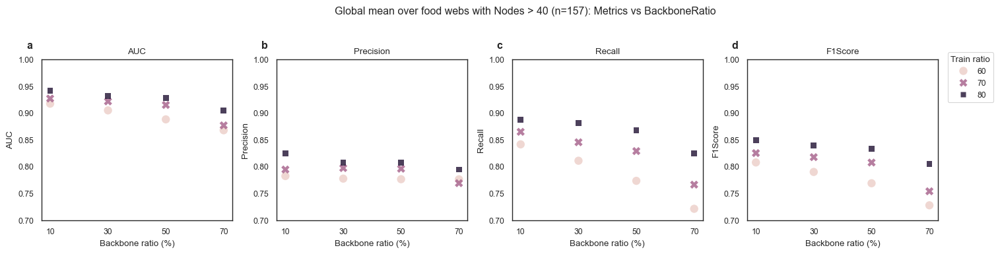

In [1]:
# %% Scatterplots row: AUC/Precision/Recall/F1Score vs BackboneRatio (global mean over foodwebs with Nodes > 40)
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# =============== Config ===============
CSV_PATH = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs/AEW01_tax_mass_results_random.csv"
INPUT_DIR = os.path.dirname(CSV_PATH)
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
NODES_THRESHOLD = 40

Y_LIM = (0.7, 1.0)      # set to None to auto-scale
POINT_SIZE = 80
ALPHA = 0.85
MAX_SHOW = None          # max number of foodwebs to aggregate (None = all)
# ======================================

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found in columns: {list(cols)}")

# ---------- Load allowed foodwebs (Nodes > 40) ----------
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique())

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# ---------- Collect CSV paths ----------
csv_files = []
for pat in GLOB_PATTERNS:
    csv_files.extend(sorted(glob.glob(os.path.join(INPUT_DIR, pat))))

# Deduplicate while preserving order
seen = set()
files_unique = []
for f in csv_files:
    if f not in seen:
        seen.add(f)
        files_unique.append(f)

# Fallback to the single CSV_PATH if nothing matched
if not files_unique:
    files_unique = [CSV_PATH]

# ---------- Load and stack all allowed foodwebs ----------
frames = []
included_keys = set()

for csv_path in files_unique:
    fw_raw = os.path.splitext(os.path.basename(csv_path))[0]
    fw_key = normalize_fw_label(fw_raw)

    # Skip foodwebs below node threshold
    if fw_key not in allowed_fw_keys:
        continue

    if MAX_SHOW is not None and len(included_keys) >= MAX_SHOW:
        print(f"[INFO] Reached aggregation limit ({MAX_SHOW} foodwebs).")
        break

    try:
        df = pd.read_csv(csv_path)
    except Exception as e:
        print(f"[Warn] Could not read '{csv_path}': {e}")
        continue

    df.columns = [c.strip() for c in df.columns]

    # Standardize column names across files
    # BackboneRatio
    backbone_col = pick_col(df.columns, ["BackboneRatio", "Backbone_Ratio", "Backbone", "b_ratio"])
    if backbone_col != "BackboneRatio":
        df = df.rename(columns={backbone_col: "BackboneRatio"})

    # TrainRatio (if present)
    try:
        train_col = pick_col(df.columns, ["TrainRatio", "Train_Ratio", "train_ratio"])
        if train_col != "TrainRatio":
            df = df.rename(columns={train_col: "TrainRatio"})
    except KeyError:
        train_col = None  # allow missing TrainRatio (will plot without hue)

    # Metrics
    metric_aliases = {
        "AUC":       ["AUC"],
        "Precision": ["Precision"],
        "Recall":    ["Recall"],
        "F1Score":   ["F1Score", "F1_Score", "F1"],
    }
    for canon, cands in metric_aliases.items():
        try:
            col = pick_col(df.columns, cands)
            if col != canon:
                df = df.rename(columns={col: canon})
        except KeyError:
            pass  # allow missing metric

    df["FOODWEB"] = fw_key

    # Coerce numerics
    num_cols = [c for c in ["BackboneRatio", "TrainRatio", "AUC", "Precision", "Recall", "F1Score"] if c in df.columns]
    for c in num_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    # Normalize ratios to percentages if they are in [0,1]
    if "TrainRatio" in df.columns:
        vals_tr = df["TrainRatio"].dropna()
        if len(vals_tr) and vals_tr.max() <= 1.0:
            df["TrainRatio"] = (df["TrainRatio"] * 100).round()

    vals_bb = df["BackboneRatio"].dropna()
    if len(vals_bb) and vals_bb.max() <= 1.0:
        df["BackboneRatio"] = (df["BackboneRatio"] * 100).round()

    frames.append(df)
    included_keys.add(fw_key)

if not frames:
    raise ValueError(f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}.")

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = df_all["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# ---------- Build global mean dataset (equal weight per foodweb) ----------
# keep only rows with needed columns
needed_cols = ["FOODWEB", "BackboneRatio", "AUC", "Precision", "Recall", "F1Score"]
if "TrainRatio" in df_all.columns:
    needed_cols.append("TrainRatio")

df_used = df_all.dropna(subset=["BackboneRatio", "AUC", "Precision", "Recall", "F1Score"]).copy()

# 1) mean per FOODWEB, BackboneRatio, TrainRatio
group_keys = ["FOODWEB", "BackboneRatio"]
if "TrainRatio" in df_used.columns:
    group_keys.append("TrainRatio")

df_fw_means = (
    df_used.groupby(group_keys, as_index=False)[["AUC", "Precision", "Recall", "F1Score"]]
    .mean()
)

# 2) mean across foodwebs for each (BackboneRatio, TrainRatio)
group_keys_global = ["BackboneRatio"]
if "TrainRatio" in df_fw_means.columns:
    group_keys_global.append("TrainRatio")

df_plot = (
    df_fw_means.groupby(group_keys_global, as_index=False)[["AUC", "Precision", "Recall", "F1Score"]]
    .mean()
)

# ---------- Plot single global scatter row ----------
sns.set_theme(style="white", context="paper")

metrics_cfg = [
    ("AUC", "AUC"),
    ("Precision", "Precision"),
    ("Recall", "Recall"),
    ("F1Score", "F1Score"),
]

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharex=True)
scatter_kwargs = dict(s=POINT_SIZE, alpha=ALPHA, edgecolor="none")

panel_letters = ["a", "b", "c", "d"]

def set_integer_like_xticks(ax, x_values):
    try:
        xs = sorted(pd.Series(x_values).dropna().unique())
        if len(xs) and all(float(x).is_integer() for x in xs):
            ax.set_xticks(xs)
    except Exception:
        pass

train_col_global = "TrainRatio" if "TrainRatio" in df_plot.columns else None
handles_labels_ax = None

for i, (mname, mcol) in enumerate(metrics_cfg):
    ax = axs[i]

    if train_col_global:
        show_legend = (i == 0)
        g = sns.scatterplot(
            data=df_plot, x="BackboneRatio", y=mcol,
            hue=train_col_global, style=train_col_global,
            ax=ax, legend=show_legend, **scatter_kwargs
        )
        if show_legend:
            handles_labels_ax = ax
    else:
        g = sns.scatterplot(
            data=df_plot, x="BackboneRatio", y=mcol,
            ax=ax, **scatter_kwargs
        )

    ax.set_title(mname)
    ax.set_xlabel("Backbone ratio (%)")
    ax.set_ylabel(mname)

    if Y_LIM:
        ax.set_ylim(*Y_LIM)

    set_integer_like_xticks(ax, df_plot["BackboneRatio"])

    # Panel letter
    ax.annotate(
        panel_letters[i],
        xy=(0, 1), xycoords="axes fraction",
        xytext=(-10, 10), textcoords="offset points",
        ha="right", va="bottom",
        fontsize="large", fontweight="bold",
        annotation_clip=False
    )

# Figure-level legend
if train_col_global and handles_labels_ax is not None:
    handles, labels = handles_labels_ax.get_legend_handles_labels()
    if handles_labels_ax.legend_ is not None:
        handles_labels_ax.legend_.remove()

    seen = set()
    uniq_handles, uniq_labels = [], []
    for h, l in zip(handles, labels):
        if l not in seen and l != "":
            seen.add(l)
            uniq_handles.append(h)
            uniq_labels.append(l)

    fig.legend(
        uniq_handles, uniq_labels,
        title="Train ratio",
        loc="center left", bbox_to_anchor=(0.9, 0.68), borderaxespad=0.
    )

fig.suptitle(
    f"Global mean over food webs with Nodes > {NODES_THRESHOLD} (n={n_foodwebs}): Metrics vs BackboneRatio",
    y=0.95
)

plt.tight_layout(rect=[0, 0, 0.9, 0.93])
plt.show()

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


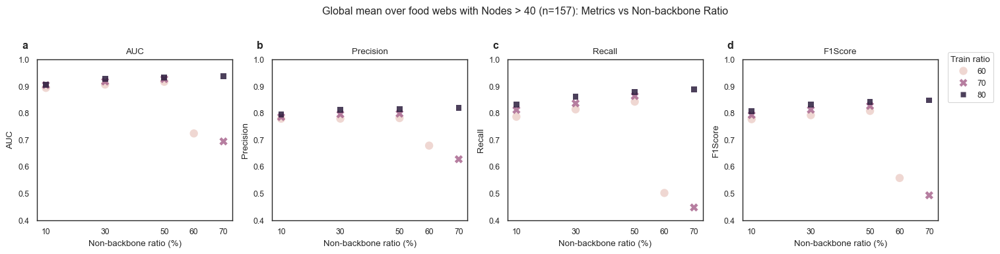

In [1]:
# %% Scatterplots row: AUC/Precision/Recall/F1Score vs NonBackboneRatio
#     (global mean over foodwebs with Nodes > 40)

import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# =============== Config ===============
# NOTE: Non-backbone experiment directory
CSV_PATH = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_non-backboneRatio_10-70/"
    "prediction_scores_logs/AEW01_tax_mass_results_random.csv"
)
INPUT_DIR = os.path.dirname(CSV_PATH)
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
NODES_THRESHOLD = 40

Y_LIM = (0.4, 1.0)      # set to None to auto-scale
POINT_SIZE = 80
ALPHA = 0.85
MAX_SHOW = None          # max number of foodwebs to aggregate (None = all)
# ======================================

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found in columns: {list(cols)}")

# ---------- Load allowed foodwebs (Nodes > 40) ----------
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique())

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# ---------- Collect CSV paths ----------
csv_files = []
for pat in GLOB_PATTERNS:
    csv_files.extend(sorted(glob.glob(os.path.join(INPUT_DIR, pat))))

# Deduplicate while preserving order
seen = set()
files_unique = []
for f in csv_files:
    if f not in seen:
        seen.add(f)
        files_unique.append(f)

# Fallback to the single CSV_PATH if nothing matched
if not files_unique:
    files_unique = [CSV_PATH]

# ---------- Load and stack all allowed foodwebs ----------
frames = []
included_keys = set()

for csv_path in files_unique:
    fw_raw = os.path.splitext(os.path.basename(csv_path))[0]
    fw_key = normalize_fw_label(fw_raw)

    # Skip foodwebs below node threshold
    if fw_key not in allowed_fw_keys:
        continue

    if MAX_SHOW is not None and len(included_keys) >= MAX_SHOW:
        print(f"[INFO] Reached aggregation limit ({MAX_SHOW} foodwebs).")
        break

    try:
        df = pd.read_csv(csv_path)
    except Exception as e:
        print(f"[Warn] Could not read '{csv_path}': {e}")
        continue

    df.columns = [c.strip() for c in df.columns]

    # Standardize column names across files
    # NonBackboneRatio
    nonbb_col = pick_col(
        df.columns,
        ["NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO", "NonBackbone", "NonBR"]
    )
    if nonbb_col != "NonBackboneRatio":
        df = df.rename(columns={nonbb_col: "NonBackboneRatio"})

    # TrainRatio (if present)
    try:
        train_col = pick_col(df.columns, ["TrainRatio", "Train_Ratio", "train_ratio"])
        if train_col != "TrainRatio":
            df = df.rename(columns={train_col: "TrainRatio"})
    except KeyError:
        train_col = None  # allow missing TrainRatio (will plot without hue)

    # Metrics
    metric_aliases = {
        "AUC":       ["AUC"],
        "Precision": ["Precision"],
        "Recall":    ["Recall"],
        "F1Score":   ["F1Score", "F1_Score", "F1"],
    }
    for canon, cands in metric_aliases.items():
        try:
            col = pick_col(df.columns, cands)
            if col != canon:
                df = df.rename(columns={col: canon})
        except KeyError:
            pass  # allow missing metric

    df["FOODWEB"] = fw_key

    # Coerce numerics
    num_cols = [c for c in ["NonBackboneRatio", "TrainRatio", "AUC", "Precision", "Recall", "F1Score"] if c in df.columns]
    for c in num_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    # Normalize ratios to percentages if they are in [0,1]
    if "TrainRatio" in df.columns:
        vals_tr = df["TrainRatio"].dropna()
        if len(vals_tr) and vals_tr.max() <= 1.0:
            df["TrainRatio"] = (df["TrainRatio"] * 100).round()

    vals_nb = df["NonBackboneRatio"].dropna()
    if len(vals_nb) and vals_nb.max() <= 1.0:
        df["NonBackboneRatio"] = (df["NonBackboneRatio"] * 100).round()

    frames.append(df)
    included_keys.add(fw_key)

if not frames:
    raise ValueError(f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}.")

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = df_all["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# ---------- Build global mean dataset (equal weight per foodweb) ----------
df_used = df_all.dropna(
    subset=["NonBackboneRatio", "AUC", "Precision", "Recall", "F1Score"]
).copy()

# 1) mean per FOODWEB, NonBackboneRatio, TrainRatio
group_keys = ["FOODWEB", "NonBackboneRatio"]
if "TrainRatio" in df_used.columns:
    group_keys.append("TrainRatio")

df_fw_means = (
    df_used.groupby(group_keys, as_index=False)[["AUC", "Precision", "Recall", "F1Score"]]
    .mean()
)

# 2) mean across foodwebs for each (NonBackboneRatio, TrainRatio)
group_keys_global = ["NonBackboneRatio"]
if "TrainRatio" in df_fw_means.columns:
    group_keys_global.append("TrainRatio")

df_plot = (
    df_fw_means.groupby(group_keys_global, as_index=False)[["AUC", "Precision", "Recall", "F1Score"]]
    .mean()
)

# ---------- Plot single global scatter row ----------
sns.set_theme(style="white", context="paper")

metrics_cfg = [
    ("AUC", "AUC"),
    ("Precision", "Precision"),
    ("Recall", "Recall"),
    ("F1Score", "F1Score"),
]

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharex=True)
scatter_kwargs = dict(s=POINT_SIZE, alpha=ALPHA, edgecolor="none")

panel_letters = ["a", "b", "c", "d"]

def set_integer_like_xticks(ax, x_values):
    try:
        xs = sorted(pd.Series(x_values).dropna().unique())
        if len(xs) and all(float(x).is_integer() for x in xs):
            ax.set_xticks(xs)
    except Exception:
        pass

train_col_global = "TrainRatio" if "TrainRatio" in df_plot.columns else None
handles_labels_ax = None

for i, (mname, mcol) in enumerate(metrics_cfg):
    ax = axs[i]

    if train_col_global:
        show_legend = (i == 0)
        g = sns.scatterplot(
            data=df_plot, x="NonBackboneRatio", y=mcol,
            hue=train_col_global, style=train_col_global,
            ax=ax, legend=show_legend, **scatter_kwargs
        )
        if show_legend:
            handles_labels_ax = ax
    else:
        g = sns.scatterplot(
            data=df_plot, x="NonBackboneRatio", y=mcol,
            ax=ax, **scatter_kwargs
        )

    ax.set_title(mname)
    ax.set_xlabel("Non-backbone ratio (%)")
    ax.set_ylabel(mname)

    if Y_LIM:
        ax.set_ylim(*Y_LIM)

    set_integer_like_xticks(ax, df_plot["NonBackboneRatio"])

    # Panel letter
    ax.annotate(
        panel_letters[i],
        xy=(0, 1), xycoords="axes fraction",
        xytext=(-10, 10), textcoords="offset points",
        ha="right", va="bottom",
        fontsize="large", fontweight="bold",
        annotation_clip=False
    )

# Figure-level legend
if train_col_global and handles_labels_ax is not None:
    handles, labels = handles_labels_ax.get_legend_handles_labels()
    if handles_labels_ax.legend_ is not None:
        handles_labels_ax.legend_.remove()

    seen = set()
    uniq_handles, uniq_labels = [], []
    for h, l in zip(handles, labels):
        if l not in seen and l != "":
            seen.add(l)
            uniq_handles.append(h)
            uniq_labels.append(l)

    fig.legend(
        uniq_handles, uniq_labels,
        title="Train ratio",
        loc="center left", bbox_to_anchor=(0.9, 0.68), borderaxespad=0.
    )

fig.suptitle(
    f"Global mean over food webs with Nodes > {NODES_THRESHOLD} (n={n_foodwebs}): "
    "Metrics vs Non-backbone Ratio",
    y=0.95
)

plt.tight_layout(rect=[0, 0, 0.9, 0.93])
plt.show()


[INFO] Foodwebs with Nodes > 40 in metadata: 157


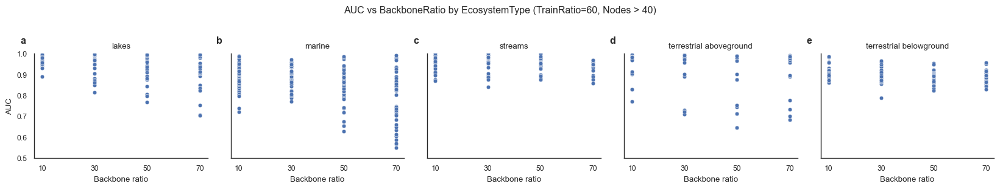

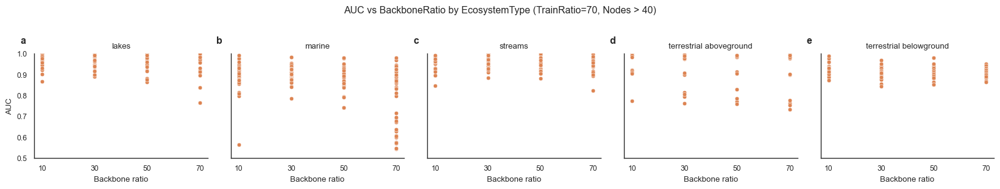

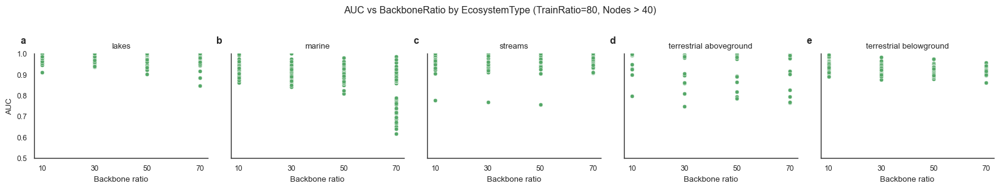

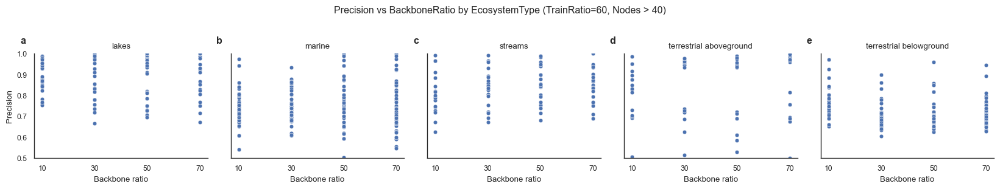

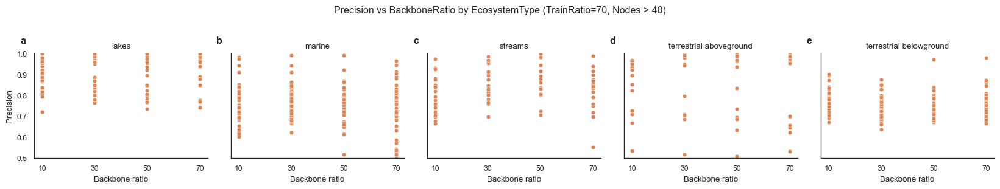

...

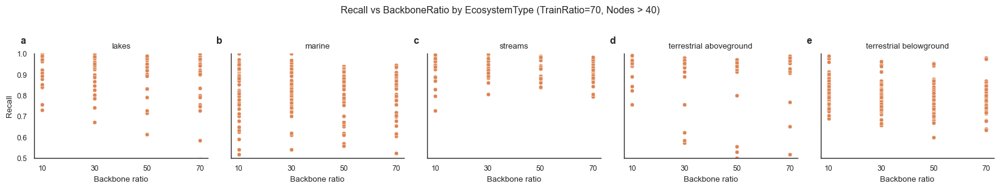

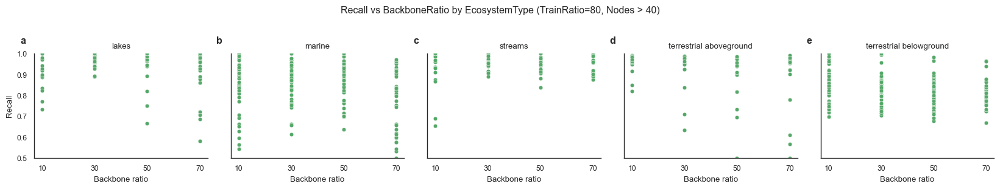

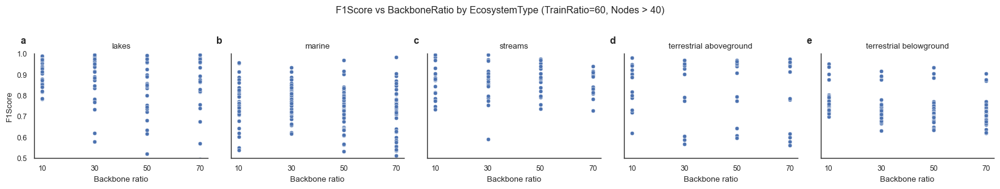

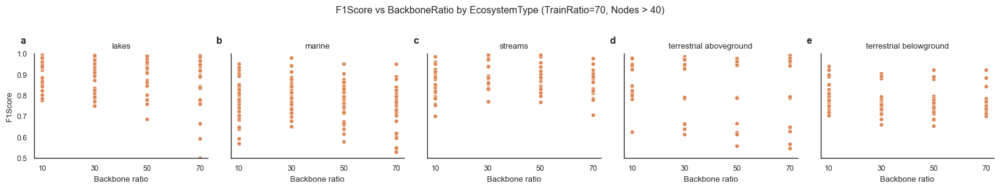

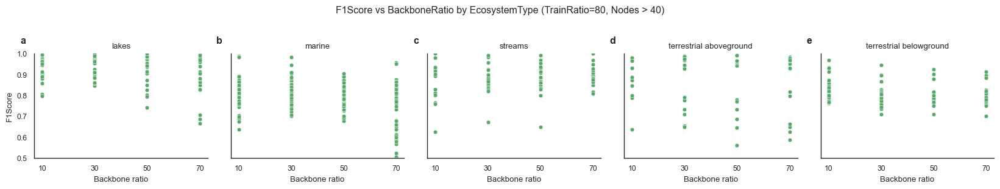

In [2]:
# %% Faceted scatter by EcosystemType (AUC vs BackboneRatio), TR=60 — robust merge + panel letters + clean titles
import os, glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ========= Config =========
CSV_PATH = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs"  # file OR folder
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
Y_LIM = (0.5, 1.0)
NODES_THRESHOLD = 40
# ==========================

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    name = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

# Resolve INPUT_DIR whether CSV_PATH is a file or a folder
INPUT_DIR = CSV_PATH if os.path.isdir(CSV_PATH) else os.path.dirname(CSV_PATH)

# Collect CSVs (dedup to avoid pattern overlap)
files = []
for p in GLOB_PATTERNS:
    files.extend(sorted(glob.glob(os.path.join(INPUT_DIR, p))))
files = list(dict.fromkeys(files))
if not files and os.path.isfile(CSV_PATH):
    files = [CSV_PATH]

# === Additional metrics (Precision, Recall, F1Score) with identical logic/style ===
METRICS_TO_PLOT = [
    ("AUC", ["AUC"]),
    ("Precision", ["Precision"]),
    ("Recall",    ["Recall"]),
    ("F1Score",   ["F1Score", "F1_Score", "F1"]),
]

# === Load metadata and compute allowed foodwebs (Nodes > 40) ===
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_nodes = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
nodes_col = pick_col(meta_all.columns, ["Nodes","nodes","N"])

meta_all["Foodweb_key"] = meta_all[fw_col_nodes].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col] > NODES_THRESHOLD, "Foodweb_key"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

def build_df_for_ratio_metric(TRAIN_RATIO_TARGET: int, metric_candidates, metric_label: str) -> pd.DataFrame:
    """Build aggregated DF filtered to a given TrainRatio for a given METRIC, merged with EcosystemType."""
    rows = []
    for path in files:
        # Filter by Nodes > threshold using metadata
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            tdf = pd.read_csv(path)
            bb   = pick_col(tdf.columns, ["BackboneRatio", "Backbone_Ratio", "Backbone", "b_ratio"])
            mcol = pick_col(tdf.columns, metric_candidates)
            tr   = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in tdf.columns), None)

            tdf[bb]   = pd.to_numeric(tdf[bb], errors="coerce")
            tdf[mcol] = pd.to_numeric(tdf[mcol], errors="coerce")
            if tr:
                tdf[tr] = pd.to_numeric(tdf[tr], errors="coerce")
                tdf = tdf[tdf[tr] == TRAIN_RATIO_TARGET]

            tdf = tdf.dropna(subset=[bb, mcol]).copy()
            tdf["Foodweb_key"] = fw_key

            rows.append(
                tdf[[bb, mcol, "Foodweb_key"]].rename(columns={bb: "BackboneRatio", mcol: metric_label})
            )
        except Exception:
            continue

    df = pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(columns=["BackboneRatio", metric_label, "Foodweb_key"])

    # Attach Ecosystem metadata (same logic as before, but reusing meta_all with Foodweb_key)
    fw_col  = fw_col_nodes
    eco_col = pick_col(meta_all.columns, ["EcosystemType","Ecosystem","ecosystem_type","Habitat"])

    meta2 = meta_all.rename(columns={fw_col: "Foodweb_meta", eco_col: "EcosystemType"})[
        ["Foodweb_meta", "EcosystemType", "Foodweb_key"]
    ].copy()

    df = df.merge(meta2[["Foodweb_key","EcosystemType"]], on="Foodweb_key", how="left")
    df["EcosystemType"] = df["EcosystemType"].fillna("Unknown")
    return df

def plot_faceted_metric(df: pd.DataFrame, train_ratio: int, color: str, metric_label: str):
    """Plot 1-row faceted scatter for a given METRIC with panel letters and clean titles (same style)."""
    sns.set_theme(style="white", context="paper")

    eco_order = sorted(df["EcosystemType"].dropna().unique())
    if len(eco_order) > 5:
        eco_order = eco_order[:5]
    n_cols = len(eco_order) if len(eco_order) > 0 else 1

    g = sns.relplot(
        data=df[df["EcosystemType"].isin(eco_order)],
        kind="scatter",
        x="BackboneRatio", y=metric_label,
        col="EcosystemType",
        col_order=eco_order,
        col_wrap=n_cols,        # -> one row
        height=3, aspect=1.1,
        facet_kws=dict(sharex=True, sharey=True),
        color=color
    )

    # Axes formatting
    for ax in g.axes.flat:
        if Y_LIM:
            ax.set_ylim(*Y_LIM)
        try:
            xs = sorted(df["BackboneRatio"].dropna().unique())
            if len(xs) and all(float(x).is_integer() for x in xs):
                ax.set_xticks(xs)
        except Exception:
            pass

    # Titles only with ecosystem name + bold panel letters
    letters = [chr(ord('a') + i) for i in range(len(g.col_names))]
    for i, (ax, name) in enumerate(zip(g.axes.flat, g.col_names)):
        ax.set_title(name)
        ax.annotate(
            letters[i],
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )

    g.set_xlabels("Backbone ratio"); g.set_ylabels(metric_label)
    g.fig.suptitle(f"{metric_label} vs BackboneRatio by EcosystemType (TrainRatio={train_ratio}, Nodes > {NODES_THRESHOLD})", y=1.02)
    plt.tight_layout()
    plt.show()

# === Generate the additional metric plots using the same colors per TrainRatio ===
for metric_label, candidates in METRICS_TO_PLOT:
    df60_m = build_df_for_ratio_metric(60, candidates, metric_label)
    plot_faceted_metric(df60_m, 60, "C0", metric_label)

    for tr, col in [(70, "C1"), (80, "C2")]:
        df_tr_m = build_df_for_ratio_metric(tr, candidates, metric_label)
        plot_faceted_metric(df_tr_m, tr, col, metric_label)

[INFO] Foodwebs with Nodes > 40 in metadata: 157


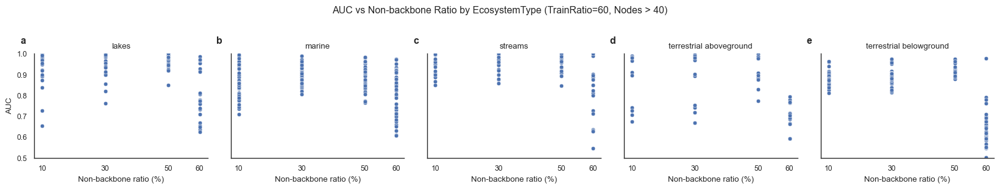

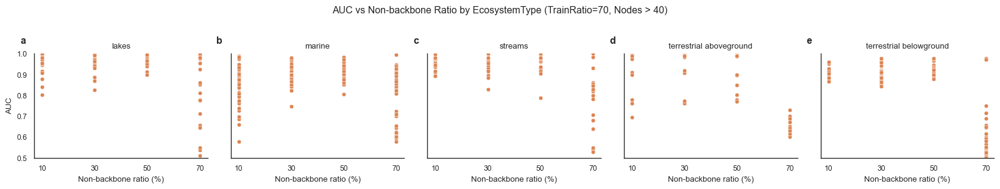

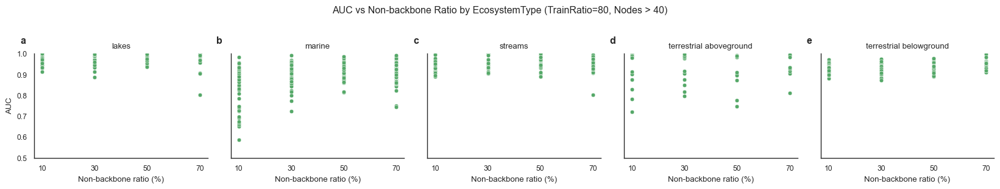

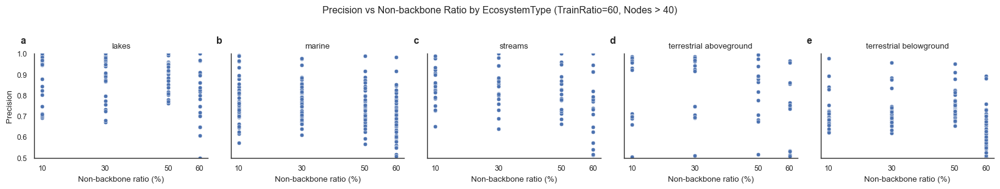

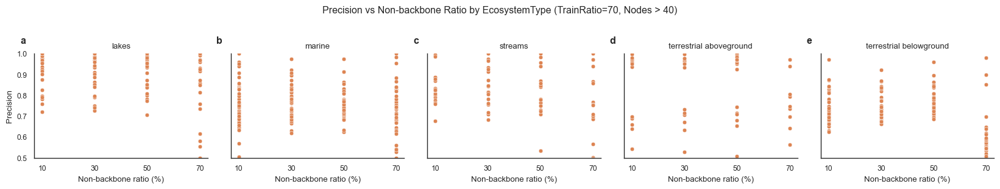

...

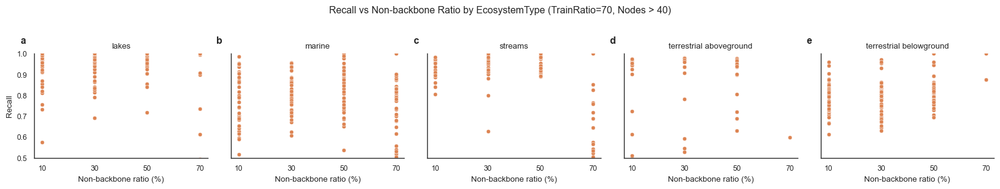

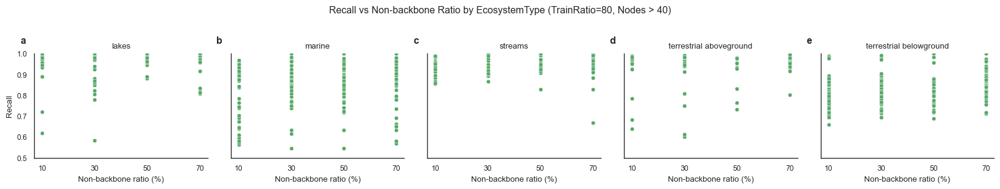

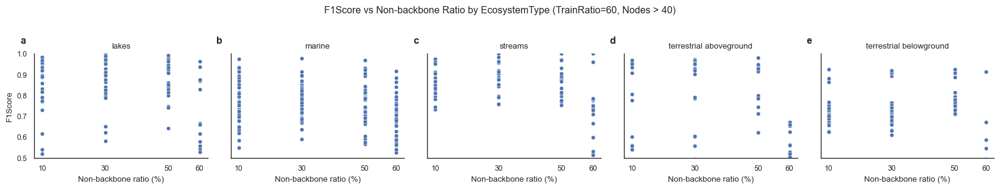

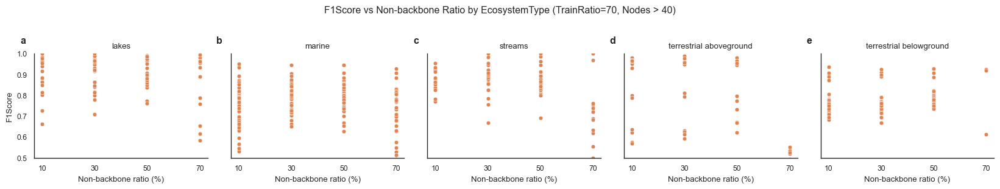

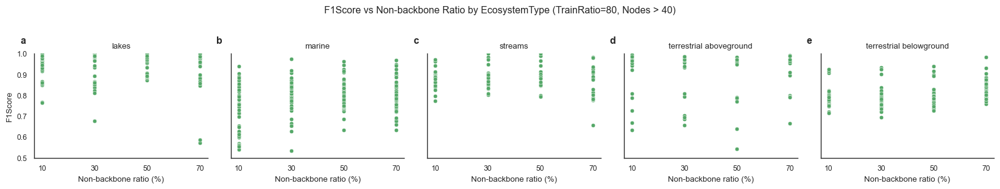

In [1]:
# %% Faceted scatter by EcosystemType (AUC vs NonBackboneRatio), TR=60 — robust merge + panel letters + clean titles
import os, glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ========= Config =========
# Now pointing to the NON-backbone sweep
CSV_PATH = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_non-backboneRatio_10-70/"
    "prediction_scores_logs"
)
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
Y_LIM = (0.5, 1.0)
NODES_THRESHOLD = 40
# ==========================

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    name = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

# Resolve INPUT_DIR whether CSV_PATH is a file or a folder
INPUT_DIR = CSV_PATH if os.path.isdir(CSV_PATH) else os.path.dirname(CSV_PATH)

# Collect CSVs (dedup to avoid pattern overlap)
files = []
for p in GLOB_PATTERNS:
    files.extend(sorted(glob.glob(os.path.join(INPUT_DIR, p))))
files = list(dict.fromkeys(files))
if not files and os.path.isfile(CSV_PATH):
    files = [CSV_PATH]

# === Metrics to plot (same as before) ===
METRICS_TO_PLOT = [
    ("AUC", ["AUC"]),
    ("Precision", ["Precision"]),
    ("Recall",    ["Recall"]),
    ("F1Score",   ["F1Score", "F1_Score", "F1"]),
]

# === Load metadata and compute allowed foodwebs (Nodes > 40) ===
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_nodes = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
nodes_col = pick_col(meta_all.columns, ["Nodes","nodes","N"])

meta_all["Foodweb_key"] = meta_all[fw_col_nodes].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col] > NODES_THRESHOLD, "Foodweb_key"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

def build_df_for_ratio_metric(TRAIN_RATIO_TARGET: int, metric_candidates, metric_label: str) -> pd.DataFrame:
    """Build aggregated DF filtered to a given TrainRatio for a given METRIC, merged with EcosystemType."""
    rows = []
    for path in files:
        # Filter by Nodes > threshold using metadata
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            tdf = pd.read_csv(path)

            # Non-backbone ratio column (robust)
            nb = pick_col(
                tdf.columns,
                ["NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO"]
            )
            mcol = pick_col(tdf.columns, metric_candidates)
            tr   = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in tdf.columns), None)

            tdf[nb]   = pd.to_numeric(tdf[nb], errors="coerce")
            tdf[mcol] = pd.to_numeric(tdf[mcol], errors="coerce")
            if tr:
                tdf[tr] = pd.to_numeric(tdf[tr], errors="coerce")
                tdf = tdf[tdf[tr] == TRAIN_RATIO_TARGET]

            tdf = tdf.dropna(subset=[nb, mcol]).copy()
            tdf["Foodweb_key"] = fw_key

            rows.append(
                tdf[[nb, mcol, "Foodweb_key"]].rename(
                    columns={nb: "NonBackboneRatio", mcol: metric_label}
                )
            )
        except Exception:
            continue

    df = pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(
        columns=["NonBackboneRatio", metric_label, "Foodweb_key"]
    )

    # Attach Ecosystem metadata (same logic as before, but reusing meta_all with Foodweb_key)
    fw_col  = fw_col_nodes
    eco_col = pick_col(meta_all.columns, ["EcosystemType","Ecosystem","ecosystem_type","Habitat"])

    meta2 = meta_all.rename(columns={fw_col: "Foodweb_meta", eco_col: "EcosystemType"})[
        ["Foodweb_meta", "EcosystemType", "Foodweb_key"]
    ].copy()

    df = df.merge(meta2[["Foodweb_key","EcosystemType"]], on="Foodweb_key", how="left")
    df["EcosystemType"] = df["EcosystemType"].fillna("Unknown")
    return df

def plot_faceted_metric(df: pd.DataFrame, train_ratio: int, color: str, metric_label: str):
    """Plot 1-row faceted scatter for a given METRIC with panel letters and clean titles (NonBackboneRatio version)."""
    sns.set_theme(style="white", context="paper")

    eco_order = sorted(df["EcosystemType"].dropna().unique())
    if len(eco_order) > 5:
        eco_order = eco_order[:5]
    n_cols = len(eco_order) if len(eco_order) > 0 else 1

    g = sns.relplot(
        data=df[df["EcosystemType"].isin(eco_order)],
        kind="scatter",
        x="NonBackboneRatio", y=metric_label,
        col="EcosystemType",
        col_order=eco_order,
        col_wrap=n_cols,        # -> one row
        height=3, aspect=1.1,
        facet_kws=dict(sharex=True, sharey=True),
        color=color
    )

    # Axes formatting
    for ax in g.axes.flat:
        if Y_LIM:
            ax.set_ylim(*Y_LIM)
        try:
            xs = sorted(df["NonBackboneRatio"].dropna().unique())
            if len(xs) and all(float(x).is_integer() for x in xs):
                ax.set_xticks(xs)
        except Exception:
            pass

    # Titles only with ecosystem name + bold panel letters
    letters = [chr(ord('a') + i) for i in range(len(g.col_names))]
    for i, (ax, name) in enumerate(zip(g.axes.flat, g.col_names)):
        ax.set_title(name)
        ax.annotate(
            letters[i],
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )

    g.set_xlabels("Non-backbone ratio (%)")
    g.set_ylabels(metric_label)
    g.fig.suptitle(
        f"{metric_label} vs Non-backbone Ratio by EcosystemType "
        f"(TrainRatio={train_ratio}, Nodes > {NODES_THRESHOLD})",
        y=1.02
    )
    plt.tight_layout()
    plt.show()

# === Generate the metric plots, same TR colors as before ===
for metric_label, candidates in METRICS_TO_PLOT:
    df60_m = build_df_for_ratio_metric(60, candidates, metric_label)
    plot_faceted_metric(df60_m, 60, "C0", metric_label)

    for tr, col in [(70, "C1"), (80, "C2")]:
        df_tr_m = build_df_for_ratio_metric(tr, candidates, metric_label)
        plot_faceted_metric(df_tr_m, tr, col, metric_label)


[INFO] Foodwebs with Nodes > 40 in metadata: 157


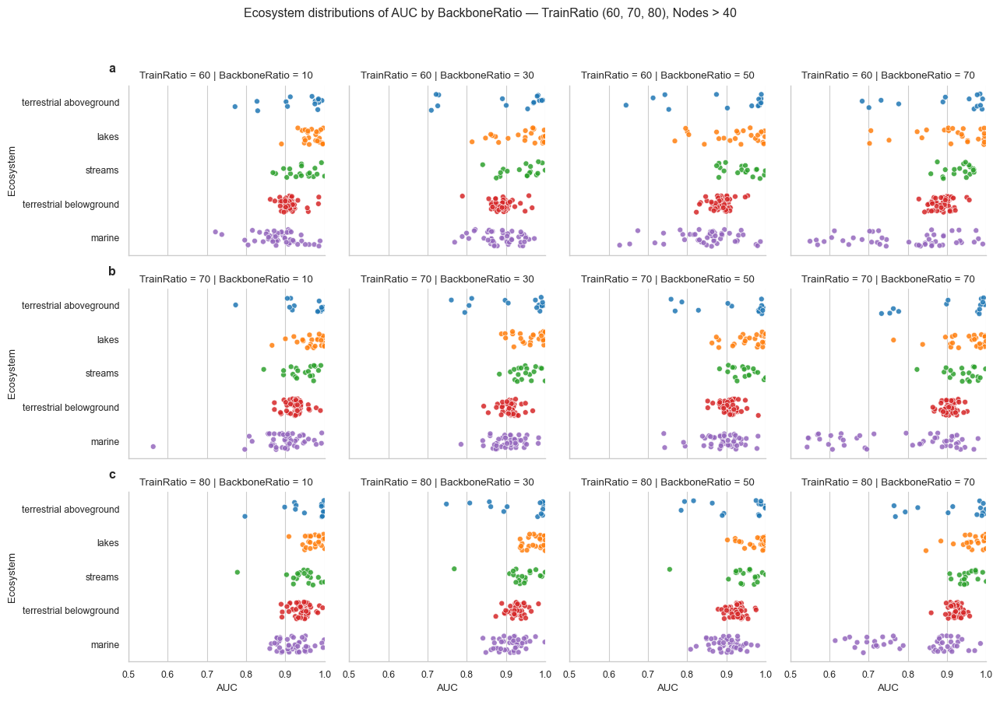

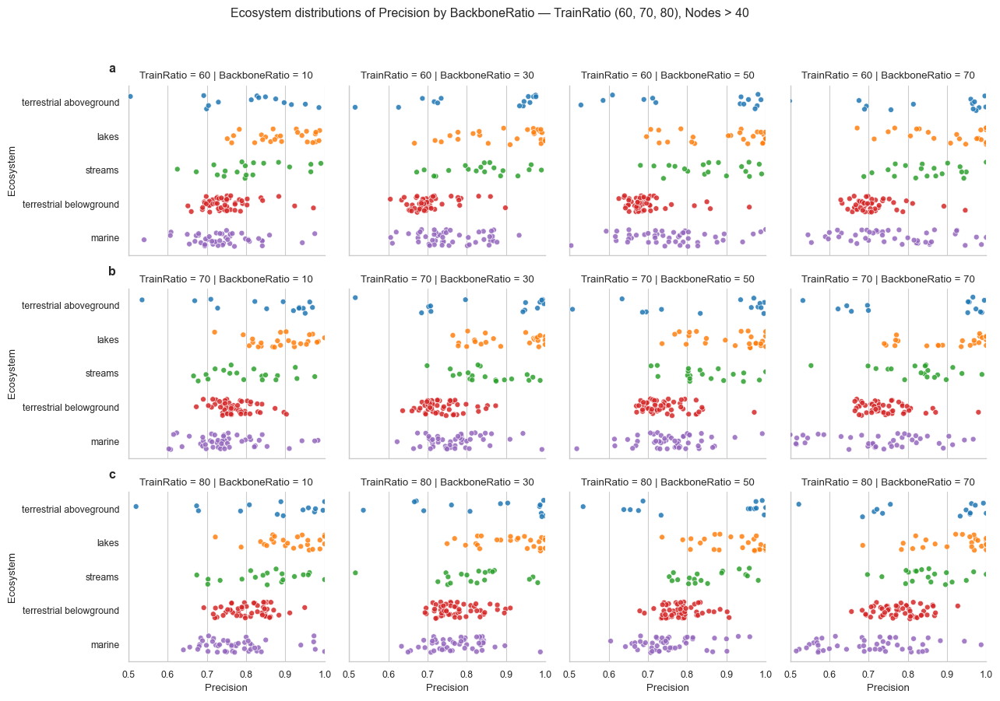

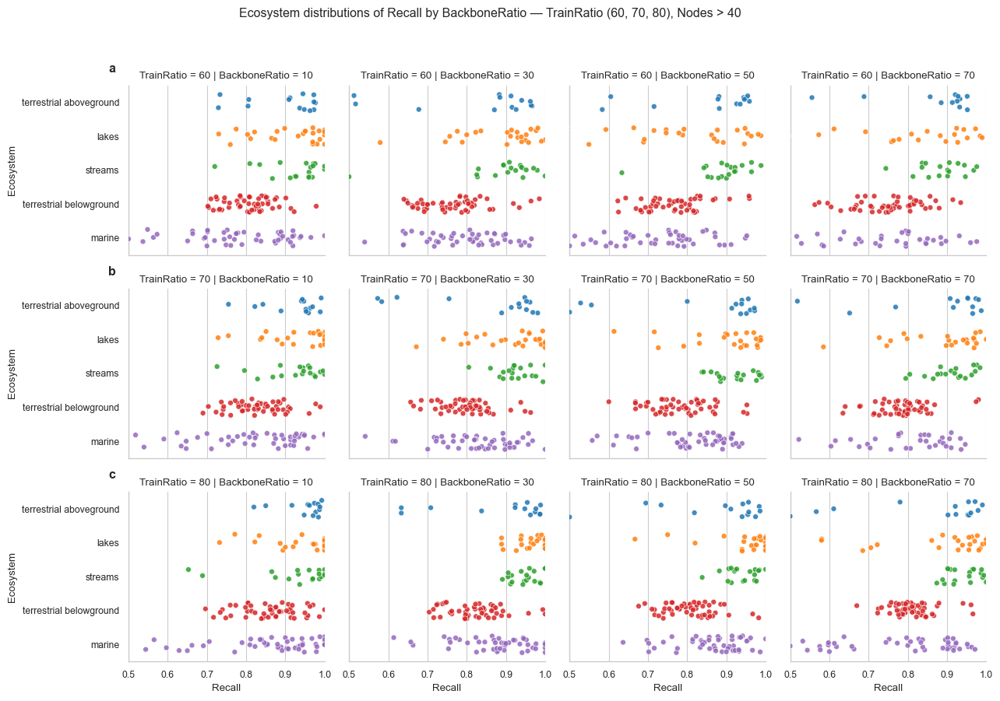

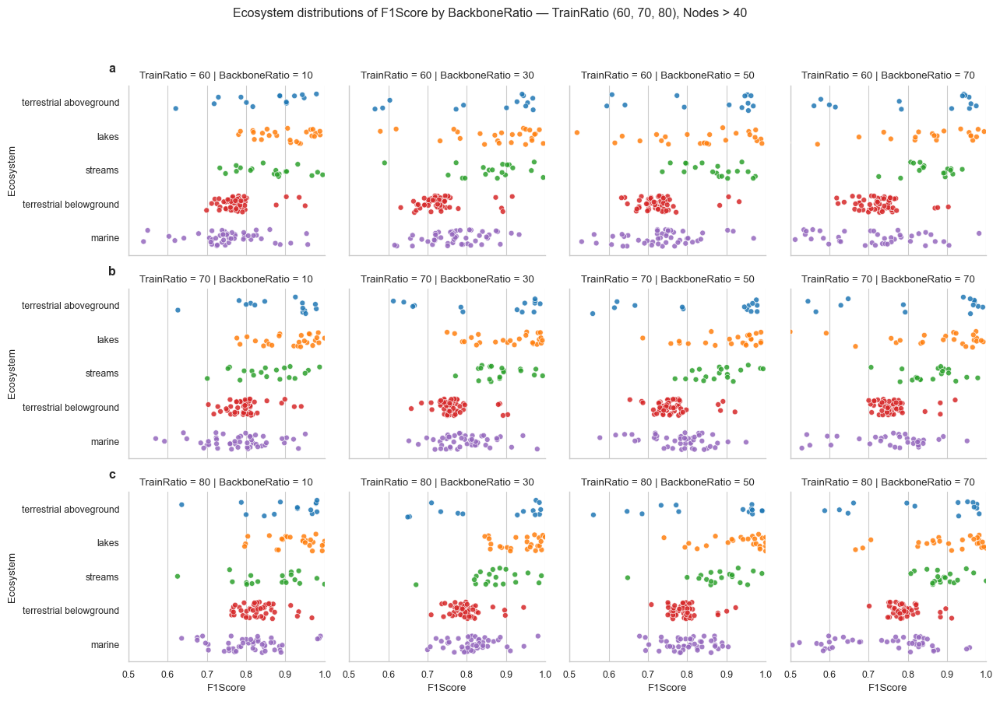

In [1]:
# %% Option B — Ecosystem-grouped strip plots per BackboneRatio (rows=TrainRatio 60/70/80, colored, white borders, no legend) + row letters a,b,c
import os, glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ========= Config =========
CSV_PATH = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
TRAIN_RATIOS = [60, 70, 80]
AUC_LIM = (0.5, 1.0)
NODES_THRESHOLD = 40
# ==========================

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    name = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

INPUT_DIR = CSV_PATH if os.path.isdir(CSV_PATH) else os.path.dirname(CSV_PATH)

# Gather CSVs
files = []
for p in GLOB_PATTERNS:
    files.extend(sorted(glob.glob(os.path.join(INPUT_DIR, p))))
files = list(dict.fromkeys(files))
if not files and os.path.isfile(CSV_PATH):
    files = [CSV_PATH]

# ---- Load ecosystem metadata and compute allowed foodwebs (Nodes > 40) ----
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_meta   = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
eco_col_meta  = pick_col(meta_all.columns, ["EcosystemType","Ecosystem","ecosystem_type","Habitat"])
nodes_col_meta = pick_col(meta_all.columns, ["Nodes","nodes","N"])

meta_all["Foodweb_key"] = meta_all[fw_col_meta].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col_meta] > NODES_THRESHOLD, "Foodweb_key"].unique()
)
print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# meta2 used later for merges
meta2 = meta_all.rename(columns={fw_col_meta:"Foodweb_meta", eco_col_meta:"EcosystemType"})[
    ["Foodweb_meta","EcosystemType","Foodweb_key"]
].copy()

# ---- Build dataframe for TR in [60,70,80] and attach EcosystemType (AUC) ----
rows = []
for path in files:
    fw_raw = derive_foodweb_from_filename(path)
    fw_key = sanitize_fw(fw_raw)
    # filter by Nodes > threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        tdf = pd.read_csv(path)
        bb = pick_col(tdf.columns, ["BackboneRatio", "Backbone_Ratio", "Backbone", "b_ratio"])
        auc = pick_col(tdf.columns, ["AUC"])
        trc = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in tdf.columns), None)

        tdf[bb]  = pd.to_numeric(tdf[bb], errors="coerce")
        tdf[auc] = pd.to_numeric(tdf[auc], errors="coerce")
        if trc:
            tdf[trc] = pd.to_numeric(tdf[trc], errors="coerce")
            tdf = tdf[tdf[trc].isin(TRAIN_RATIOS)]
        else:
            continue

        tdf = tdf.dropna(subset=[bb, auc]).copy()
        tdf["Foodweb_key"] = fw_key
        tdf = tdf.rename(columns={bb: "BackboneRatio", auc: "AUC", trc: "TrainRatio"})
        rows.append(tdf[["BackboneRatio", "AUC", "Foodweb_key", "TrainRatio"]])
    except Exception:
        continue

df = pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(columns=["BackboneRatio","AUC","Foodweb_key","TrainRatio"])

# Attach ecosystem metadata
df = df.merge(meta2[["Foodweb_key","EcosystemType"]], on="Foodweb_key", how="left")
df["EcosystemType"] = df["EcosystemType"].fillna("Unknown")

# ---- Strip plots: rows=TrainRatio, cols=BackboneRatio, hue=EcosystemType (no legend), white borders ----
sns.set_theme(style="whitegrid", context="paper")

# Consistent ecosystem order and palette across all rows
eco_order = (
    df.groupby("EcosystemType")["AUC"].median().sort_values(ascending=False).index
    if not df.empty else None
)
palette = sns.color_palette("tab10", n_colors=len(eco_order))
palette = {eco: palette[i % len(palette)] for i, eco in enumerate(eco_order)}

br_order = sorted(df["BackboneRatio"].dropna().unique())
row_order = [r for r in TRAIN_RATIOS if r in df["TrainRatio"].unique()]

g = sns.catplot(
    data=df,
    kind="strip",
    x="AUC", y="EcosystemType",
    hue="EcosystemType",
    row="TrainRatio", row_order=row_order,         # rows: 60, 70, 80
    col="BackboneRatio", col_order=br_order,
    order=eco_order,
    palette=palette,
    jitter=0.25, alpha=0.85, dodge=False, height=3, aspect=1.1,
    edgecolor="white", linewidth=0.5,
    legend=False
)

# Formatting
for ax in g.axes.flat:
    if AUC_LIM:
        ax.set_xlim(*AUC_LIM)

g.set_xlabels("AUC")
g.set_ylabels("Ecosystem")
g.fig.suptitle(
    f"Ecosystem distributions of AUC by BackboneRatio — TrainRatio (60, 70, 80), Nodes > {NODES_THRESHOLD}",
    y=0.995
)

# === Add bold row letters (a, b, c) on the first panel of each row ===
row_letters = ["a", "b", "c"]
axes_arr = g.axes
try:
    n_rows = axes_arr.shape[0] if hasattr(axes_arr, "shape") else len(row_order)
    for i in range(min(n_rows, len(row_letters))):
        ax0 = axes_arr[i, 0] if hasattr(axes_arr, "ndim") and axes_arr.ndim == 2 else axes_arr[i]
        ax0.annotate(
            row_letters[i],
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-12, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )
except Exception:
    pass

plt.tight_layout(rect=[0.02, 0, 1, 0.965])
plt.show()

# ========= Loop to generate additional metrics with identical styling =========
OTHER_METRICS = [
    ("Precision", ["Precision"]),
    ("Recall",    ["Recall"]),
    ("F1Score",   ["F1Score", "F1_Score", "F1"]),
]

for metric_label, metric_candidates in OTHER_METRICS:
    # Build df for this metric (keeping everything else intact)
    rows_m = []
    for path in files:
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            tdf = pd.read_csv(path)
            bb   = pick_col(tdf.columns, ["BackboneRatio", "Backbone_Ratio", "Backbone", "b_ratio"])
            mcol = pick_col(tdf.columns, metric_candidates)
            trc  = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in tdf.columns), None)

            tdf[bb]   = pd.to_numeric(tdf[bb], errors="coerce")
            tdf[mcol] = pd.to_numeric(tdf[mcol], errors="coerce")
            if trc:
                tdf[trc] = pd.to_numeric(tdf[trc], errors="coerce")
                tdf = tdf[tdf[trc].isin(TRAIN_RATIOS)]
            else:
                continue

            tdf = tdf.dropna(subset=[bb, mcol]).copy()
            tdf["Foodweb_key"] = fw_key
            tdf = tdf.rename(columns={bb: "BackboneRatio", mcol: metric_label, trc: "TrainRatio"})
            rows_m.append(tdf[["BackboneRatio", metric_label, "Foodweb_key", "TrainRatio"]])
        except Exception:
            continue

    dfm = pd.concat(rows_m, ignore_index=True) if rows_m else pd.DataFrame(columns=["BackboneRatio",metric_label,"Foodweb_key","TrainRatio"])
    dfm = dfm.merge(meta2[["Foodweb_key","EcosystemType"]], on="Foodweb_key", how="left")
    dfm["EcosystemType"] = dfm["EcosystemType"].fillna("Unknown")

    br_order_m = sorted(dfm["BackboneRatio"].dropna().unique())
    row_order_m = [r for r in TRAIN_RATIOS if r in dfm["TrainRatio"].unique()]

    g = sns.catplot(
        data=dfm,
        kind="strip",
        x=metric_label, y="EcosystemType",
        hue="EcosystemType",
        row="TrainRatio", row_order=row_order_m,
        col="BackboneRatio", col_order=br_order_m,
        order=eco_order,
        palette=palette,
        jitter=0.25, alpha=0.85, dodge=False, height=3, aspect=1.1,
        edgecolor="white", linewidth=0.5,
        legend=False
    )

    for ax in g.axes.flat:
        if AUC_LIM:
            ax.set_xlim(*AUC_LIM)

    g.set_xlabels(metric_label)
    g.set_ylabels("Ecosystem")
    g.fig.suptitle(
        f"Ecosystem distributions of {metric_label} by BackboneRatio — TrainRatio (60, 70, 80), Nodes > {NODES_THRESHOLD}",
        y=0.995
    )

    # Row letters (a, b, c)
    axes_arr = g.axes
    try:
        n_rows = axes_arr.shape[0] if hasattr(axes_arr, "shape") else len(row_order_m)
        for i in range(min(n_rows, len(row_letters))):
            ax0 = axes_arr[i, 0] if hasattr(axes_arr, "ndim") and axes_arr.ndim == 2 else axes_arr[i]
            ax0.annotate(
                row_letters[i],
                xy=(0, 1), xycoords="axes fraction",
                xytext=(-12, 10), textcoords="offset points",
                ha="right", va="bottom",
                fontsize="large", fontweight="bold",
                annotation_clip=False
            )
    except Exception:
        pass

    plt.tight_layout(rect=[0.02, 0, 1, 0.965])
    plt.show()

[INFO] Foodwebs with Nodes > 40 in metadata: 157


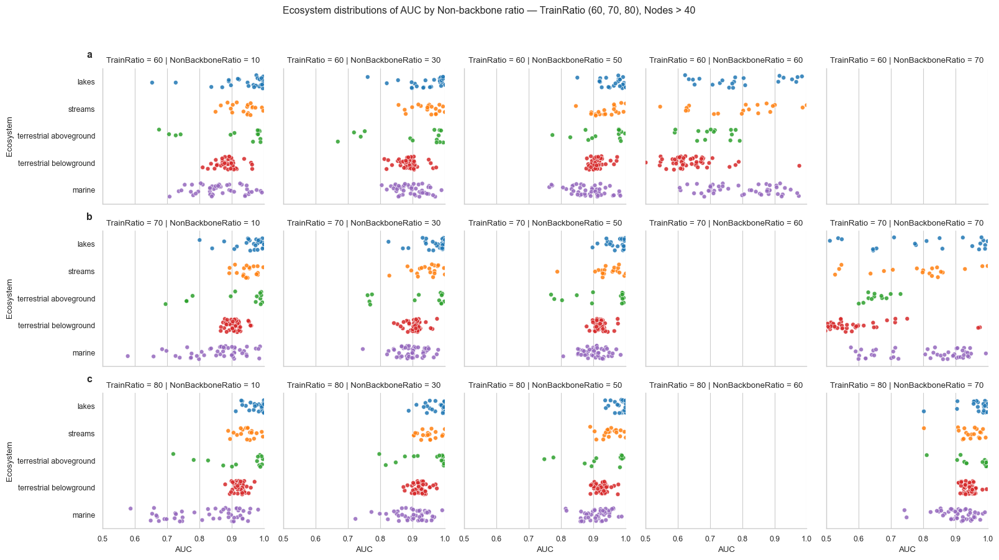

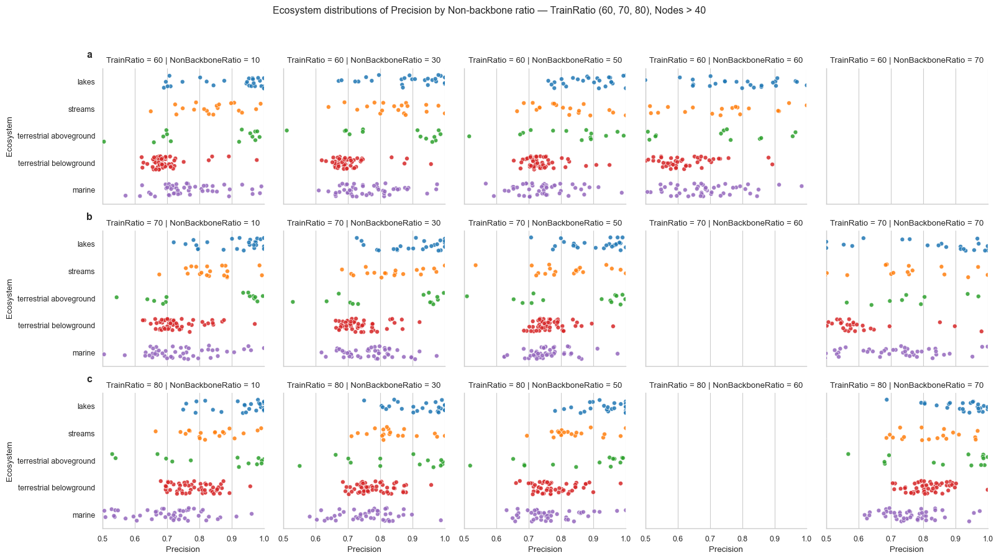

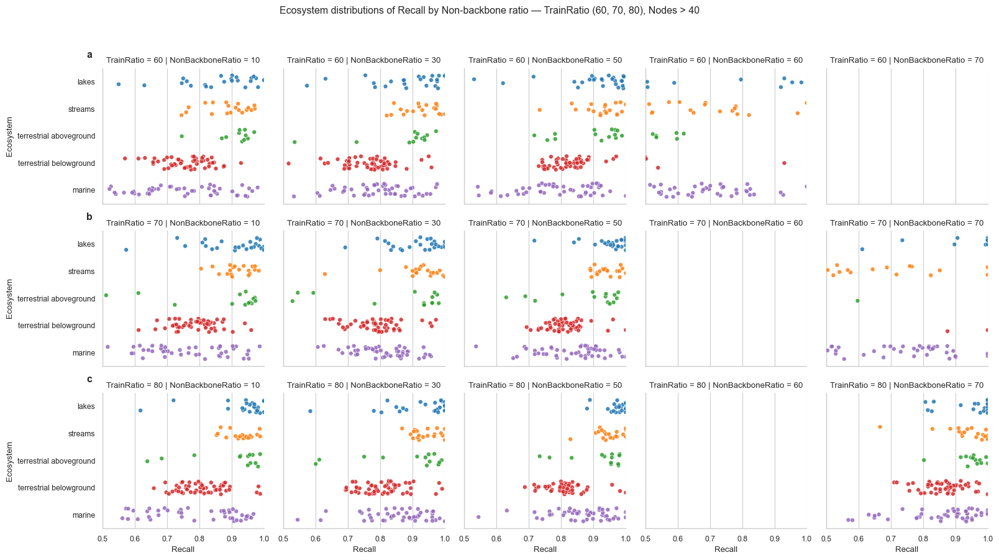

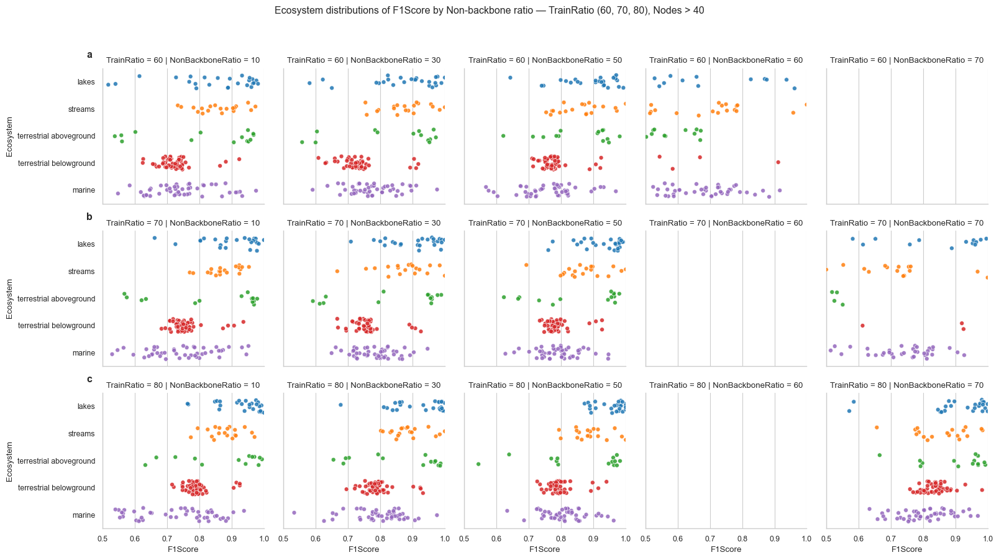

In [1]:
# %% Option B — Ecosystem-grouped strip plots per NonBackboneRatio
# (rows=TrainRatio 60/70/80, colored, white borders, no legend) + row letters a,b,c
import os, glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ========= Config =========
CSV_PATH = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_non-backboneRatio_10-70/"
    "prediction_scores_logs"
)
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
TRAIN_RATIOS = [60, 70, 80]
AUC_LIM = (0.5, 1.0)
NODES_THRESHOLD = 40
# ==========================

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    name = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

INPUT_DIR = CSV_PATH if os.path.isdir(CSV_PATH) else os.path.dirname(CSV_PATH)

# Gather CSVs
files = []
for p in GLOB_PATTERNS:
    files.extend(sorted(glob.glob(os.path.join(INPUT_DIR, p))))
files = list(dict.fromkeys(files))
if not files and os.path.isfile(CSV_PATH):
    files = [CSV_PATH]

# ---- Load ecosystem metadata and compute allowed foodwebs (Nodes > 40) ----
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_meta    = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
eco_col_meta   = pick_col(meta_all.columns, ["EcosystemType","Ecosystem","ecosystem_type","Habitat"])
nodes_col_meta = pick_col(meta_all.columns, ["Nodes","nodes","N"])

meta_all["Foodweb_key"] = meta_all[fw_col_meta].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col_meta] > NODES_THRESHOLD, "Foodweb_key"].unique()
)
print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# meta2 used later for merges
meta2 = meta_all.rename(columns={fw_col_meta:"Foodweb_meta", eco_col_meta:"EcosystemType"})[
    ["Foodweb_meta","EcosystemType","Foodweb_key"]
].copy()

# ---- Build dataframe for TR in [60,70,80] and attach EcosystemType (AUC) ----
rows = []
for path in files:
    fw_raw = derive_foodweb_from_filename(path)
    fw_key = sanitize_fw(fw_raw)
    # filter by Nodes > threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        tdf = pd.read_csv(path)
        nb  = pick_col(
            tdf.columns,
            ["NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO"]
        )
        auc = pick_col(tdf.columns, ["AUC"])
        trc = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in tdf.columns), None)

        tdf[nb]  = pd.to_numeric(tdf[nb], errors="coerce")
        tdf[auc] = pd.to_numeric(tdf[auc], errors="coerce")
        if trc:
            tdf[trc] = pd.to_numeric(tdf[trc], errors="coerce")
            tdf = tdf[tdf[trc].isin(TRAIN_RATIOS)]
        else:
            continue

        tdf = tdf.dropna(subset=[nb, auc]).copy()
        tdf["Foodweb_key"] = fw_key
        tdf = tdf.rename(columns={nb: "NonBackboneRatio", auc: "AUC", trc: "TrainRatio"})
        rows.append(tdf[["NonBackboneRatio", "AUC", "Foodweb_key", "TrainRatio"]])
    except Exception:
        continue

df = pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(
    columns=["NonBackboneRatio","AUC","Foodweb_key","TrainRatio"]
)

# Attach ecosystem metadata
df = df.merge(meta2[["Foodweb_key","EcosystemType"]], on="Foodweb_key", how="left")
df["EcosystemType"] = df["EcosystemType"].fillna("Unknown")

# ---- Strip plots: rows=TrainRatio, cols=NonBackboneRatio, hue=EcosystemType (no legend), white borders ----
sns.set_theme(style="whitegrid", context="paper")

# Consistent ecosystem order and palette across all rows
eco_order = (
    df.groupby("EcosystemType")["AUC"].median().sort_values(ascending=False).index
    if not df.empty else None
)
palette = sns.color_palette("tab10", n_colors=len(eco_order))
palette = {eco: palette[i % len(palette)] for i, eco in enumerate(eco_order)}

nbr_order = sorted(df["NonBackboneRatio"].dropna().unique())
row_order = [r for r in TRAIN_RATIOS if r in df["TrainRatio"].unique()]

g = sns.catplot(
    data=df,
    kind="strip",
    x="AUC", y="EcosystemType",
    hue="EcosystemType",
    row="TrainRatio", row_order=row_order,         # rows: 60, 70, 80
    col="NonBackboneRatio", col_order=nbr_order,
    order=eco_order,
    palette=palette,
    jitter=0.25, alpha=0.85, dodge=False, height=3, aspect=1.1,
    edgecolor="white", linewidth=0.5,
    legend=False
)

# Formatting
for ax in g.axes.flat:
    if AUC_LIM:
        ax.set_xlim(*AUC_LIM)

g.set_xlabels("AUC")
g.set_ylabels("Ecosystem")
g.fig.suptitle(
    f"Ecosystem distributions of AUC by Non-backbone ratio — "
    f"TrainRatio (60, 70, 80), Nodes > {NODES_THRESHOLD}",
    y=0.995
)

# === Add bold row letters (a, b, c) on the first panel of each row ===
row_letters = ["a", "b", "c"]
axes_arr = g.axes
try:
    n_rows = axes_arr.shape[0] if hasattr(axes_arr, "shape") else len(row_order)
    for i in range(min(n_rows, len(row_letters))):
        ax0 = axes_arr[i, 0] if hasattr(axes_arr, "ndim") and axes_arr.ndim == 2 else axes_arr[i]
        ax0.annotate(
            row_letters[i],
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-12, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large", fontweight="bold",
            annotation_clip=False
        )
except Exception:
    pass

plt.tight_layout(rect=[0.02, 0, 1, 0.965])
plt.show()

# ========= Loop to generate additional metrics with identical styling =========
OTHER_METRICS = [
    ("Precision", ["Precision"]),
    ("Recall",    ["Recall"]),
    ("F1Score",   ["F1Score", "F1_Score", "F1"]),
]

for metric_label, metric_candidates in OTHER_METRICS:
    rows_m = []
    for path in files:
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            tdf = pd.read_csv(path)
            nb   = pick_col(
                tdf.columns,
                ["NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO"]
            )
            mcol = pick_col(tdf.columns, metric_candidates)
            trc  = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in tdf.columns), None)

            tdf[nb]   = pd.to_numeric(tdf[nb], errors="coerce")
            tdf[mcol] = pd.to_numeric(tdf[mcol], errors="coerce")
            if trc:
                tdf[trc] = pd.to_numeric(tdf[trc], errors="coerce")
                tdf = tdf[tdf[trc].isin(TRAIN_RATIOS)]
            else:
                continue

            tdf = tdf.dropna(subset=[nb, mcol]).copy()
            tdf["Foodweb_key"] = fw_key
            tdf = tdf.rename(columns={nb: "NonBackboneRatio", mcol: metric_label, trc: "TrainRatio"})
            rows_m.append(tdf[["NonBackboneRatio", metric_label, "Foodweb_key", "TrainRatio"]])
        except Exception:
            continue

    dfm = pd.concat(rows_m, ignore_index=True) if rows_m else pd.DataFrame(
        columns=["NonBackboneRatio",metric_label,"Foodweb_key","TrainRatio"]
    )
    dfm = dfm.merge(meta2[["Foodweb_key","EcosystemType"]], on="Foodweb_key", how="left")
    dfm["EcosystemType"] = dfm["EcosystemType"].fillna("Unknown")

    nbr_order_m = sorted(dfm["NonBackboneRatio"].dropna().unique())
    row_order_m = [r for r in TRAIN_RATIOS if r in dfm["TrainRatio"].unique()]

    g = sns.catplot(
        data=dfm,
        kind="strip",
        x=metric_label, y="EcosystemType",
        hue="EcosystemType",
        row="TrainRatio", row_order=row_order_m,
        col="NonBackboneRatio", col_order=nbr_order_m,
        order=eco_order,
        palette=palette,
        jitter=0.25, alpha=0.85, dodge=False, height=3, aspect=1.1,
        edgecolor="white", linewidth=0.5,
        legend=False
    )

    for ax in g.axes.flat:
        if AUC_LIM:
            ax.set_xlim(*AUC_LIM)

    g.set_xlabels(metric_label)
    g.set_ylabels("Ecosystem")
    g.fig.suptitle(
        f"Ecosystem distributions of {metric_label} by Non-backbone ratio — "
        f"TrainRatio (60, 70, 80), Nodes > {NODES_THRESHOLD}",
        y=0.995
    )

    # Row letters (a, b, c)
    axes_arr = g.axes
    try:
        n_rows = axes_arr.shape[0] if hasattr(axes_arr, "shape") else len(row_order_m)
        for i in range(min(n_rows, len(row_letters))):
            ax0 = axes_arr[i, 0] if hasattr(axes_arr, "ndim") and axes_arr.ndim == 2 else axes_arr[i]
            ax0.annotate(
                row_letters[i],
                xy=(0, 1), xycoords="axes fraction",
                xytext=(-12, 10), textcoords="offset points",
                ha="right", va="bottom",
                fontsize="large", fontweight="bold",
                annotation_clip=False
            )
    except Exception:
        pass

    plt.tight_layout(rect=[0.02, 0, 1, 0.965])
    plt.show()


[INFO] Foodwebs with Nodes > 40 in metadata: 157


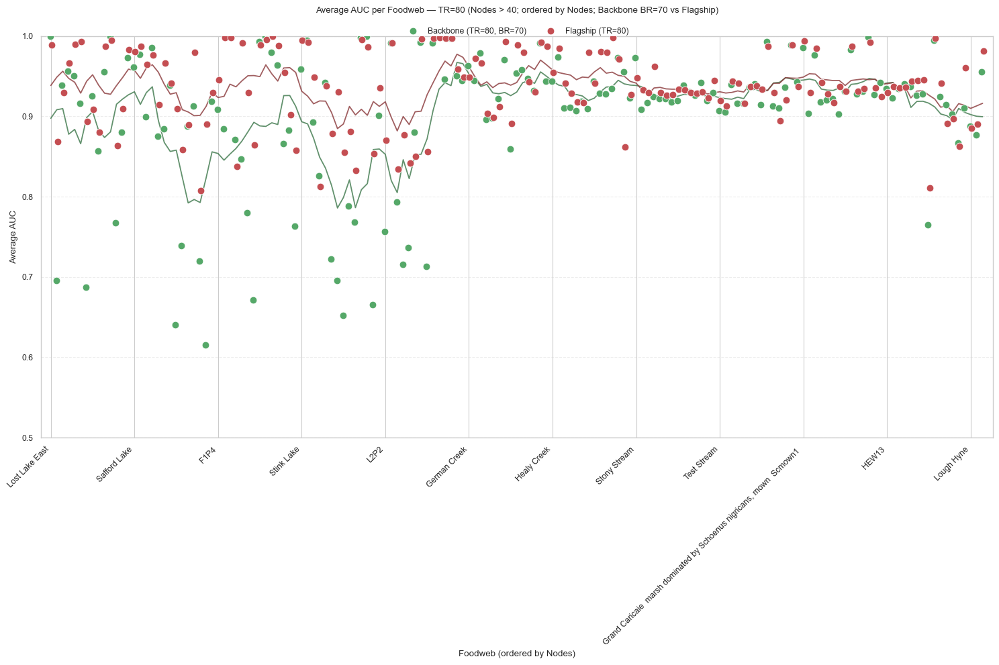

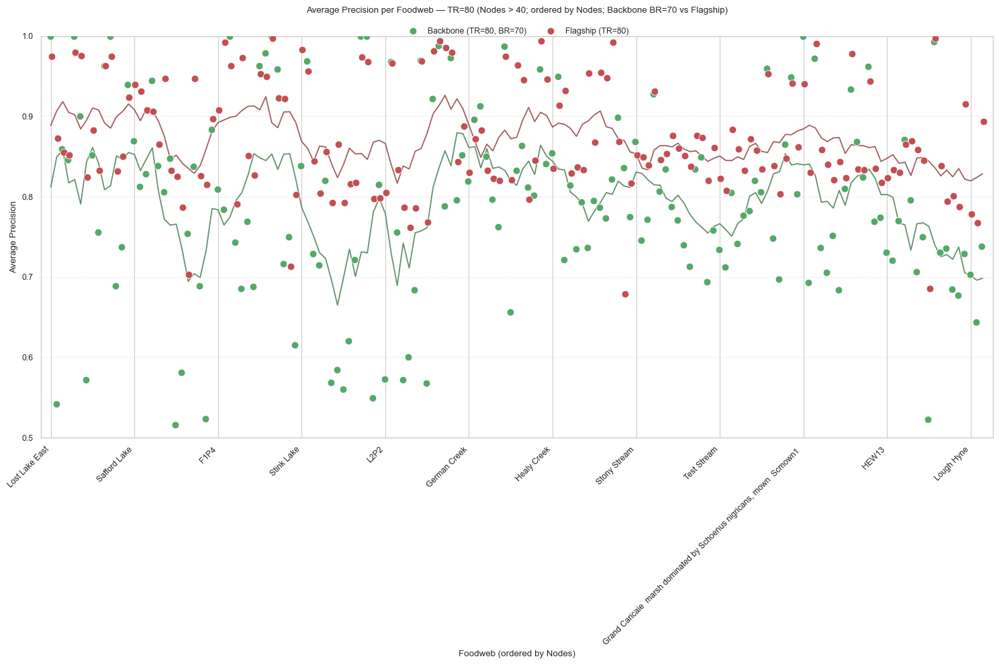

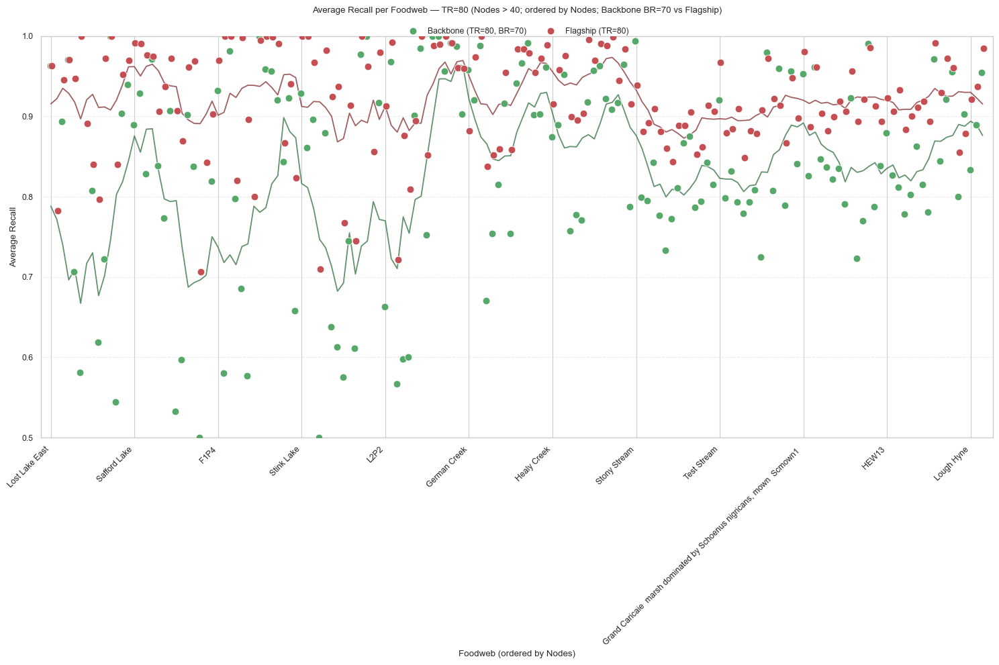

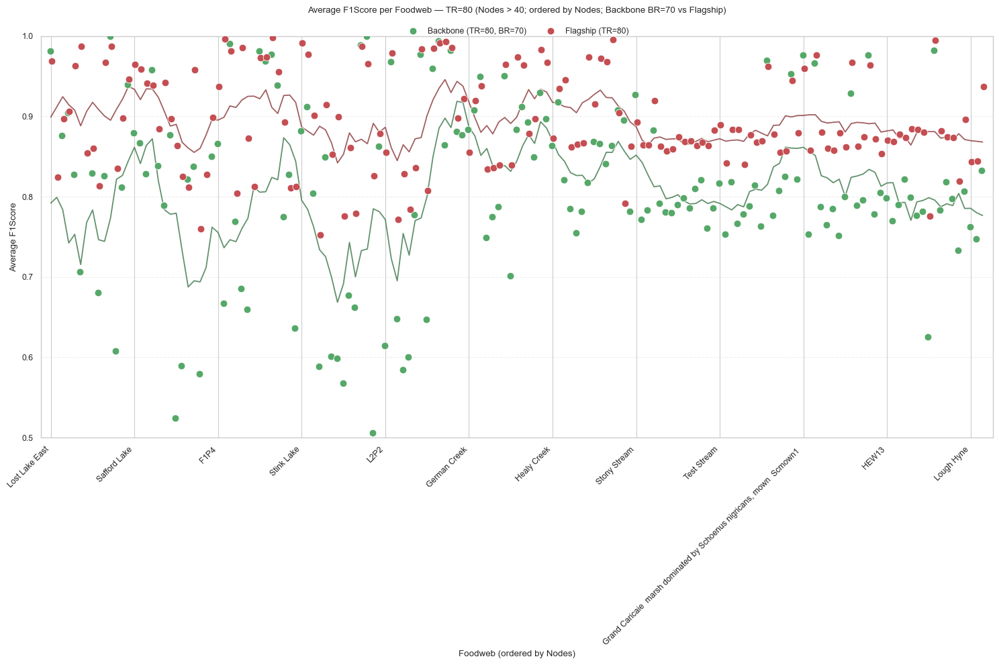

In [1]:
# %% AUC/Precision/Recall/F1Score average by foodweb (overlay two sources) — TR=80
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors  # ← for darkening colors

RESULTS_DIR_BACKBONE = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs"
RESULTS_DIR_FLAGSHIP = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs"
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]

TRAIN_RATIO_TARGET = 80
BACKBONE_RATIO_TARGET = 70  # only for the BACKBONE series
NODES_THRESHOLD = 40        # <-- filter foodwebs with Nodes > 40

sns.set_theme(style="whitegrid", context="paper")

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    n = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        n = n.replace(token, "_")
    n = "_".join([p for p in n.split("_") if p])
    return n.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

# === Precompute which foodwebs have Nodes > 40 ===
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_nodes = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
nodes_col    = pick_col(meta_all.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

meta_all["Foodweb_key"] = meta_all[fw_col_nodes].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col] > NODES_THRESHOLD, "Foodweb_key"].unique()
)
print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

def load_metric_means(results_dir, tr_target, br_target=None):
    files = []
    for pat in GLOB_PATTERNS:
        files.extend(glob.glob(os.path.join(results_dir, pat)))
    files = sorted(set(files))

    rows = []
    for path in files:
        # --- filter by Nodes > threshold via metadata ---
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            df = pd.read_csv(path)
        except Exception:
            continue

        try:
            metric_col = pick_col(df.columns, [METRIC])
        except KeyError:
            continue

        bb  = next((c for c in ["BackboneRatio","Backbone_Ratio","Backbone","b_ratio"] if c in df.columns), None)
        tr  = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in df.columns), None)
        if tr is None:
            continue

        df[metric_col] = pd.to_numeric(df[metric_col], errors="coerce")
        df[tr]  = pd.to_numeric(df[tr], errors="coerce")
        if bb is not None:
            df[bb] = pd.to_numeric(df[bb], errors="coerce")

        df["_TR"] = (df[tr]*100).round().astype(int) if df[tr].dropna().between(0,1).all() else df[tr].round().astype(int)

        if br_target is not None:
            if bb is None:
                continue
            df["_BR"] = (df[bb]*100).round().astype(int) if df[bb].dropna().between(0,1).all() else df[bb].round().astype(int)
            dff = df[(df["_TR"] == tr_target) & (df["_BR"] == br_target)].copy()
        else:
            dff = df[(df["_TR"] == tr_target)].copy()

        if dff.empty:
            continue

        rows.append({"Foodweb": derive_foodweb_from_filename(path), f"{METRIC}_mean": dff[metric_col].mean(skipna=True)})

    return pd.DataFrame(rows)

def darken(color, amount=0.7):
    r, g, b = mcolors.to_rgb(color)
    return tuple((amount*np.array([r, g, b])).clip(0, 1))

# === Loop over all metrics with identical plotting logic ===
for METRIC in ["AUC", "Precision", "Recall", "F1Score"]:
    # Load both series for this METRIC (already filtered by Nodes > 40)
    df_backbone = load_metric_means(RESULTS_DIR_BACKBONE, TRAIN_RATIO_TARGET, BACKBONE_RATIO_TARGET)
    df_flagship = load_metric_means(RESULTS_DIR_FLAGSHIP, TRAIN_RATIO_TARGET, br_target=None)

    if df_backbone.empty and df_flagship.empty:
        print(f"[Info] No matching rows for metric {METRIC}. Skipping.")
        continue

    # Merge, keep all foodwebs from both
    merged = pd.merge(
        df_backbone.rename(columns={f"{METRIC}_mean":f"{METRIC}_backbone"}),
        df_flagship.rename(columns={f"{METRIC}_mean":f"{METRIC}_flagship"}),
        on="Foodweb", how="outer"
    )

    # Load metadata and sort by Nodes (ascending)
    meta = pd.read_csv(ECOSYSTEM_META_CSV)
    fw_col    = pick_col(meta.columns, ["Foodweb","FoodWeb","foodweb","Network"])
    nodes_col = pick_col(meta.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

    meta2 = meta[[fw_col, nodes_col]].rename(columns={fw_col:"Foodweb_meta", nodes_col:"Nodes"}).copy()
    meta2["Foodweb_key"] = meta2["Foodweb_meta"].astype(str).map(sanitize_fw)

    merged["Foodweb_key"] = merged["Foodweb"].astype(str).map(sanitize_fw)
    merged = merged.merge(meta2[["Foodweb_key","Nodes"]], on="Foodweb_key", how="left")
    merged["Nodes_num"] = pd.to_numeric(merged["Nodes"], errors="coerce")

    # Optional extra safety: ensure we only keep Nodes > threshold
    merged = merged[merged["Nodes_num"] > NODES_THRESHOLD]

    if merged.empty:
        print(f"[Info] After Nodes > {NODES_THRESHOLD} filter, nothing left for {METRIC}. Skipping.")
        continue

    if merged["Nodes_num"].notna().any():
        merged = merged.sort_values("Nodes_num", ascending=True).reset_index(drop=True)
    else:
        sort_val = merged.get(f"{METRIC}_flagship", pd.Series(index=merged.index)).fillna(
            merged.get(f"{METRIC}_backbone", pd.Series(index=merged.index))
        )
        merged = merged.assign(_sort=sort_val).sort_values("_sort", ascending=True).drop(columns=["_sort"]).reset_index(drop=True)

    # Plotting positions and thinned labels
    x = np.arange(len(merged))
    labels = merged["Foodweb"].tolist()
    step = max(1, int(np.ceil(len(labels) / 12)))
    tick_idx = list(range(0, len(labels), step))

    plt.figure(figsize=(15, 10))
    ax = plt.gca()

    # Scatter series (points)
    ax.scatter(
        x - 0.12, merged.get(f"{METRIC}_backbone"), s=60,
        label=f"Backbone (TR=80, BR={BACKBONE_RATIO_TARGET})",
        color="C2", edgecolors="white", linewidths=0.6, zorder=3
    )
    ax.scatter(
        x + 0.12, merged.get(f"{METRIC}_flagship"), s=60,
        label="Flagship (TR=80)",
        color="C3", edgecolors="white", linewidths=0.6, zorder=3
    )

    # Trend lines (slightly darker than points)
    window = max(5, int(np.ceil(len(merged) * 0.05)))
    trend_backbone = darken("C2", amount=0.7)
    trend_flagship = darken("C3", amount=0.7)

    y_b = merged.get(f"{METRIC}_backbone").to_numpy(dtype=float)
    mask_b = ~np.isnan(y_b)
    if mask_b.any():
        yb_smooth = pd.Series(y_b[mask_b]).rolling(window=window, center=True, min_periods=1).mean().to_numpy()
        ax.plot(x[mask_b], yb_smooth, color=trend_backbone, alpha=0.8, linewidth=1.3, zorder=2)

    y_f = merged.get(f"{METRIC}_flagship").to_numpy(dtype=float)
    mask_f = ~np.isnan(y_f)
    if mask_f.any():
        yf_smooth = pd.Series(y_f[mask_f]).rolling(window=window, center=True, min_periods=1).mean().to_numpy()
        ax.plot(x[mask_f], yf_smooth, color=trend_flagship, alpha=0.8, linewidth=1.3, zorder=2)

    # Axes & grid
    ax.set_xticks(tick_idx)
    ax.set_xticklabels([labels[i] for i in tick_idx], rotation=45, ha="right")
    ax.set_ylim(0.5, 1.0)  # keep same logic/scale
    ax.set_xlabel("Foodweb (ordered by Nodes)")
    ax.set_ylabel(f"Average {METRIC}")
    ax.set_title(
        f"Average {METRIC} per Foodweb — TR=80 (Nodes > {NODES_THRESHOLD}; ordered by Nodes; "
        f"Backbone BR={BACKBONE_RATIO_TARGET} vs Flagship)",
        pad=25
    )
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)
    ax.margins(x=0.01)

    # Legend centered above
    ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.04), ncol=2, frameon=False)

    plt.tight_layout()
    plt.show()

[INFO] Foodwebs with Nodes > 40 in metadata: 157


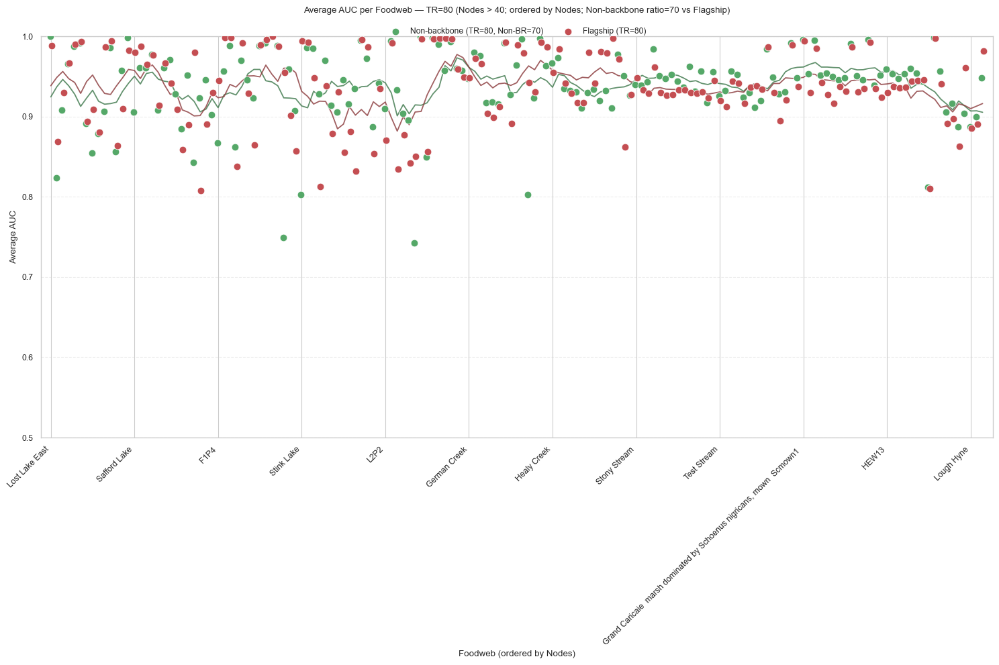

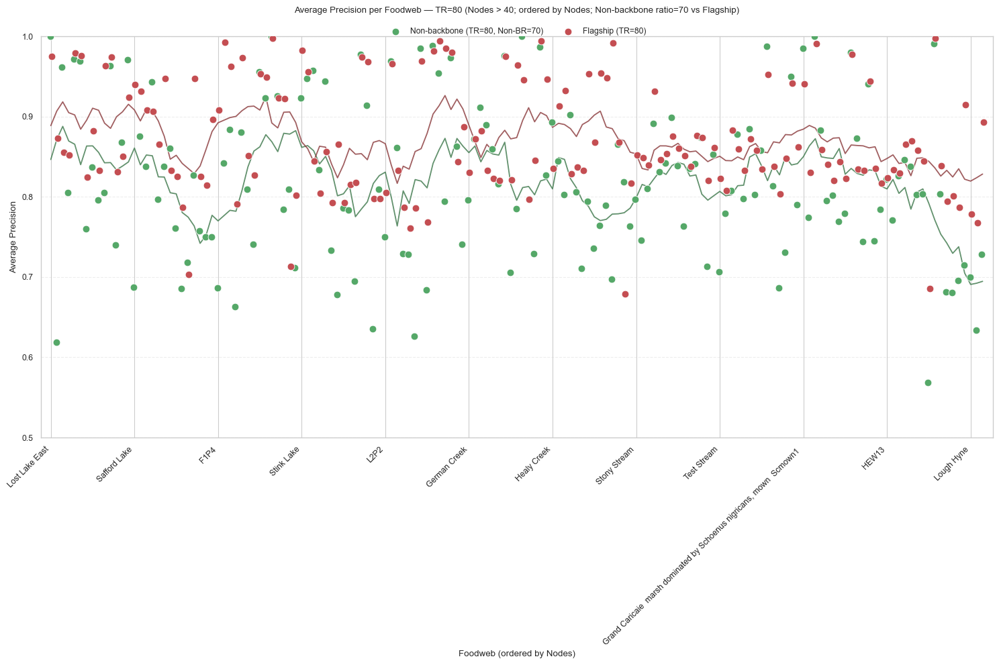

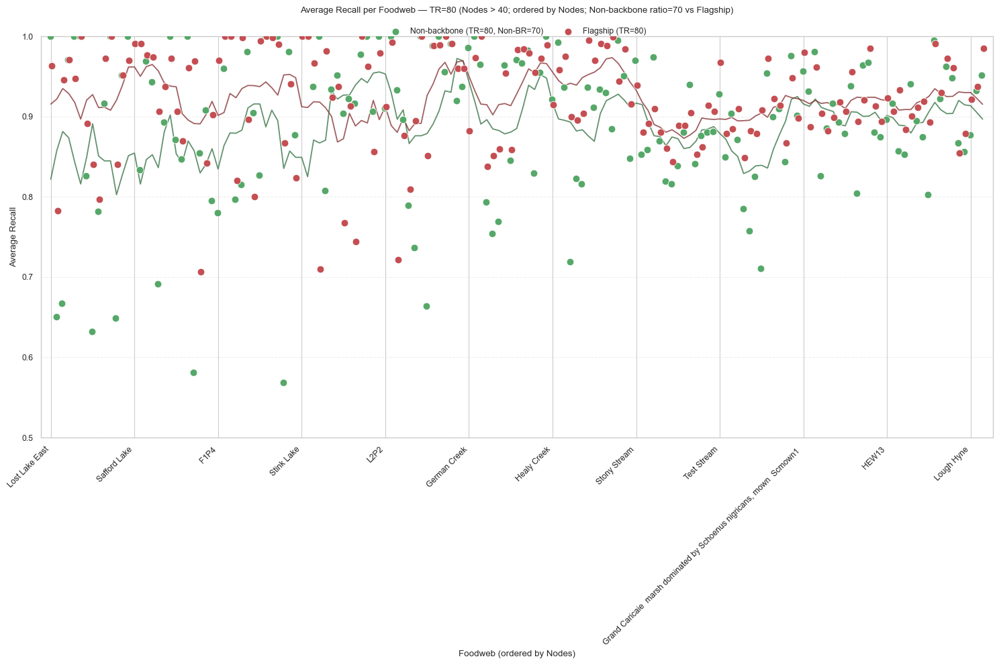

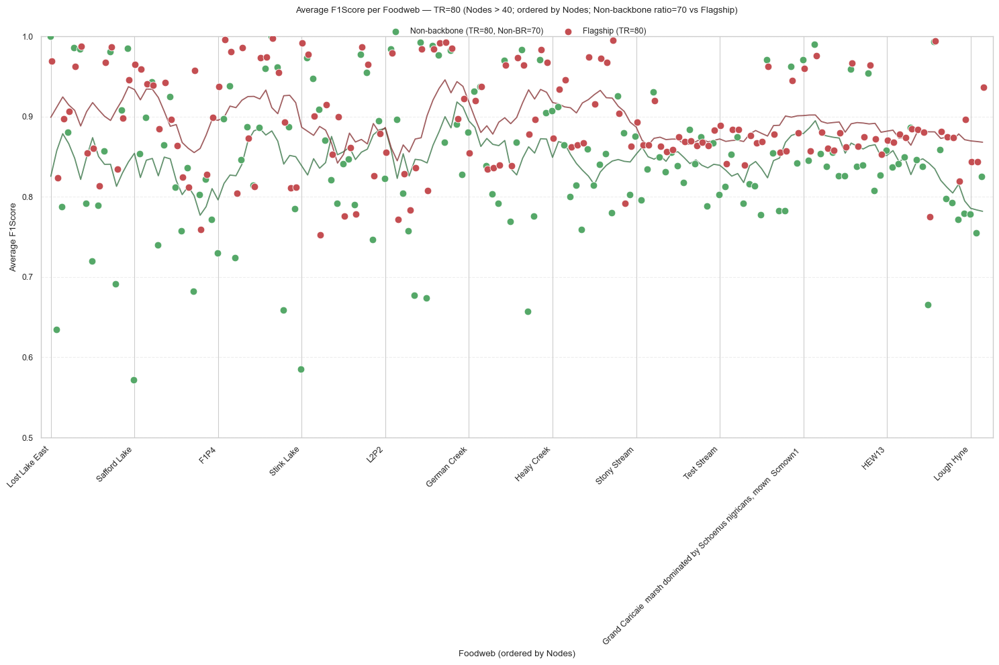

In [1]:
# %% AUC/Precision/Recall/F1Score average by foodweb (overlay two sources) — TR=80
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors  # ← for darkening colors

# Non-backbone vs Flagship
RESULTS_DIR_NONBACKBONE = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_non-backboneRatio_10-70/"
    "prediction_scores_logs"
)
RESULTS_DIR_FLAGSHIP = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs"
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]

TRAIN_RATIO_TARGET = 80
NONBACKBONE_RATIO_TARGET = 70  # only for the NON-BACKBONE series
NODES_THRESHOLD = 40           # <-- filter foodwebs with Nodes > 40

sns.set_theme(style="whitegrid", context="paper")

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    n = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        n = n.replace(token, "_")
    n = "_".join([p for p in n.split("_") if p])
    return n.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

# === Precompute which foodwebs have Nodes > 40 ===
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_nodes = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
nodes_col    = pick_col(meta_all.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

meta_all["Foodweb_key"] = meta_all[fw_col_nodes].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col] > NODES_THRESHOLD, "Foodweb_key"].unique()
)
print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

def load_metric_means(results_dir, tr_target, ratio_target=None):
    files = []
    for pat in GLOB_PATTERNS:
        files.extend(glob.glob(os.path.join(results_dir, pat)))
    files = sorted(set(files))

    rows = []
    for path in files:
        # --- filter by Nodes > threshold via metadata ---
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            df = pd.read_csv(path)
        except Exception:
            continue

        # Metric
        try:
            metric_col = pick_col(df.columns, [METRIC])
        except KeyError:
            continue

        # Ratio column: try NonBackbone first, then Backbone as fallback (for compatibility)
        ratio_col = next(
            (
                c for c in [
                    "NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO",
                    "BackboneRatio", "Backbone_Ratio", "Backbone", "b_ratio"
                ]
                if c in df.columns
            ),
            None
        )
        tr  = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in df.columns), None)
        if tr is None:
            continue

        df[metric_col] = pd.to_numeric(df[metric_col], errors="coerce")
        df[tr]  = pd.to_numeric(df[tr], errors="coerce")
        if ratio_col is not None:
            df[ratio_col] = pd.to_numeric(df[ratio_col], errors="coerce")

        df["_TR"] = (
            (df[tr]*100).round().astype(int)
            if df[tr].dropna().between(0,1).all()
            else df[tr].round().astype(int)
        )

        if ratio_target is not None:
            if ratio_col is None:
                continue
            df["_RATIO"] = (
                (df[ratio_col]*100).round().astype(int)
                if df[ratio_col].dropna().between(0,1).all()
                else df[ratio_col].round().astype(int)
            )
            dff = df[(df["_TR"] == tr_target) & (df["_RATIO"] == ratio_target)].copy()
        else:
            dff = df[(df["_TR"] == tr_target)].copy()

        if dff.empty:
            continue

        rows.append({
            "Foodweb": derive_foodweb_from_filename(path),
            f"{METRIC}_mean": dff[metric_col].mean(skipna=True)
        })

    return pd.DataFrame(rows)

def darken(color, amount=0.7):
    r, g, b = mcolors.to_rgb(color)
    return tuple((amount*np.array([r, g, b])).clip(0, 1))

# === Loop over all metrics with identical plotting logic ===
for METRIC in ["AUC", "Precision", "Recall", "F1Score"]:
    # Load both series for this METRIC (already filtered by Nodes > 40)
    df_nonbackbone = load_metric_means(
        RESULTS_DIR_NONBACKBONE,
        TRAIN_RATIO_TARGET,
        NONBACKBONE_RATIO_TARGET
    )
    df_flagship = load_metric_means(
        RESULTS_DIR_FLAGSHIP,
        TRAIN_RATIO_TARGET,
        ratio_target=None
    )

    if df_nonbackbone.empty and df_flagship.empty:
        print(f"[Info] No matching rows for metric {METRIC}. Skipping.")
        continue

    # Merge, keep all foodwebs from both
    merged = pd.merge(
        df_nonbackbone.rename(columns={f"{METRIC}_mean":f"{METRIC}_nonbackbone"}),
        df_flagship.rename(columns={f"{METRIC}_mean":f"{METRIC}_flagship"}),
        on="Foodweb", how="outer"
    )

    # Load metadata and sort by Nodes (ascending)
    meta = pd.read_csv(ECOSYSTEM_META_CSV)
    fw_col    = pick_col(meta.columns, ["Foodweb","FoodWeb","foodweb","Network"])
    nodes_col = pick_col(meta.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

    meta2 = meta[[fw_col, nodes_col]].rename(
        columns={fw_col:"Foodweb_meta", nodes_col:"Nodes"}
    ).copy()
    meta2["Foodweb_key"] = meta2["Foodweb_meta"].astype(str).map(sanitize_fw)

    merged["Foodweb_key"] = merged["Foodweb"].astype(str).map(sanitize_fw)
    merged = merged.merge(meta2[["Foodweb_key","Nodes"]], on="Foodweb_key", how="left")
    merged["Nodes_num"] = pd.to_numeric(merged["Nodes"], errors="coerce")

    # Optional extra safety: ensure we only keep Nodes > threshold
    merged = merged[merged["Nodes_num"] > NODES_THRESHOLD]

    if merged.empty:
        print(f"[Info] After Nodes > {NODES_THRESHOLD} filter, nothing left for {METRIC}. Skipping.")
        continue

    if merged["Nodes_num"].notna().any():
        merged = merged.sort_values("Nodes_num", ascending=True).reset_index(drop=True)
    else:
        sort_val = merged.get(f"{METRIC}_flagship", pd.Series(index=merged.index)).fillna(
            merged.get(f"{METRIC}_nonbackbone", pd.Series(index=merged.index))
        )
        merged = (
            merged.assign(_sort=sort_val)
                  .sort_values("_sort", ascending=True)
                  .drop(columns=["_sort"])
                  .reset_index(drop=True)
        )

    # Plotting positions and thinned labels
    x = np.arange(len(merged))
    labels = merged["Foodweb"].tolist()
    step = max(1, int(np.ceil(len(labels) / 12)))
    tick_idx = list(range(0, len(labels), step))

    plt.figure(figsize=(15, 10))
    ax = plt.gca()

    # Scatter series (points)
    ax.scatter(
        x - 0.12, merged.get(f"{METRIC}_nonbackbone"), s=60,
        label=f"Non-backbone (TR=80, Non-BR={NONBACKBONE_RATIO_TARGET})",
        color="C2", edgecolors="white", linewidths=0.6, zorder=3
    )
    ax.scatter(
        x + 0.12, merged.get(f"{METRIC}_flagship"), s=60,
        label="Flagship (TR=80)",
        color="C3", edgecolors="white", linewidths=0.6, zorder=3
    )

    # Trend lines (slightly darker than points)
    window = max(5, int(np.ceil(len(merged) * 0.05)))
    trend_nonbb = darken("C2", amount=0.7)
    trend_flagship = darken("C3", amount=0.7)

    y_nb = merged.get(f"{METRIC}_nonbackbone").to_numpy(dtype=float)
    mask_nb = ~np.isnan(y_nb)
    if mask_nb.any():
        ynb_smooth = (
            pd.Series(y_nb[mask_nb])
              .rolling(window=window, center=True, min_periods=1)
              .mean()
              .to_numpy()
        )
        ax.plot(x[mask_nb], ynb_smooth, color=trend_nonbb, alpha=0.8, linewidth=1.3, zorder=2)

    y_f = merged.get(f"{METRIC}_flagship").to_numpy(dtype=float)
    mask_f = ~np.isnan(y_f)
    if mask_f.any():
        yf_smooth = (
            pd.Series(y_f[mask_f])
              .rolling(window=window, center=True, min_periods=1)
              .mean()
              .to_numpy()
        )
        ax.plot(x[mask_f], yf_smooth, color=trend_flagship, alpha=0.8, linewidth=1.3, zorder=2)

    # Axes & grid
    ax.set_xticks(tick_idx)
    ax.set_xticklabels([labels[i] for i in tick_idx], rotation=45, ha="right")
    ax.set_ylim(0.5, 1.0)  # keep same scale
    ax.set_xlabel("Foodweb (ordered by Nodes)")
    ax.set_ylabel(f"Average {METRIC}")
    ax.set_title(
        f"Average {METRIC} per Foodweb — TR=80 (Nodes > {NODES_THRESHOLD}; ordered by Nodes; "
        f"Non-backbone ratio={NONBACKBONE_RATIO_TARGET} vs Flagship)",
        pad=25
    )
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)
    ax.margins(x=0.01)

    # Legend centered above
    ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.04), ncol=2, frameon=False)

    plt.tight_layout()
    plt.show()


[INFO] Foodwebs with Nodes > 40 in metadata: 157


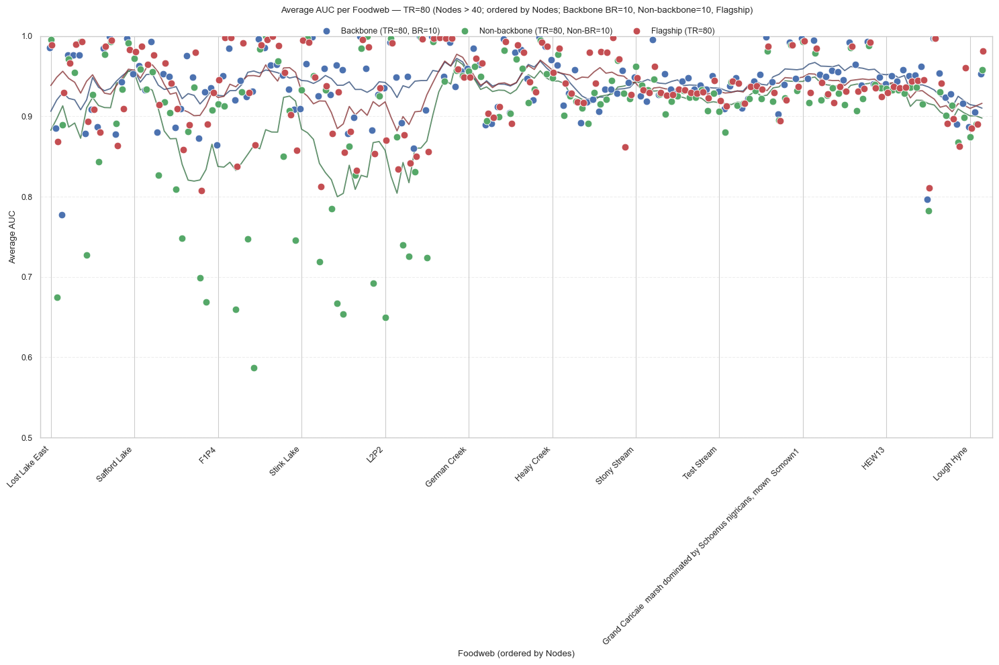

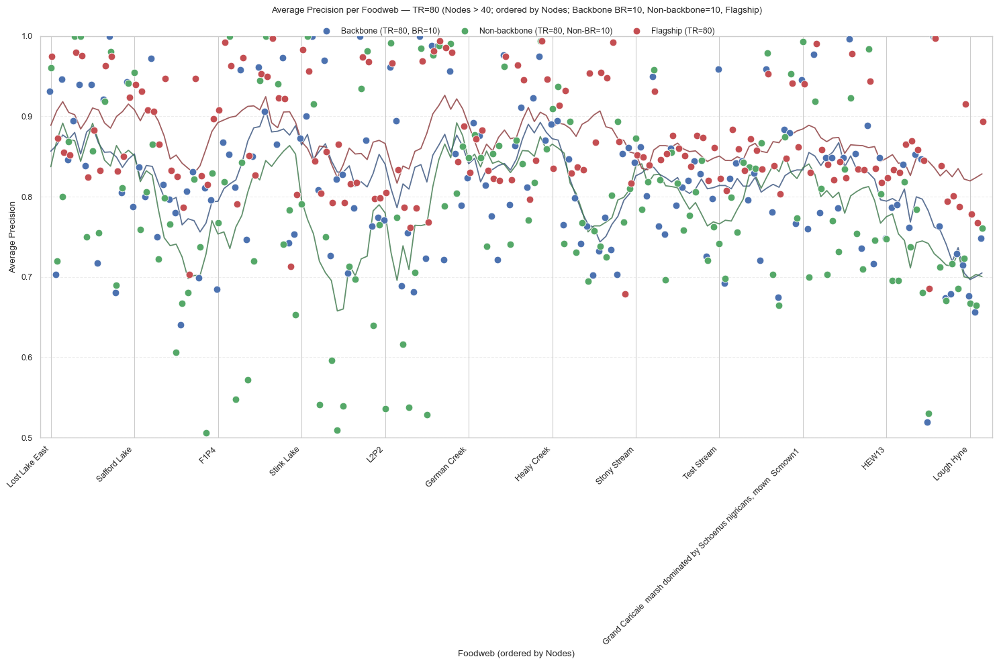

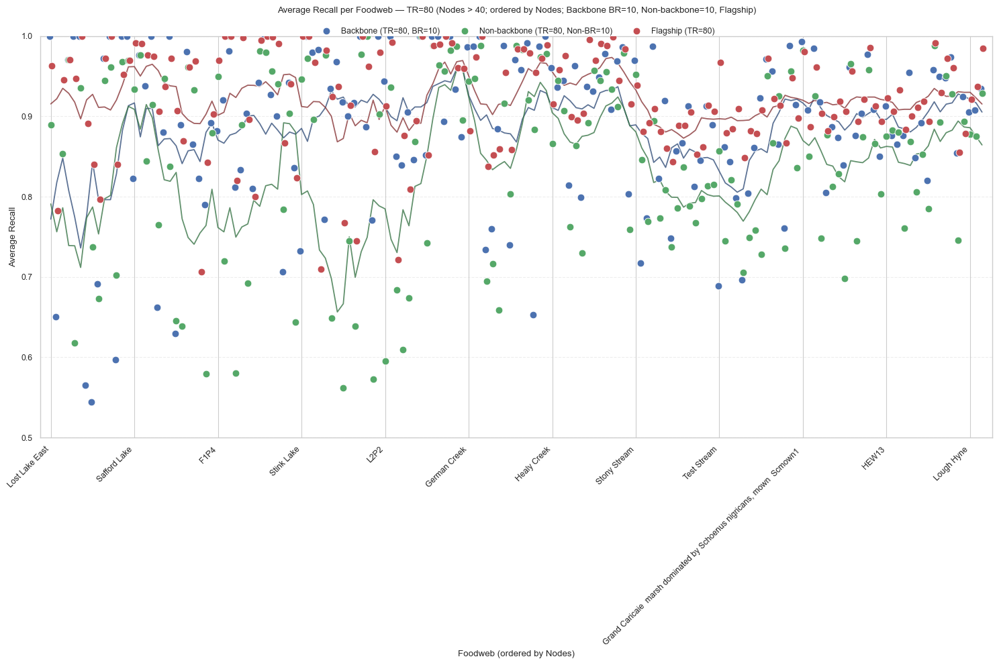

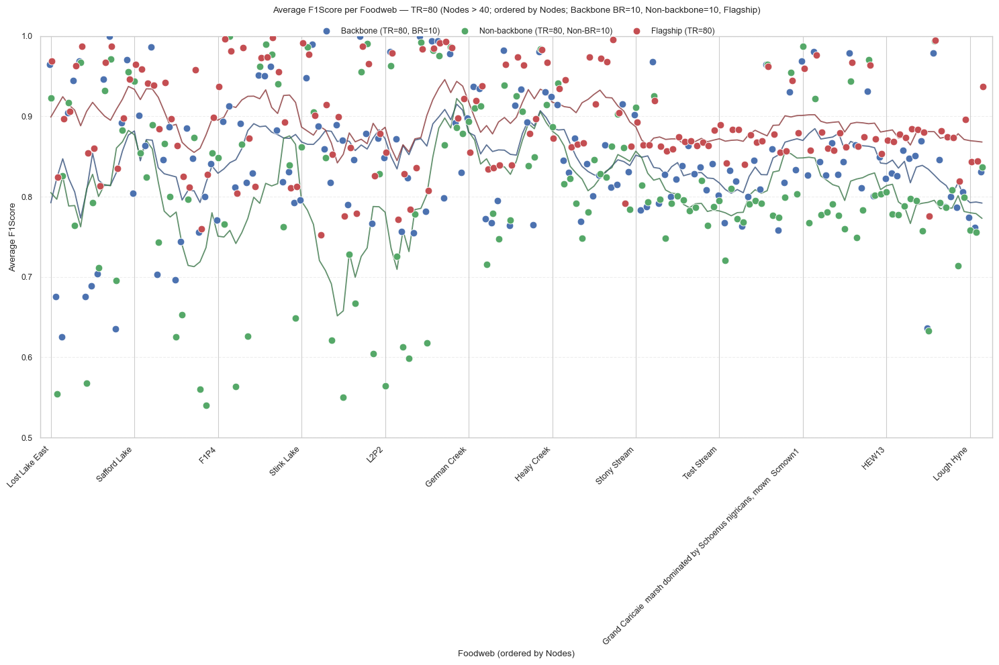

In [1]:
# %% AUC/Precision/Recall/F1Score average by foodweb (overlay three sources) — TR=80
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors  # ← for darkening colors

# Backbone vs Non-backbone vs Flagship
RESULTS_DIR_BACKBONE = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_backboneRatio_10-70/"
    "prediction_scores_logs"
)
RESULTS_DIR_NONBACKBONE = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_non-backboneRatio_10-70/"
    "prediction_scores_logs"
)
RESULTS_DIR_FLAGSHIP = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs"
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]

TRAIN_RATIO_TARGET = 80
BACKBONE_RATIO_TARGET = 10      # for BACKBONE series
NONBACKBONE_RATIO_TARGET = 10   # for NON-BACKBONE series
NODES_THRESHOLD = 40            # <-- filter foodwebs with Nodes > 40

sns.set_theme(style="whitegrid", context="paper")

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    n = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        n = n.replace(token, "_")
    n = "_".join([p for p in n.split("_") if p])
    return n.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

# === Precompute which foodwebs have Nodes > 40 ===
meta_all = pd.read_csv(ECOSYSTEM_META_CSV)
meta_all.columns = [c.strip() for c in meta_all.columns]

fw_col_nodes = pick_col(meta_all.columns, ["Foodweb","FoodWeb","foodweb","Network"])
nodes_col    = pick_col(meta_all.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

meta_all["Foodweb_key"] = meta_all[fw_col_nodes].astype(str).map(sanitize_fw)
allowed_fw_keys = set(
    meta_all.loc[meta_all[nodes_col] > NODES_THRESHOLD, "Foodweb_key"].unique()
)
print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

def load_metric_means(results_dir, tr_target, ratio_target=None):
    files = []
    for pat in GLOB_PATTERNS:
        files.extend(glob.glob(os.path.join(results_dir, pat)))
    files = sorted(set(files))

    rows = []
    for path in files:
        # --- filter by Nodes > threshold via metadata ---
        fw_raw = derive_foodweb_from_filename(path)
        fw_key = sanitize_fw(fw_raw)
        if fw_key not in allowed_fw_keys:
            continue

        try:
            df = pd.read_csv(path)
        except Exception:
            continue

        # Metric
        try:
            metric_col = pick_col(df.columns, [METRIC])
        except KeyError:
            continue

        # Ratio column: try NonBackbone first, then Backbone as fallback (for compatibility)
        ratio_col = next(
            (
                c for c in [
                    "NonBackboneRatio", "NonBackbone_Ratio", "NONBACKBONERATIO",
                    "BackboneRatio", "Backbone_Ratio", "Backbone", "b_ratio"
                ]
                if c in df.columns
            ),
            None
        )
        tr  = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in df.columns), None)
        if tr is None:
            continue

        df[metric_col] = pd.to_numeric(df[metric_col], errors="coerce")
        df[tr]  = pd.to_numeric(df[tr], errors="coerce")
        if ratio_col is not None:
            df[ratio_col] = pd.to_numeric(df[ratio_col], errors="coerce")

        df["_TR"] = (
            (df[tr]*100).round().astype(int)
            if df[tr].dropna().between(0,1).all()
            else df[tr].round().astype(int)
        )

        if ratio_target is not None:
            if ratio_col is None:
                continue
            df["_RATIO"] = (
                (df[ratio_col]*100).round().astype(int)
                if df[ratio_col].dropna().between(0,1).all()
                else df[ratio_col].round().astype(int)
            )
            dff = df[(df["_TR"] == tr_target) & (df["_RATIO"] == ratio_target)].copy()
        else:
            dff = df[(df["_TR"] == tr_target)].copy()

        if dff.empty:
            continue

        rows.append({
            "Foodweb": derive_foodweb_from_filename(path),
            f"{METRIC}_mean": dff[metric_col].mean(skipna=True)
        })

    return pd.DataFrame(rows)

def darken(color, amount=0.7):
    r, g, b = mcolors.to_rgb(color)
    return tuple((amount*np.array([r, g, b])).clip(0, 1))

# === Loop over all metrics with identical plotting logic ===
for METRIC in ["AUC", "Precision", "Recall", "F1Score"]:
    # Load three series for this METRIC (already filtered by Nodes > 40)
    df_backbone = load_metric_means(
        RESULTS_DIR_BACKBONE,
        TRAIN_RATIO_TARGET,
        BACKBONE_RATIO_TARGET
    )
    df_nonbackbone = load_metric_means(
        RESULTS_DIR_NONBACKBONE,
        TRAIN_RATIO_TARGET,
        NONBACKBONE_RATIO_TARGET
    )
    df_flagship = load_metric_means(
        RESULTS_DIR_FLAGSHIP,
        TRAIN_RATIO_TARGET,
        ratio_target=None
    )

    if df_backbone.empty and df_nonbackbone.empty and df_flagship.empty:
        print(f"[Info] No matching rows for metric {METRIC}. Skipping.")
        continue

    # Merge, keep all foodwebs from all three
    merged = pd.merge(
        df_backbone.rename(columns={f"{METRIC}_mean": f"{METRIC}_backbone"}),
        df_nonbackbone.rename(columns={f"{METRIC}_mean": f"{METRIC}_nonbackbone"}),
        on="Foodweb",
        how="outer"
    )
    merged = pd.merge(
        merged,
        df_flagship.rename(columns={f"{METRIC}_mean": f"{METRIC}_flagship"}),
        on="Foodweb",
        how="outer"
    )

    # Load metadata and sort by Nodes (ascending)
    meta = pd.read_csv(ECOSYSTEM_META_CSV)
    fw_col    = pick_col(meta.columns, ["Foodweb","FoodWeb","foodweb","Network"])
    nodes_col = pick_col(meta.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

    meta2 = meta[[fw_col, nodes_col]].rename(
        columns={fw_col: "Foodweb_meta", nodes_col: "Nodes"}
    ).copy()
    meta2["Foodweb_key"] = meta2["Foodweb_meta"].astype(str).map(sanitize_fw)

    merged["Foodweb_key"] = merged["Foodweb"].astype(str).map(sanitize_fw)
    merged = merged.merge(meta2[["Foodweb_key", "Nodes"]], on="Foodweb_key", how="left")
    merged["Nodes_num"] = pd.to_numeric(merged["Nodes"], errors="coerce")

    # Optional extra safety: ensure we only keep Nodes > threshold
    merged = merged[merged["Nodes_num"] > NODES_THRESHOLD]

    if merged.empty:
        print(f"[Info] After Nodes > {NODES_THRESHOLD} filter, nothing left for {METRIC}. Skipping.")
        continue

    if merged["Nodes_num"].notna().any():
        merged = merged.sort_values("Nodes_num", ascending=True).reset_index(drop=True)
    else:
        # Fallback sort: Flagship > Backbone > Non-backbone
        sort_val = (
            merged.get(f"{METRIC}_flagship", pd.Series(index=merged.index))
                  .fillna(merged.get(f"{METRIC}_backbone", pd.Series(index=merged.index)))
                  .fillna(merged.get(f"{METRIC}_nonbackbone", pd.Series(index=merged.index)))
        )
        merged = (
            merged.assign(_sort=sort_val)
                  .sort_values("_sort", ascending=True)
                  .drop(columns=["_sort"])
                  .reset_index(drop=True)
        )

    # Plotting positions and thinned labels
    x = np.arange(len(merged))
    labels = merged["Foodweb"].tolist()
    step = max(1, int(np.ceil(len(labels) / 12)))
    tick_idx = list(range(0, len(labels), step))

    plt.figure(figsize=(15, 10))
    ax = plt.gca()

    # Scatter series (points): backbone, non-backbone, flagship
    ax.scatter(
        x - 0.2, merged.get(f"{METRIC}_backbone"), s=60,
        label=f"Backbone (TR=80, BR={BACKBONE_RATIO_TARGET})",
        color="C0", edgecolors="white", linewidths=0.6, zorder=3
    )
    ax.scatter(
        x, merged.get(f"{METRIC}_nonbackbone"), s=60,
        label=f"Non-backbone (TR=80, Non-BR={NONBACKBONE_RATIO_TARGET})",
        color="C2", edgecolors="white", linewidths=0.6, zorder=3
    )
    ax.scatter(
        x + 0.2, merged.get(f"{METRIC}_flagship"), s=60,
        label="Flagship (TR=80)",
        color="C3", edgecolors="white", linewidths=0.6, zorder=3
    )

    # Trend lines (slightly darker than points)
    window = max(5, int(np.ceil(len(merged) * 0.05)))
    trend_backbone   = darken("C0", amount=0.7)
    trend_nonbb      = darken("C2", amount=0.7)
    trend_flagship   = darken("C3", amount=0.7)

    # Backbone smooth
    y_bk = merged.get(f"{METRIC}_backbone").to_numpy(dtype=float)
    mask_bk = ~np.isnan(y_bk)
    if mask_bk.any():
        ybk_smooth = (
            pd.Series(y_bk[mask_bk])
              .rolling(window=window, center=True, min_periods=1)
              .mean()
              .to_numpy()
        )
        ax.plot(x[mask_bk], ybk_smooth, color=trend_backbone, alpha=0.8, linewidth=1.3, zorder=2)

    # Non-backbone smooth
    y_nb = merged.get(f"{METRIC}_nonbackbone").to_numpy(dtype=float)
    mask_nb = ~np.isnan(y_nb)
    if mask_nb.any():
        ynb_smooth = (
            pd.Series(y_nb[mask_nb])
              .rolling(window=window, center=True, min_periods=1)
              .mean()
              .to_numpy()
        )
        ax.plot(x[mask_nb], ynb_smooth, color=trend_nonbb, alpha=0.8, linewidth=1.3, zorder=2)

    # Flagship smooth
    y_f = merged.get(f"{METRIC}_flagship").to_numpy(dtype=float)
    mask_f = ~np.isnan(y_f)
    if mask_f.any():
        yf_smooth = (
            pd.Series(y_f[mask_f])
              .rolling(window=window, center=True, min_periods=1)
              .mean()
              .to_numpy()
        )
        ax.plot(x[mask_f], yf_smooth, color=trend_flagship, alpha=0.8, linewidth=1.3, zorder=2)

    # Axes & grid
    ax.set_xticks(tick_idx)
    ax.set_xticklabels([labels[i] for i in tick_idx], rotation=45, ha="right")
    ax.set_ylim(0.5, 1.0)  # keep same scale
    ax.set_xlabel("Foodweb (ordered by Nodes)")
    ax.set_ylabel(f"Average {METRIC}")
    ax.set_title(
        f"Average {METRIC} per Foodweb — TR=80 (Nodes > {NODES_THRESHOLD}; ordered by Nodes; "
        f"Backbone BR={BACKBONE_RATIO_TARGET}, Non-backbone={NONBACKBONE_RATIO_TARGET}, Flagship)",
        pad=25
    )
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)
    ax.margins(x=0.01)

    # Legend centered above (3 columns)
    ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.04), ncol=3, frameon=False)

    plt.tight_layout()
    plt.show()


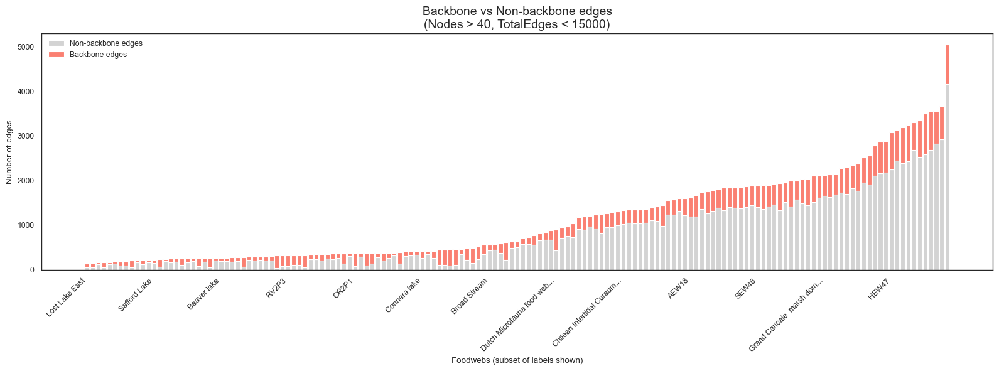

In [4]:
# %% Stacked barplot: Backbone vs Non-backbone edges for ALL foodwebs
#     Filter: NumNodes > NODES_MIN_THRESHOLD  AND  TotalEdges < EDGES_MAX_THRESHOLD

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# === Load your CSV ===
csv_path = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/backbone_stats/backbone_overview_per_foodweb.csv"
df = pd.read_csv(csv_path)

# === Parameters ===
NODES_MIN_THRESHOLD = 40
EDGES_MAX_THRESHOLD = 15000   # adjust as needed
MAX_LEN = 25  # for axis label trimming

# === Trim long labels ===
def trim_label(label, max_len=MAX_LEN):
    label = str(label)
    return (label[:max_len] + "...") if len(label) > max_len else label

df = df.copy()

# Label-only version of the name: remove "_tax_mass" suffix and trim spaces
df["FoodwebLabel"] = (
    df["Foodweb"]
    .astype(str)
    .str.replace("_tax_mass", "", regex=False)
    .str.strip()
)

df["FoodwebShort"] = df["FoodwebLabel"].apply(trim_label)

# === Prepare backbone vs non-backbone edges ===
df["TotalEdges"] = pd.to_numeric(df["TotalEdges"], errors="coerce")
df["BackboneEdges"] = pd.to_numeric(df["BackboneEdges"], errors="coerce")
df["NumNodes"] = pd.to_numeric(df["NumNodes"], errors="coerce")

df = df.dropna(subset=["TotalEdges", "BackboneEdges", "NumNodes"]).copy()
df["NonBackboneEdges"] = (df["TotalEdges"] - df["BackboneEdges"]).clip(lower=0)

# === Filter: Only foodwebs with NumNodes > threshold AND TotalEdges < max ===
df = df[
    (df["NumNodes"] > NODES_MIN_THRESHOLD) &
    (df["TotalEdges"] < EDGES_MAX_THRESHOLD)
].copy()

if df.empty:
    raise ValueError(
        f"No foodwebs remain after filtering: "
        f"NumNodes > {NODES_MIN_THRESHOLD} AND TotalEdges < {EDGES_MAX_THRESHOLD}."
    )

# === Sort by TotalEdges ascending ===
df = df.sort_values("TotalEdges", ascending=True).reset_index(drop=True)

# === X positions ===
x = np.arange(len(df))
labels = df["FoodwebShort"].tolist()

sns.set_theme(context="paper", style="white")

plt.figure(figsize=(16, 6))

# === Stacked bars ===
plt.bar(
    x,
    df["NonBackboneEdges"],
    color="lightgray",
    label="Non-backbone edges",
)

plt.bar(
    x,
    df["BackboneEdges"],
    bottom=df["NonBackboneEdges"],
    color="salmon",
    label="Backbone edges",
)

plt.ylabel("Number of edges")
plt.xlabel("Foodwebs (subset of labels shown)")

plt.title(
    f"Backbone vs Non-backbone edges\n"
    f"(Nodes > {NODES_MIN_THRESHOLD}, TotalEdges < {EDGES_MAX_THRESHOLD})",
    fontsize=14
)

# === Only show some x-ticks to reduce clutter ===
n_labels = len(labels)
step = max(1, n_labels // 12)
tick_idx = list(range(0, n_labels, step))

plt.xticks(tick_idx, [labels[i] for i in tick_idx], rotation=45, ha="right")

plt.legend(frameon=False)
plt.tight_layout()
plt.show()

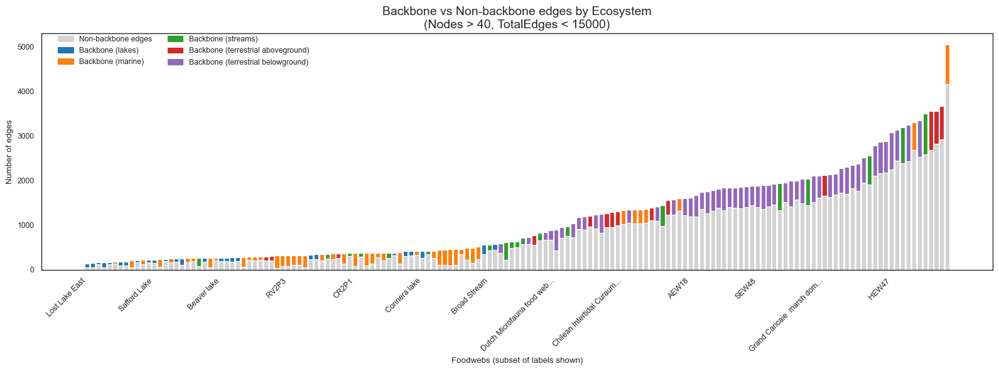

In [3]:
# %% Stacked barplot: Backbone vs Non-backbone edges (colored by EcosystemType)
#     Filter: NumNodes > NODES_MIN_THRESHOLD  AND  TotalEdges < EDGES_MAX_THRESHOLD

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# === Paths ===
OVERVIEW_CSV = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/backbone_stats/backbone_overview_per_foodweb.csv"
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === Parameters ===
NODES_MIN_THRESHOLD = 40
EDGES_MAX_THRESHOLD = 15000   # adjust as needed
MAX_LEN = 25  # for axis label trimming

# === Helpers ===
def trim_label(label, max_len=MAX_LEN):
    label = str(label)
    return (label[:max_len] + "...") if len(label) > max_len else label

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

# === Load backbone overview ===
df = pd.read_csv(OVERVIEW_CSV)

df = df.copy()

# Label-only version of the name: remove "_tax_mass" suffix and trim spaces
df["FoodwebLabel"] = (
    df["Foodweb"]
    .astype(str)
    .str.replace("_tax_mass", "", regex=False)
    .str.strip()
)

# Shortened label for x-axis
df["FoodwebShort"] = df["FoodwebLabel"].apply(trim_label)

df["TotalEdges"] = pd.to_numeric(df["TotalEdges"], errors="coerce")
df["BackboneEdges"] = pd.to_numeric(df["BackboneEdges"], errors="coerce")
df["NumNodes"] = pd.to_numeric(df["NumNodes"], errors="coerce")

df = df.dropna(subset=["TotalEdges", "BackboneEdges", "NumNodes"]).copy()
df["NonBackboneEdges"] = (df["TotalEdges"] - df["BackboneEdges"]).clip(lower=0)

# === Load ecosystem metadata and attach EcosystemType ===
meta = pd.read_csv(ECOSYSTEM_META_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_meta   = pick_col(meta.columns, ["Foodweb","FoodWeb","foodweb","Network"])
eco_col_meta  = pick_col(meta.columns, ["EcosystemType","Ecosystem","ecosystem_type","Habitat"])

meta2 = meta[[fw_col_meta, eco_col_meta]].rename(
    columns={fw_col_meta: "Foodweb", eco_col_meta: "EcosystemType"}
).copy()

df = df.merge(meta2, on="Foodweb", how="left")
df["EcosystemType"] = df["EcosystemType"].fillna("Unknown")

# === Filter: Only foodwebs with NumNodes > threshold AND TotalEdges < max ===
df = df[
    (df["NumNodes"] > NODES_MIN_THRESHOLD) &
    (df["TotalEdges"] < EDGES_MAX_THRESHOLD)
].copy()

if df.empty:
    raise ValueError(
        f"No foodwebs remain after filtering: "
        f"NumNodes > {NODES_MIN_THRESHOLD} AND TotalEdges < {EDGES_MAX_THRESHOLD}."
    )

# === Sort by TotalEdges ascending ===
df = df.sort_values("TotalEdges", ascending=True).reset_index(drop=True)

# === Ecosystem → color mapping (for backbone segment) ===
ecosystems = df["EcosystemType"].unique().tolist()
palette = sns.color_palette("tab10", n_colors=len(ecosystems))
eco_to_color = {eco: palette[i % len(palette)] for i, eco in enumerate(ecosystems)}
backbone_colors = df["EcosystemType"].map(eco_to_color).tolist()

# === X positions ===
x = np.arange(len(df))
labels = df["FoodwebShort"].tolist()

sns.set_theme(context="paper", style="white")

plt.figure(figsize=(16, 6))

# === Stacked bars ===
# Bottom segment: Non-backbone (neutral gray)
plt.bar(
    x,
    df["NonBackboneEdges"],
    color="lightgray",
    label="Non-backbone edges",
)

# Top segment: Backbone, colored by ecosystem
plt.bar(
    x,
    df["BackboneEdges"],
    bottom=df["NonBackboneEdges"],
    color=backbone_colors,
    label="Backbone edges (by ecosystem)",
)

plt.ylabel("Number of edges")
plt.xlabel("Foodwebs (subset of labels shown)")

plt.title(
    f"Backbone vs Non-backbone edges by Ecosystem\n"
    f"(Nodes > {NODES_MIN_THRESHOLD}, TotalEdges < {EDGES_MAX_THRESHOLD})",
    fontsize=14
)

# === Only show some x-ticks to reduce clutter ===
n_labels = len(labels)
step = max(1, n_labels // 12)
tick_idx = list(range(0, n_labels, step))

plt.xticks(tick_idx, [labels[i] for i in tick_idx], rotation=45, ha="right")

# === Legend: one entry for non-backbone, plus one per ecosystem (backbone) ===
handles = [Patch(color="lightgray", label="Non-backbone edges")]
for eco in ecosystems:
    handles.append(Patch(color=eco_to_color[eco], label=f"Backbone ({eco})"))

plt.legend(handles=handles, frameon=False, ncol=2, loc="upper left", bbox_to_anchor=(0.01, 1.02))

plt.tight_layout()
plt.show()

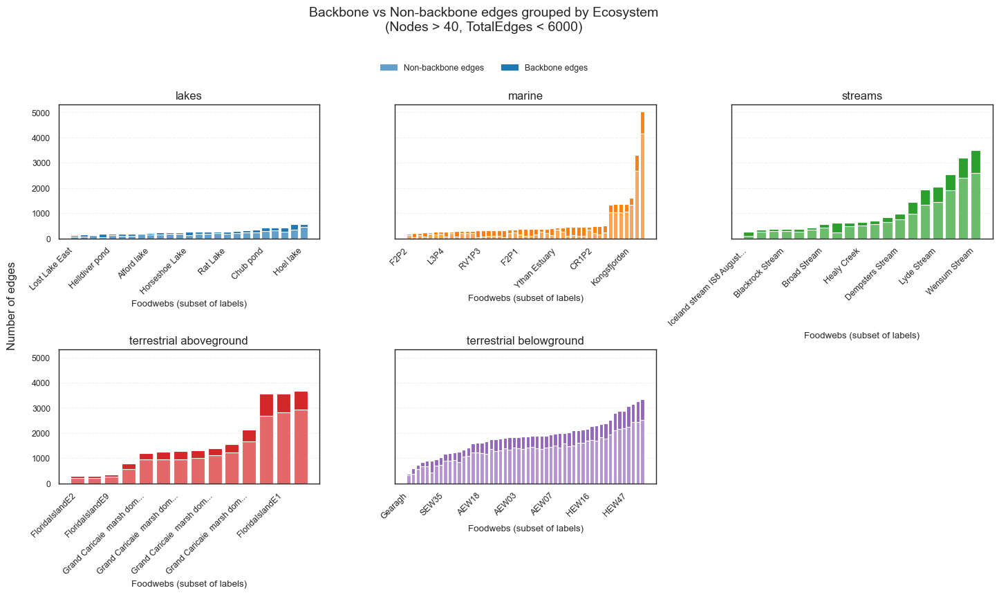

In [9]:
# %% Stacked barplot: Backbone vs Non-backbone edges grouped by EcosystemType

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math

# === Paths ===
OVERVIEW_CSV = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/backbone_stats/backbone_overview_per_foodweb.csv"
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === Parameters ===
NODES_MIN_THRESHOLD = 40
EDGES_MAX_THRESHOLD = 6000   # adjust as needed
MAX_LEN = 25  # for axis label trimming

# === Helpers ===
def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

def trim_label(label, max_len=MAX_LEN):
    label = str(label)
    return (label[:max_len] + "...") if len(label) > max_len else label

def lighten(color, factor=0.5):
    """
    Lighten an RGB color by blending it with white.
    factor in [0,1]: 0 = original color, 1 = white.
    """
    r, g, b = color
    return (
        1 - factor * (1 - r),
        1 - factor * (1 - g),
        1 - factor * (1 - b),
    )

# === Load backbone overview ===
df = pd.read_csv(OVERVIEW_CSV).copy()

# Remove "_tax_mass" suffix for label purposes only
df["FoodwebLabel"] = (
    df["Foodweb"]
    .astype(str)
    .str.replace("_tax_mass", "", regex=False)
    .str.strip()
)

# Shortened label for x-axis
df["FoodwebShort"] = df["FoodwebLabel"].apply(trim_label)

df["TotalEdges"] = pd.to_numeric(df["TotalEdges"], errors="coerce")
df["BackboneEdges"] = pd.to_numeric(df["BackboneEdges"], errors="coerce")
df["NumNodes"] = pd.to_numeric(df["NumNodes"], errors="coerce")

df = df.dropna(subset=["TotalEdges", "BackboneEdges", "NumNodes"]).copy()
df["NonBackboneEdges"] = (df["TotalEdges"] - df["BackboneEdges"]).clip(lower=0)

# === Load ecosystem metadata and attach EcosystemType ===
meta = pd.read_csv(ECOSYSTEM_META_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_meta   = pick_col(meta.columns, ["Foodweb","FoodWeb","foodweb","Network"])
eco_col_meta  = pick_col(meta.columns, ["EcosystemType","Ecosystem","ecosystem_type","Habitat"])

meta2 = meta[[fw_col_meta, eco_col_meta]].rename(
    columns={fw_col_meta: "Foodweb", eco_col_meta: "EcosystemType"}
).copy()

df = df.merge(meta2, on="Foodweb", how="left")
df["EcosystemType"] = df["EcosystemType"].fillna("Unknown")

# === Filter: NumNodes > threshold AND TotalEdges < max ===
df = df[
    (df["NumNodes"] > NODES_MIN_THRESHOLD) &
    (df["TotalEdges"] < EDGES_MAX_THRESHOLD)
].copy()

if df.empty:
    raise ValueError(
        f"No foodwebs remain after filtering: "
        f"NumNodes > {NODES_MIN_THRESHOLD} AND TotalEdges < {EDGES_MAX_THRESHOLD}."
    )

# Sort within each ecosystem by TotalEdges ascending
df = df.sort_values(["EcosystemType", "TotalEdges"], ascending=[True, True])

# === Prepare ecosystems and layout ===
ecosystems = df["EcosystemType"].unique().tolist()
n_ecos = len(ecosystems)

n_cols = min(3, n_ecos)
n_rows = int(math.ceil(n_ecos / n_cols))

sns.set_theme(context="paper", style="white")
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4.5 * n_rows), sharey=True)

# Make axes iterable in all cases
if n_rows == 1 and n_cols == 1:
    axes = np.array([[axes]])
elif n_rows == 1:
    axes = np.array([axes])
elif n_cols == 1:
    axes = np.array([[ax] for ax in axes])

# === Color palette per ecosystem ===
palette = sns.color_palette("tab10", n_colors=n_ecos)
eco_to_color = {eco: palette[i % len(palette)] for i, eco in enumerate(ecosystems)}

# === Plot per ecosystem ===
for ax, eco in zip(axes.flat, ecosystems):
    sub = df[df["EcosystemType"] == eco].copy()
    if sub.empty:
        ax.set_visible(False)
        continue

    x = np.arange(len(sub))
    labels = sub["FoodwebShort"].tolist()

    base_color = eco_to_color[eco]
    non_bb_color = lighten(base_color, factor=0.7)  # lighter shade
    bb_color = base_color                            # full color for backbone

    # Stacked bars
    ax.bar(
        x,
        sub["NonBackboneEdges"],
        color=non_bb_color,
        label="Non-backbone edges",
    )
    ax.bar(
        x,
        sub["BackboneEdges"],
        bottom=sub["NonBackboneEdges"],
        color=bb_color,
        label="Backbone edges",
    )

    ax.set_title(eco, fontsize=12)
    ax.set_xlabel("Foodwebs (subset of labels)")

    # Thin x-labels to avoid clutter
    n_labels = len(labels)
    step = max(1, n_labels // 6)  # fewer labels per panel
    tick_idx = list(range(0, n_labels, step))
    ax.set_xticks(tick_idx)
    ax.set_xticklabels([labels[i] for i in tick_idx], rotation=45, ha="right")

    ax.grid(axis="y", linestyle="--", alpha=0.3)

# Hide any unused subplots
for ax in axes.flat[len(ecosystems):]:
    ax.set_visible(False)

# Shared y-label and global title
fig.text(0.04, 0.5, "Number of edges", va="center", rotation="vertical", fontsize=12)
fig.suptitle(
    f"Backbone vs Non-backbone edges grouped by Ecosystem\n"
    f"(Nodes > {NODES_MIN_THRESHOLD}, TotalEdges < {EDGES_MAX_THRESHOLD})",
    y=0.98,
    fontsize=14,
)

# Shared legend (use colors from the first ecosystem as representative)
first_eco = ecosystems[0]
first_base = eco_to_color[first_eco]
first_non_bb = lighten(first_base, factor=0.7)
handles = [
    plt.Rectangle((0, 0), 1, 1, color=first_non_bb, label="Non-backbone edges"),
    plt.Rectangle((0, 0), 1, 1, color=first_base,   label="Backbone edges"),
]
fig.legend(handles, [h.get_label() for h in handles], loc="upper center", ncol=2, frameon=False, bbox_to_anchor=(0.5, 0.9))

plt.tight_layout(rect=[0.05, 0.03, 1, 0.92])
plt.show()

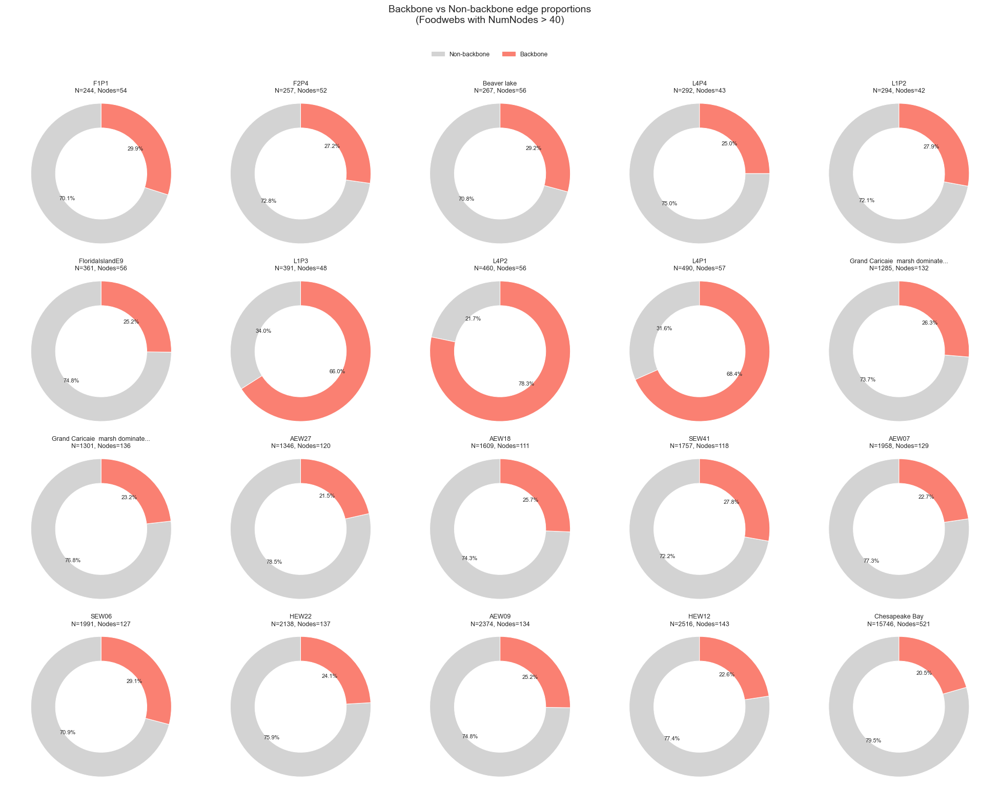

In [4]:
# %% Pie / Donut charts – backbone vs non-backbone per food web

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# === Paths ===
OVERVIEW_CSV = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_backboneRatio_10-70/"
    "backbone_stats/backbone_overview_per_foodweb.csv"
)

# === Parameters ===
NODES_MIN_THRESHOLD = 40
MAX_LABEL_LEN = 30  # for trimming labels on plots

# Consistent colors (same for all pies/donuts)
NON_BACKBONE_COLOR = "lightgray"
BACKBONE_COLOR = "salmon"

sns.set_theme(context="paper", style="white")


# ----------------------------------------------------------------------
# Helpers
# ----------------------------------------------------------------------
def _trim_label(label: str, max_len: int = MAX_LABEL_LEN) -> str:
    label = str(label)
    return (label[:max_len] + "...") if len(label) > max_len else label


def load_backbone_overview(
    csv_path: str = OVERVIEW_CSV,
    nodes_min_threshold: int = NODES_MIN_THRESHOLD,
) -> pd.DataFrame:
    """
    Load backbone overview CSV, compute NonBackboneEdges,
    remove '_tax_mass' suffix in labels, and apply node-count filter.
    """
    df = pd.read_csv(csv_path).copy()

    # Safer numeric conversion
    df["TotalEdges"] = pd.to_numeric(df["TotalEdges"], errors="coerce")
    df["BackboneEdges"] = pd.to_numeric(df["BackboneEdges"], errors="coerce")
    df["NumNodes"] = pd.to_numeric(df["NumNodes"], errors="coerce")

    df = df.dropna(subset=["TotalEdges", "BackboneEdges", "NumNodes"]).copy()
    df["NonBackboneEdges"] = (df["TotalEdges"] - df["BackboneEdges"]).clip(lower=0)

    # Clean Foodweb label for plotting (remove suffix only for display)
    df["FoodwebLabel"] = (
        df["Foodweb"]
        .astype(str)
        .str.replace("_tax_mass", "", regex=False)
        .str.strip()
    )
    df["FoodwebShort"] = df["FoodwebLabel"].apply(_trim_label)

    # Apply node-count filter
    df = df[df["NumNodes"] > nodes_min_threshold].copy()
    df = df.sort_values("TotalEdges", ascending=True).reset_index(drop=True)

    if df.empty:
        raise ValueError(
            f"No foodwebs remain after filtering NumNodes > {nodes_min_threshold}."
        )

    return df

def plot_backbone_donut_grid(
    df: pd.DataFrame,
    foodweb_names: list[str] | None = None,
    n_max: int = 9,
    n_cols: int = 3,
    random_state: int = 42,
    figsize_per_panel=(4.0, 4.0),
):
    """
    Grid of donut charts for multiple foodwebs.

    Parameters
    ----------
    df : DataFrame
        Output of load_backbone_overview().
    foodweb_names : list of str or None
        If provided, use these specific foodwebs (match against FoodwebLabel).
        If None, sample up to n_max foodwebs from df.
    n_max : int
        Maximum number of foodwebs to display if foodweb_names is None.
    n_cols : int
        Number of columns in the subplot grid.
    random_state : int
        Random seed used when sampling foodwebs.
    figsize_per_panel : tuple
        Size of each subplot (width, height). Total figure size is scaled by grid.
    """
    if foodweb_names is not None and len(foodweb_names) == 0:
        raise ValueError("foodweb_names is an empty list.")

    df_sel = df.copy()

    if foodweb_names is not None:
        mask = df_sel["FoodwebLabel"].isin(foodweb_names)
        df_sel = df_sel[mask].copy()
    else:
        n = min(n_max, len(df_sel))
        df_sel = df_sel.sample(n=n, random_state=random_state).copy()

    if df_sel.empty:
        raise ValueError("No foodwebs selected for the grid plot.")

    df_sel = df_sel.sort_values("TotalEdges", ascending=True).reset_index(drop=True)

    n_fw = len(df_sel)
    n_cols = max(1, n_cols)
    n_rows = int(np.ceil(n_fw / n_cols))

    fig_width = figsize_per_panel[0] * n_cols
    fig_height = figsize_per_panel[1] * n_rows

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    elif n_rows == 1:
        axes = np.array([axes])
    elif n_cols == 1:
        axes = np.array([[ax] for ax in axes])

    axes_flat = axes.flatten()

    for ax, (_, row) in zip(axes_flat, df_sel.iterrows()):
        total = float(row["TotalEdges"])
        bb = float(row["BackboneEdges"])
        nbb = max(0.0, total - bb)

        values = [nbb, bb]
        labels = ["Non-backbone", "Backbone"]
        colors = [NON_BACKBONE_COLOR, BACKBONE_COLOR]

        wedges, texts, autotexts = ax.pie(
            values,
            labels=None,  # avoid clutter; legend handled globally
            colors=colors,
            autopct="%1.1f%%",
            startangle=90,
            wedgeprops=dict(width=0.35, edgecolor="white"),
            textprops={"fontsize": 8},
        )
        ax.set_title(
            f"{row['FoodwebShort']}\n"
            f"N={int(total)}, Nodes={int(row['NumNodes'])}",
            fontsize=9,
        )
        ax.axis("equal")

    # Hide any unused axes
    for ax in axes_flat[len(df_sel) :]:
        ax.set_visible(False)

    # Global title
    fig.suptitle(
        f"Backbone vs Non-backbone edge proportions\n"
        f"(Foodwebs with NumNodes > {NODES_MIN_THRESHOLD})",
        fontsize=14,
        y=0.98,
    )

    # Shared legend
    handles = [
        plt.Rectangle((0, 0), 1, 1, color=NON_BACKBONE_COLOR, label="Non-backbone"),
        plt.Rectangle((0, 0), 1, 1, color=BACKBONE_COLOR, label="Backbone"),
    ]
    fig.legend(
        handles,
        [h.get_label() for h in handles],
        loc="upper center",
        ncol=2,
        frameon=False,
        bbox_to_anchor=(0.5, 0.93)
    )

    plt.tight_layout(rect=[0.02, 0.02, 1, 0.93])
    plt.show()

if __name__ == "__main__":
    df_overview = load_backbone_overview()

    # Mode 2: grid of 9 random foodwebs
    plot_backbone_donut_grid(
        df_overview,
        foodweb_names=None,  # or pass a list of clean FoodwebLabel values
        n_max=20,
        n_cols=5,
        random_state=42,
    )

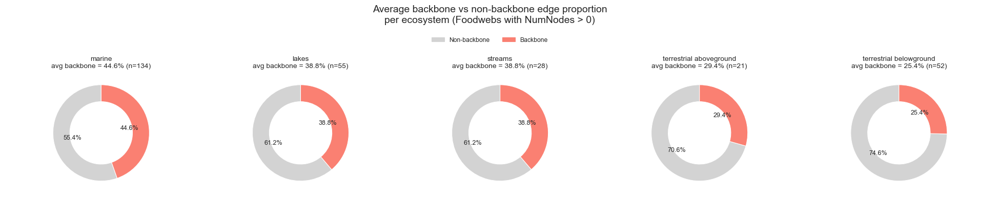

In [1]:
# %% Pie / Donut charts – backbone vs non-backbone per food web

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# === Paths ===
OVERVIEW_CSV = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_backboneRatio_10-70/"
    "backbone_stats/backbone_overview_per_foodweb.csv"
)
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === Parameters ===
NODES_MIN_THRESHOLD = 0
MAX_LABEL_LEN = 30  # for trimming labels on plots

# Consistent colors (same for all pies/donuts)
NON_BACKBONE_COLOR = "lightgray"
BACKBONE_COLOR = "salmon"

sns.set_theme(context="paper", style="white")


# ----------------------------------------------------------------------
# Helpers
# ----------------------------------------------------------------------
def _trim_label(label: str, max_len: int = MAX_LABEL_LEN) -> str:
    label = str(label)
    return (label[:max_len] + "...") if len(label) > max_len else label


def _pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")


def load_backbone_overview(
    csv_path: str = OVERVIEW_CSV,
    nodes_min_threshold: int = NODES_MIN_THRESHOLD,
) -> pd.DataFrame:
    """
    Load backbone overview CSV, compute NonBackboneEdges,
    remove '_tax_mass' suffix in labels, and apply node-count filter.
    """
    df = pd.read_csv(csv_path).copy()

    # Safer numeric conversion
    df["TotalEdges"] = pd.to_numeric(df["TotalEdges"], errors="coerce")
    df["BackboneEdges"] = pd.to_numeric(df["BackboneEdges"], errors="coerce")
    df["NumNodes"] = pd.to_numeric(df["NumNodes"], errors="coerce")

    df = df.dropna(subset=["TotalEdges", "BackboneEdges", "NumNodes"]).copy()
    df["NonBackboneEdges"] = (df["TotalEdges"] - df["BackboneEdges"]).clip(lower=0)

    # Clean Foodweb label for plotting (remove suffix only for display)
    df["FoodwebLabel"] = (
        df["Foodweb"]
        .astype(str)
        .str.replace("_tax_mass", "", regex=False)
        .str.strip()
    )
    df["FoodwebShort"] = df["FoodwebLabel"].apply(_trim_label)

    # Apply node-count filter
    df = df[df["NumNodes"] > nodes_min_threshold].copy()
    df = df.sort_values("TotalEdges", ascending=True).reset_index(drop=True)

    if df.empty:
        raise ValueError(
            f"No foodwebs remain after filtering NumNodes > {nodes_min_threshold}."
        )

    return df


def plot_avg_backbone_donut_by_ecosystem(
    df: pd.DataFrame,
    ecosystem_meta_csv: str = ECOSYSTEM_META_CSV,
    max_ecosystems: int = 5,
    figsize_per_donut=(4.0, 4.0),
):
    """
    Create up to `max_ecosystems` donut charts, one per ecosystem.

    Each donut shows:
        - average backbone proportion (BackboneEdges / TotalEdges)
        - vs 1 - that proportion (non-backbone)

    Colors:
        - Non-backbone: NON_BACKBONE_COLOR
        - Backbone:     BACKBONE_COLOR
    """
    # Load ecosystem metadata
    meta = pd.read_csv(ecosystem_meta_csv).copy()
    meta.columns = [c.strip() for c in meta.columns]

    fw_col_meta = _pick_col(meta.columns, ["Foodweb", "FoodWeb", "foodweb", "Network"])
    eco_col_meta = _pick_col(
        meta.columns, ["EcosystemType", "Ecosystem", "ecosystem_type", "Habitat"]
    )

    meta2 = meta[[fw_col_meta, eco_col_meta]].rename(
        columns={fw_col_meta: "Foodweb", eco_col_meta: "EcosystemType"}
    )

    # Merge with backbone overview
    merged = df.merge(meta2, on="Foodweb", how="left")
    merged["EcosystemType"] = merged["EcosystemType"].fillna("Unknown")

    # Backbone fraction per foodweb
    merged["backbone_frac"] = merged["BackboneEdges"] / merged["TotalEdges"]
    merged = merged.replace([np.inf, -np.inf], np.nan).dropna(subset=["backbone_frac"])

    if merged.empty:
        raise ValueError(
            "No valid backbone fractions after merging with ecosystem metadata."
        )

    # Average backbone fraction per ecosystem + count of foodwebs
    eco_stats = (
        merged.groupby("EcosystemType")
        .agg(
            mean_backbone_frac=("backbone_frac", "mean"),
            n_foodwebs=("Foodweb", "nunique"),
        )
        .sort_values("mean_backbone_frac", ascending=False)
    )

    # Limit to top `max_ecosystems`
    eco_stats = eco_stats.head(max_ecosystems)
    ecosystems = eco_stats.index.tolist()
    n_ecos = len(ecosystems)

    if n_ecos == 0:
        raise ValueError("No ecosystems available to plot.")

    # One row with up to `max_ecosystems` donuts
    n_cols = n_ecos
    n_rows = 1

    fig_width = figsize_per_donut[0] * n_cols
    fig_height = figsize_per_donut[1] * n_rows

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))

    if n_ecos == 1:
        axes = np.array([axes])  # make it iterable

    axes_flat = axes.ravel()

    for ax, eco in zip(axes_flat, ecosystems):
        mean_bb = float(eco_stats.loc[eco, "mean_backbone_frac"])
        mean_bb = max(0.0, min(1.0, mean_bb))  # clamp just in case

        values = [1.0 - mean_bb, mean_bb]
        labels = ["Non-backbone", "Backbone"]
        colors = [NON_BACKBONE_COLOR, BACKBONE_COLOR]

        wedges, texts, autotexts = ax.pie(
            values,
            labels=None,  # legend handled globally
            colors=colors,
            autopct="%1.1f%%",
            startangle=90,
            wedgeprops=dict(width=0.35, edgecolor="white"),  # donut
            textprops={"fontsize": 9},
        )

        ax.set_title(
            f"{eco}\n"
            f"avg backbone = {mean_bb * 100:.1f}% "
            f"(n={int(eco_stats.loc[eco, 'n_foodwebs'])})",
            fontsize=10,
        )
        ax.axis("equal")

    # Hide any extra axes (shouldn't happen, but just in case)
    for ax in axes_flat[len(ecosystems) :]:
        ax.set_visible(False)

    fig.suptitle(
        "Average backbone vs non-backbone edge proportion\n"
        f"per ecosystem (Foodwebs with NumNodes > {NODES_MIN_THRESHOLD})",
        fontsize=14,
        y=0.98,
    )

    # Shared legend
    handles = [
        plt.Rectangle((0, 0), 1, 1, color=NON_BACKBONE_COLOR, label="Non-backbone"),
        plt.Rectangle((0, 0), 1, 1, color=BACKBONE_COLOR, label="Backbone"),
    ]
    fig.legend(
        handles,
        [h.get_label() for h in handles],
        loc="upper center",
        ncol=2,
        frameon=False,
        bbox_to_anchor=(0.5, 0.85)
    )

    plt.tight_layout(rect=[0.02, 0.02, 1, 0.90])
    plt.show()


if __name__ == "__main__":
    df_overview = load_backbone_overview()

    # 5 donuts: one per ecosystem, each showing avg backbone vs non-backbone
    plot_avg_backbone_donut_by_ecosystem(
        df_overview,
        ecosystem_meta_csv=ECOSYSTEM_META_CSV,
        max_ecosystems=5,
        figsize_per_donut=(4.0, 4.0),
    )

# Foodweb-level backbone coverage & hub enrichment

* `stats` (per backbone link):

  * `Foodweb, Source, Target`
  * `Source_in, Source_out, Source_deg`
  * `Target_in, Target_out, Target_deg`
  * `Source_mass, Target_mass`
  * `Source_taxonomy, Target_taxonomy`
  * `Source_role, Target_role`

* `summary` (per foodweb):

  * size & coverage: `N_nodes, N_edges_total, N_edges_backbone, Backbone_edge_fraction, N_backbone_nodes, Backbone_node_fraction`
  * hub stats: `HighDeg_threshold_total, N_highdeg_total, N_highdeg_backbone, Prop_highdeg_total, Prop_highdeg_backbone`
  * endpoint degrees: `Mean_deg_all_endpoints, Median_deg_all_endpoints, Mean_deg_backbone_endpoints, Median_deg_backbone_endpoints`
  * plus `EcosystemType`

* This is essentially our “Table 1” style: how big and how “hub-biased” is the backbone in each food web.

In [32]:
import pandas as pd
import numpy as np

stats = pd.read_csv("../../src/matlab/data/backbone_stats/backbone_link_stats_long.csv")
summary = pd.read_csv("../../src/matlab/data/backbone_stats/backbone_link_summary.csv")

cols = [
    "Foodweb", "EcosystemType",
    "N_nodes", "N_edges_total", "N_edges_backbone",
    "Backbone_edge_fraction",
    "N_backbone_nodes", "Backbone_node_fraction",
    "HighDeg_threshold_total",
    "N_highdeg_total", "N_highdeg_backbone",
    "Prop_highdeg_total", "Prop_highdeg_backbone",
    "Mean_deg_backbone_endpoints", "Median_deg_backbone_endpoints"
]

table_fw = summary[cols].sort_values("Backbone_edge_fraction", ascending=False)
display(table_fw)

,Foodweb,EcosystemType,N_nodes,N_edges_total,N_edges_backbone,Backbone_edge_fraction,N_backbone_nodes,Backbone_node_fraction,HighDeg_threshold_total,N_highdeg_total,N_highdeg_backbone,Prop_highdeg_total,Prop_highdeg_backbone,Mean_deg_backbone_endpoints,Median_deg_backbone_endpoints
146,L1P4_tax_mass,marine,44,316,278,0.879747,35,0.795455,19.0,17,17,0.386364,0.485714,18.839928,19.0
150,FXBP2_tax_mass,marine,45,326,273,0.837423,36,0.800000,23.0,5,5,0.111111,0.138889,19.236264,19.0
132,CR1P4_tax_mass,marine,40,250,209,0.836000,34,0.850000,20.0,11,11,0.275000,0.323529,16.959330,20.0
124,Allt a Mharcaidh_tax_mass,streams,37,267,218,0.816479,35,0.945946,21.0,5,5,0.135135,0.142857,16.112385,14.0
10,SF2M1_tax_mass,marine,14,32,26,0.812500,11,0.785714,7.0,2,2,0.142857,0.181818,5.461538,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,Caribbean Reef_tax_mass,marine,247,3311,631,0.190577,220,0.890688,49.8,25,20,0.101215,0.090909,94.785261,113.0
209,Ythan Estuary_tax_mass,marine,92,417,77,0.184652,51,0.554348,19.6,9,9,0.097826,0.176471,26.376623,35.0
287,Lough Hyne_tax_mass,marine,346,5052,889,0.175970,271,0.783237,58.9,35,20,0.101156,0.073801,79.982565,115.0
286,Kongsfjorden_tax_mass,marine,263,1603,278,0.173425,178,0.676806,26.0,27,13,0.102662,0.073034,77.631295,85.5


**What this tells us:**

* How much of the network is retained by the backbone (edges + nodes).

* Whether the backbone is concentrated on hubs:

  * `Prop_highdeg_backbone > Prop_highdeg_total` → backbone is enriched in high-degree nodes.

* Whether backbone endpoints tend to have higher degree than general endpoints (`Mean_deg_backbone_endpoints` vs `Mean_deg_all_endpoints`).

In [33]:
table_eco = (
    summary
    .groupby("EcosystemType", as_index=False)[[
        "Backbone_edge_fraction",
        "Backbone_node_fraction",
        "Prop_highdeg_total",
        "Prop_highdeg_backbone",
        "Mean_deg_backbone_endpoints"
    ]]
    .median()
)
display(table_eco)

,EcosystemType,Backbone_edge_fraction,Backbone_node_fraction,Prop_highdeg_total,Prop_highdeg_backbone,Mean_deg_backbone_endpoints
0,lakes,0.337165,0.648649,0.111111,0.142857,14.657025
1,marine,0.342088,0.760263,0.122645,0.166667,14.909314
2,streams,0.297104,0.838358,0.109091,0.137012,23.337654
3,terrestrial aboveground,0.252078,0.864407,0.103093,0.122642,29.236967
4,terrestrial belowground,0.244459,0.791127,0.104478,0.133974,54.550058


* **Overall Ecological Insight**

  1. **All ecosystems have a large portion of species involved in backbone links**, but the **fraction of backbone edges** varies strongly.

  2. **Terrestrial systems have fewer backbone edges but those edges connect extremely high-degree species**, forming a tight core.

  3. **Aquatic systems (lakes, marine) have more diffuse degrees but a higher fraction of edges classified as backbone**, implying more linear or channelized energy pathways.

  4. **Backbone structure differs by ecosystem in systematic, interpretable ways**, supporting the idea that trophic architecture is ecosystem-dependent.

# Degree structure of backbone endpoints

* From stats, we can see whether backbone links preferentially attach to high-degree nodes, even within the backbone:

In [34]:
degree_table = (
    stats.assign(
        Source_k = stats["Source_deg"],
        Target_k = stats["Target_deg"]
    )
    .agg({
        "Source_k": ["mean", "median", "std"],
        "Target_k": ["mean", "median", "std"]
    })
)
display(degree_table)

,Source_k,Target_k
mean,40.873142,72.099548
median,28.000000,63.000000
std,39.364986,54.603808


* **Ecological Interpretation**

These patterns imply that backbone interactions:

  1. Target nodes have much higher degree than source nodes

  2. Large variability (`std`) in both roles, but more so for targets.
  
      * This indicates that backbone links often terminate at **high-degree species**, which act as major hubs in the network (highly connected predators or prey).

      * Targets show **greater variability**, implying that some targets are extremely well-connected super-hubs.

  3. This suggests the backbone emphasizes flows into structurally dominant nodes.

This aligns with the idea that backbones reflect the most informative or stable interaction pathways.

In [35]:
bins = [0, 1, 3, 5, 10, 20, 50, 1e9]
labels = ["0-1", "2-3", "4-5", "6-10", "11-20", "21-50", ">50"]

stats_deg = stats.assign(
    Source_deg_bin = pd.cut(stats["Source_deg"], bins=bins, labels=labels, right=True),
    Target_deg_bin = pd.cut(stats["Target_deg"], bins=bins, labels=labels, right=True)
)

deg_bin_table = (
    stats_deg["Source_deg_bin"]
    .value_counts(normalize=True)
    .rename("Source_frac")
    .to_frame()
    .join(
        stats_deg["Target_deg_bin"]
        .value_counts(normalize=True)
        .rename("Target_frac"),
        how="outer"
    )
)
display(deg_bin_table)

,Source_frac,Target_frac
0-1,0.002719,0.000701
2-3,0.013013,0.004821
4-5,0.023406,0.008558
6-10,0.104753,0.036136
11-20,0.216530,0.109891
21-50,0.355850,0.216880
>50,0.283729,0.623013


* **Interpretation:**

  * **62% of all backbone targets have degree > 50** - an extremely strong skew.

  * Backbone links almost never involve low-degree species - they are structurally peripheral and rarely included in the backbone.

  * Backbone interactions almost always connect medium-degree species to high-degree hubs.

  * With a dramatic concentration of targets in the top ~10% most connected nodes - reinforcing that backbones capture the structural skeleton of the food web centered around its hubs.

# Body mass structure along backbone links

* Classic `“who eats whom in body-mass space”` but restricted to backbone edges.

In [49]:
stats_mass = stats.dropna(subset=["Source_mass", "Target_mass"]).copy()
stats_mass["log10_mass_ratio"] = np.log10(stats_mass["Target_mass"] / stats_mass["Source_mass"])

mass_table = stats_mass["log10_mass_ratio"].describe(percentiles=[0.1, 0.5, 0.9])
display(mass_table)

/opt/anaconda3/envs/FoodWebs/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


count    55872.000000
mean         2.055529
std          2.444199
min         -4.140179
10%         -0.169514
50%          1.359387
90%          5.473763
max         15.710508
Name: log10_mass_ratio, dtype: float64

* **Interpretation**

  * The log10 mass ratios of backbone links show that predators are typically 20–100× heavier than their prey.

  * But the distribution spans over 15 orders of magnitude, capturing both conventional predator-prey scaling and rare extreme interactions, indicating that body-size asymmetry is a defining feature of backbone trophic structure.

In [37]:
stats_eco = stats.merge(
    summary[["Foodweb", "EcosystemType"]],
    on="Foodweb", how="left"
)

mass_by_eco = (
    stats_eco.dropna(subset=["Source_mass", "Target_mass"])
    .assign(log10_mass_ratio=lambda d: np.log10(d["Target_mass"] / d["Source_mass"]))
    .groupby("EcosystemType")["log10_mass_ratio"]
    .describe()
)
display(mass_by_eco)

/opt/anaconda3/envs/FoodWebs/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,count,mean,std,min,25%,50%,75%,max
EcosystemType,,,,,,,,
lakes,3324.0,4.415174,2.399352,-3.030004,3.049218,4.449093,5.918385,13.879679
marine,18718.0,2.622695,2.624742,-4.140179,0.920819,2.051040,3.523651,14.690370
streams,5357.0,4.826669,2.652560,-2.661000,3.259085,5.247921,6.232235,15.710508
terrestrial aboveground,5067.0,1.894052,1.979029,-3.140862,0.338819,1.601802,3.505150,10.160055
terrestrial belowground,23406.0,0.667574,0.859444,-2.808422,0.048325,0.619002,1.314791,5.306914


* **Interpretation**

  * **Predators are consistently larger than their prey in all ecosystems**, but **the magnitude of this size gap varies strongly across habitats**.

  * **Streams and lakes show the largest predator–prey mass gaps**

  * **Marine systems show moderate size asymmetry**

  * **Terrestrial aboveground networks show much smaller size gaps**

  * **Terrestrial belowground networks show the smallest size asymmetry**


* **Aquatic food webs (especially lakes and streams) exhibit extremely strong predator–prey size asymmetry, whereas terrestrial (especially belowground) food webs operate much closer to size-parity interactions.**

# Role pairing in backbone links

* Using `Source_role` / `Target_role` (e.g. basal / intermediate / top predator).

In [38]:
role_table = (
    pd.crosstab(stats["Source_role"], stats["Target_role"])
    .assign(row_total=lambda d: d.sum(axis=1))
    .sort_values("row_total", ascending=False)
)
display(role_table)

Target_role,consumer,consumer-resource,row_total
Source_role,,,
consumer-resource,2428,36927,39355
resource,2569,18017,20586


* Or normalised:

In [39]:
role_frac = (
    pd.crosstab(stats["Source_role"], stats["Target_role"], normalize="all")
    .round(3)
)
display(role_frac)

Target_role,consumer,consumer-resource
Source_role,,
consumer-resource,0.041,0.616
resource,0.043,0.301


**What this tells us:**

  * The backbone mostly connects `“intermediate”` species (consumer-resources) to each other forming the structural core of the food web, rather than strict consumers or strict resources.

# Taxonomic pairing in backbone links

* Same idea, but with `Source_taxonomy` / `Target_taxonomy`. To keep it readable, restrict to top frequent pairs:

In [40]:
tax_pairs = (
    stats
    .groupby(["Source_taxonomy", "Target_taxonomy"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)

top_tax_pairs = tax_pairs.head(20)
display(top_tax_pairs)

,Source_taxonomy,Target_taxonomy,count
15695,Linyphiidae (juv),Lithobius sp.,42
16253,Lithobius sp.,Lithobius sp.,42
27658,Staphylinidae spec,Lithobius sp.,40
14524,Julidae sp.,Lithobius sp.,38
31052,Veigaia nemorensis,Lithobius sp.,36
31828,Zooplankton,Polychaeta,35
25698,Robertus lividus,Lithobius sp.,34
32090,fish eggs,fish fry,34
14655,Keratella taurocephala,fish fry,33
32060,copepod nauplii,fish fry,33


**What this tells us:**

  * Lithobius sp. (centipedes) is the most frequent backbone target

  * Fish fry (copepods, fish eggs, nauplii, zooplankton, rotifers) repeatedly appear as backbone targets

  * Backbone sources span a wide taxonomic range:

    Including:

    * arthropods (Staphylinidae, Julidae, Acari, Diplochephalus)

    * crustaceans (Bosmina, Diaptomus, Mesocyclops)

    * detritus/zooplankton

    * polychaeta
    
    This diversity implies that the backbone is formed by **multiple functional guilds**, not just classical predator groups.

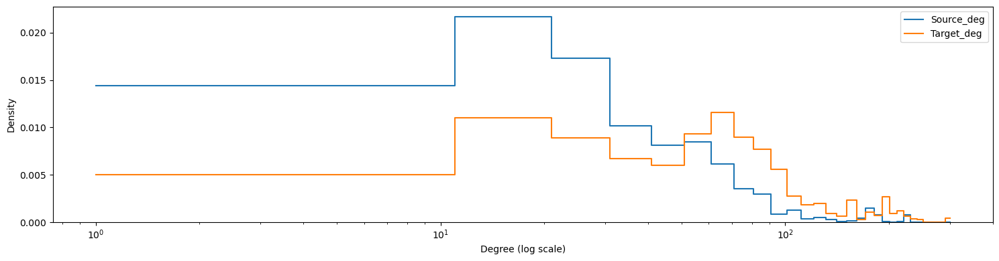

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(15,4))
sns.histplot(stats["Source_deg"], bins=30, stat="density", element="step", fill=False)
sns.histplot(stats["Target_deg"], bins=30, stat="density", element="step", fill=False)
plt.xscale("log")
plt.xlabel("Degree (log scale)")
plt.ylabel("Density")
plt.legend(["Source_deg", "Target_deg"])
plt.tight_layout()
plt.show()

**Backbone sources are typically higher-degree nodes than backbone targets.**

The blue curve (source degree) is consistently shifted to the right, showing **more frequent high-degree predators**,

while the orange curve (target degree) peaks lower and decays earlier, indicating that **backbone targets are generally lower-degree prey or intermediates**.

At the extreme right tail, both curves exhibit rare but very high-degree species, consistent with a **small set of structural hubs** in the backbone.

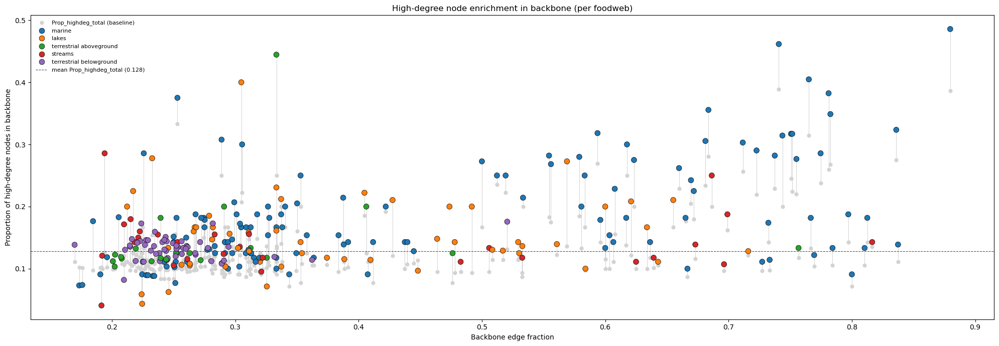

In [42]:
# show enrichment of high-degree nodes in backbone vs total (per foodweb)
df = summary.copy()

plt.figure(figsize=(20,7))
ax = plt.gca()

# light connector lines between total baseline and backbone value (same x)
for _, r in df.iterrows():
    ax.plot(
        [r["Backbone_edge_fraction"], r["Backbone_edge_fraction"]],
        [r["Prop_highdeg_total"], r["Prop_highdeg_backbone"]],
        color="gray", alpha=0.35, linewidth=0.7
    )

# baseline: Prop_highdeg_total as small gray points
ax.scatter(
    df["Backbone_edge_fraction"],
    df["Prop_highdeg_total"],
    color="lightgray",
    s=24,
    label="Prop_highdeg_total (baseline)",
    zorder=2
)

# backbone points colored by ecosystem
sns.scatterplot(
    data=df,
    x="Backbone_edge_fraction",
    y="Prop_highdeg_backbone",
    hue="EcosystemType",
    s=60,
    edgecolor="black",
    linewidth=0.5,
    zorder=3,
    ax=ax
)

# optional global baseline (mean of Prop_highdeg_total)
mean_total = df["Prop_highdeg_total"].mean()
ax.axhline(mean_total, color="k", linestyle="--", linewidth=0.8, alpha=0.7, label=f"mean Prop_highdeg_total ({mean_total:.3f})")

ax.set_xlabel("Backbone edge fraction")
ax.set_ylabel("Proportion of high-degree nodes in backbone")
ax.set_title("High-degree node enrichment in backbone (per foodweb)")
ax.legend(frameon=False, fontsize=8, loc="best")
plt.tight_layout()
plt.show()

**Food webs with larger backbones (higher backbone-edge fractions) tend to show stronger enrichment of high-degree nodes**, meaning hubs are disproportionately represented among backbone links.

Marine systems (blue) dominate this pattern: many marine webs lie well above the baseline (dashed line), showing **particularly strong hub-bias** in their backbones.

Lakes and streams show moderate enrichment, while terrestrial networks (especially below-ground) cluster close to the baseline, indicating **little or no preferential use of high-degree nodes** in their backbones.

/opt/anaconda3/envs/FoodWebs/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


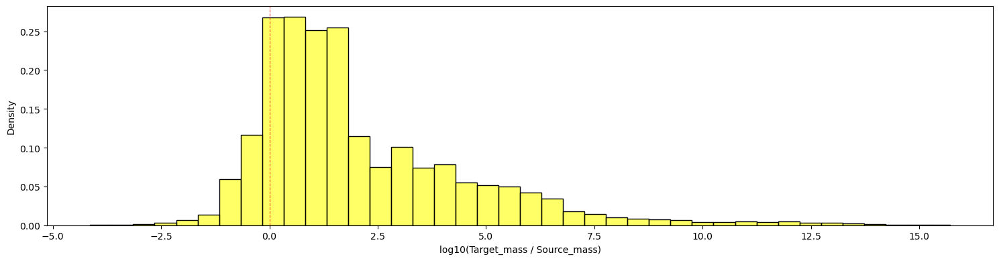

In [43]:
stats_mass = stats.dropna(subset=["Source_mass", "Target_mass"]).copy()
stats_mass["log10_mass_ratio"] = np.log10(stats_mass["Target_mass"] / stats_mass["Source_mass"])

plt.figure(figsize=(15,4))
sns.histplot(stats_mass["log10_mass_ratio"], bins=40, stat="density", fill=True, color="yellow", alpha=0.6)
plt.axvline(0, linestyle="--", color="red", linewidth=0.8, alpha=0.7)  # same mass
plt.xlabel("log10(Target_mass / Source_mass)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

The distribution is **strongly right-skewed**, showing that in most backbone interactions the **consumer is substantially larger than the resource**.

The tallest bars cluster around **0–1**, meaning predators are typically **1–10× heavier** than their prey.

However, the long tail extending to **log₁₀ ratios > 10** reveals a subset of extreme interactions in which predators are **10¹⁰–10¹⁵× larger**—characteristic of food webs where microscopic prey (e.g., plankton, eggs, larvae) form essential backbone links to much larger consumers.

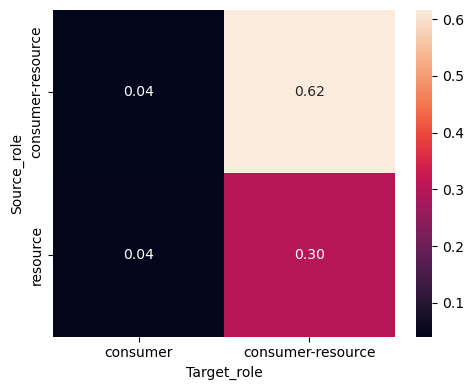

In [44]:
role_ct = pd.crosstab(stats["Source_role"], stats["Target_role"], normalize="all")

plt.figure(figsize=(5,4))
sns.heatmap(role_ct, annot=True, fmt=".2f")
plt.xlabel("Target_role")
plt.ylabel("Source_role")
plt.tight_layout()
plt.show()

This heatmap shows how often different **source → target trophic roles** appear among **backbone links**.

**Key points:**

  * **Most backbone links** (0.62) connect **consumer-resource → consumer-resource** pairs.

    These are species that both consume and are consumed — typically omnivores or intermediate trophic levels.

  * **Resource → consumer-resource** links are also common (0.30), meaning many backbone edges originate from pure resources being eaten by omnivores.

  * **Only ~4%** of backbone edges correspond to **consumer-resource → consumer** or **resource → consumer** relationships — both are comparatively rare.

Backbone links strongly favor interactions involving **consumer-resource species**, highlighting the centrality of trophic generalists/omnivores in the structural core of these food webs.

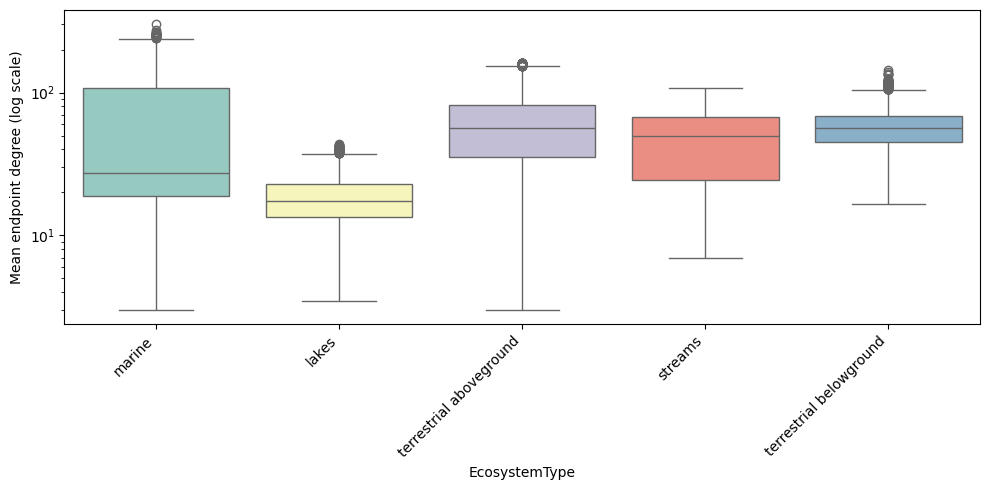

In [54]:
stats_eco = stats.merge(
    summary[["Foodweb", "EcosystemType"]],
    on="Foodweb", how="left"
).assign(
    Deg_mean=lambda d: 0.5*(d["Source_deg"] + d["Target_deg"])
)

plt.figure(figsize=(10,5))
sns.boxplot(
    data=stats_eco,
    x="EcosystemType",
    y="Deg_mean",
    palette="Set3",
    hue="EcosystemType",
)
plt.yscale("log")
plt.xticks(rotation=45, ha="right")
plt.ylabel("Mean endpoint degree (log scale)")
plt.tight_layout()
plt.show()

This boxplot compares the **mean degree of backbone endpoints** (source/target nodes in backbone links), shown on a *log scale*, across ecosystems.

**Key insights:**

* **Marine networks** show the **highest and broadest** degree distribution.
  They contain both very low-degree and extremely high-degree species, revealing a strongly heterogeneous backbone with many hub-like taxa.

* **Terrestrial aboveground** and **terrestrial belowground** systems exhibit **moderately high median degrees**, but with fewer extreme hubs compared to marine networks.

* **Streams** show a similar pattern to terrestrial systems but with slightly lower variability.

* **Lakes** have the **lowest overall backbone degrees**, suggesting their backbone involves fewer high-degree generalists or hub species.

Backbone links in **marine food webs** are dominated by high-degree species (ecological hubs), whereas **lake** systems have simpler, less connected backbones. Terrestrial and stream backbones sit in the middle, with moderate complexity and fewer extreme hubs.

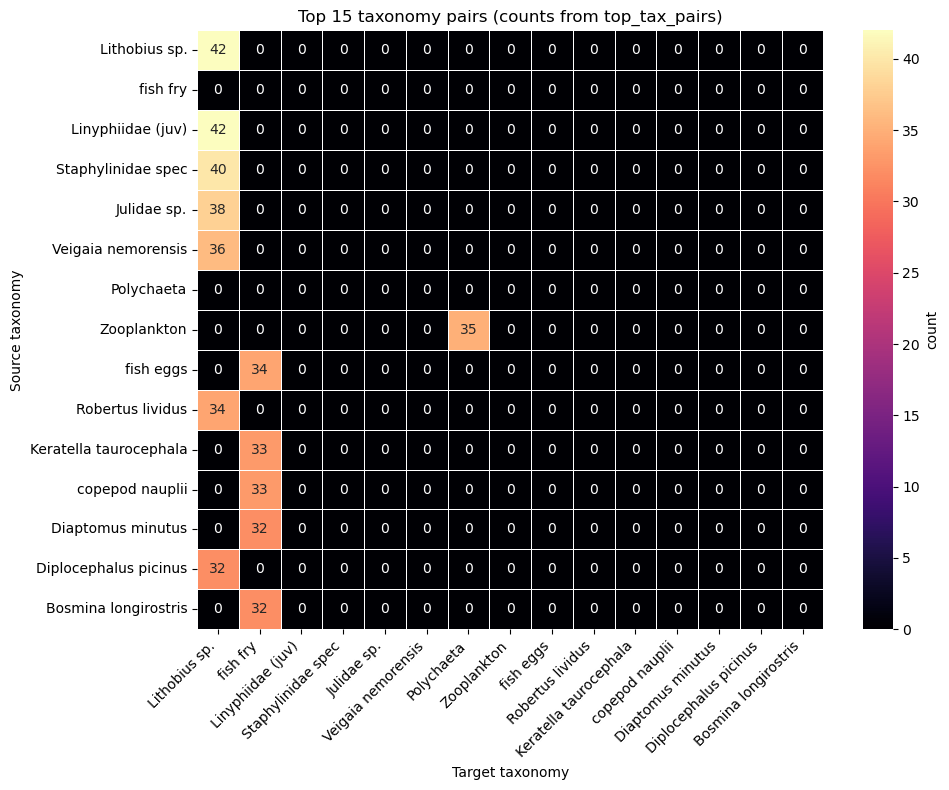

In [46]:
# Taxonomy-pair heatmap (top groups only)
# Uses: top_tax_pairs DataFrame (Source_taxonomy, Target_taxonomy, count)
# Select top taxa (by total appearances in the top pairs), pivot and plot heatmap.

n_groups = 15  # adjust as needed

df = top_tax_pairs.copy()

# totals by taxonomy across source+target within the top pairs table
src_tot = df.groupby("Source_taxonomy")["count"].sum()
tgt_tot = df.groupby("Target_taxonomy")["count"].sum()
tot = src_tot.add(tgt_tot, fill_value=0)
top_taxa = tot.sort_values(ascending=False).head(n_groups).index.tolist()

# pivot to matrix of counts and restrict to selected taxa for both axes
mat = df.pivot_table(
    index="Source_taxonomy",
    columns="Target_taxonomy",
    values="count",
    aggfunc="sum",
    fill_value=0
)

mat = mat.reindex(index=top_taxa, columns=top_taxa, fill_value=0)

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    mat,
    annot=True,
    fmt="g",
    cmap="magma",
    linewidths=0.5,
    cbar_kws={"label": "count"}
)
plt.xlabel("Target taxonomy")
plt.ylabel("Source taxonomy")
plt.title(f"Top {len(top_taxa)} taxonomy pairs (counts from top_tax_pairs)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

The heatmap highlights the **most frequent backbone predator–prey (source→target) taxonomic pairs** across all food webs. A few dominant patterns emerge:

1. **Extreme concentration on a few target taxa.**
   Nearly all high-frequency backbone links point toward **Lithobius sp.**, **fish fry**, and **Polychaeta**, indicating these taxa act as **major energy sinks** or key consumers in their ecosystems.

2. **Very asymmetric interactions.**
   Each source taxon tends to feed predominantly on **one single target taxon**, rather than multiple. This suggests **high prey specialization** in the extracted backbone.

3. **Crustaceans, insect larvae, and detritus dominate the source side.**
   Taxa such as *Linyphiidae (juv)*, *Staphylinidae*, *Robertus lividus*, *copepod nauplii*, and *benthic detritus* appear frequently as **high-importance resource species**.

4. **Lithobius sp. is the single strongest target hub.**
   Several unrelated prey taxa converge into *Lithobius sp.*, highlighting a strong **top-down predatory role**.

5. **fish fry contributes a second major hub.**
   Many planktonic and small benthic prey feed into *fish fry*, reinforcing its role as a **crucial early-life-stage consumer**.